NileGuard  — PDSI Drought Forecasting: CNN+GRU Spatiotemporal Embeddings with Random Forest Regression

Abstract

This pipeline forecasts monthly Palmer Drought Severity Index (PDSI) values across eight governorates of Upper Egypt using a two-stage architecture: a governorate-specific, spatially-cropped CNN+GRU encoder extracts temporal embeddings from climate raster sequences, which are then regressed against future PDSI using per-horizon Random Forest models.


## CELL 1 — IMPORTS + CONFIGURATION

In [5]:
import os
import gc
import random
import warnings
import json
import itertools
import glob
from pathlib import Path

warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import joblib

import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.utils.data import Dataset, DataLoader

from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import Ridge
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.multioutput import MultiOutputRegressor
from scipy.stats import spearmanr

# tqdm: visual progress bar over governorates / outer folds (CELL 14).
try:
    from tqdm.auto import tqdm
except ImportError:
    import sys, subprocess
    print("tqdm not installed -- installing now...")
    subprocess.run([sys.executable, "-m", "pip", "install", "-q", "tqdm"], check=True)
    from tqdm.auto import tqdm

# Optuna: replaces GridSearchCV everywhere in this notebook for
# RandomForestRegressor hyperparameter search (see CELL 11 and CELL 14's
# tune_multioutput_rf_optuna).
try:
    import optuna
except ImportError:
    import sys, subprocess
    print("optuna not installed -- installing now (needs Internet ON in Kaggle Settings)...")
    subprocess.run([sys.executable, "-m", "pip", "install", "-q", "optuna"], check=True)
    import optuna
optuna.logging.set_verbosity(optuna.logging.WARNING)

# -------------------------
# Random Seed
# -------------------------

SEED = 42

os.environ["PYTHONHASHSEED"] = str(SEED)
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)

torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

# -------------------------
# Device
# -------------------------

def _pick_working_device():

    if not torch.cuda.is_available():
        return torch.device("cpu"), "no CUDA device visible"
    try:
        test_gru = torch.nn.GRU(4, 4).to("cuda")
        test_x = torch.zeros(1, 2, 4, device="cuda")
        test_gru(test_x)
        torch.cuda.synchronize()
        return torch.device("cuda"), "GPU test op succeeded"
    except Exception as e:
        return torch.device("cpu"), f"GPU test op FAILED ({type(e).__name__}: {e}) -- falling back to CPU"


device, _device_reason = _pick_working_device()

print("=" * 70)
print("DEVICE:", device, "|", _device_reason)
if device.type == "cpu" and torch.cuda.is_available():
    print("WARNING: a GPU is visible but not usable with this torch/cudnn")
    print("build (mismatch between the installed torch and the assigned")
    print("accelerator). Training will run on CPU and be much slower.")
    print("Try: Settings -> Accelerator -> switch GPU type -> restart")
    print("session, or upgrade torch (see chat for the exact command).")
print("=" * 70)


DEVICE: cuda | GPU test op succeeded


## CELL 2 —PATHS + CONFIGURATION

In [6]:
# -------------------------
# Data & output directories
# -------------------------
from pathlib import Path

# Target filenames from your folder
TENSOR_FILENAME = "nileguard_final_tensor_5d.npy"
SCALER_FILENAME = "nileguard_scalers_objects.joblib"

# Candidate search directories in priority order
CANDIDATE_DIRS = [
    Path("/kaggle/input"),
    Path.home() / "Desktop" / "NileGuard" / "data",
    Path.home() / "Desktop" / "NileGuard",
    Path.cwd() / "data",
    Path.cwd(),
]

# Locate valid directory containing the file
DATA_DIR = None
for directory in CANDIDATE_DIRS:
    if directory.exists():
        if (directory / TENSOR_FILENAME).exists():
            DATA_DIR = directory
            break
        # Fallback recursive search inside folder
        matches = list(directory.rglob(TENSOR_FILENAME))
        if matches:
            DATA_DIR = matches[0].parent
            break

if DATA_DIR is None:
    raise FileNotFoundError(
        f" Could not find '{TENSOR_FILENAME}'. "
        f"Ensure the file is located at Desktop/NileGuard/data"
    )

# Set model output directory
MODELS_DIR = DATA_DIR.parent / "nileguard_models"
MODELS_DIR.mkdir(parents=True, exist_ok=True)

# File Paths
TENSOR_PATH = DATA_DIR / TENSOR_FILENAME
SCALER_PATH = DATA_DIR / SCALER_FILENAME

print(f" Active Directory: {DATA_DIR.resolve()}")
print(f" Tensor Path: {TENSOR_PATH}")
print(f" Scaler Path: {SCALER_PATH}")

# Load Files
tensor_data = np.load(TENSOR_PATH)
scalers = joblib.load(SCALER_PATH) if SCALER_PATH.exists() else None

print(f"\n Tensor Loaded Successfully! Shape: {tensor_data.shape}")

# -------------------------
# Load tensor + channel statistics
# -------------------------
import numpy as np
import pandas as pd

tensor = np.load(TENSOR_PATH)

if tensor.shape[-1] == 1:
    tensor = np.squeeze(tensor, axis=-1)

rows = []

for ch in range(tensor.shape[-1]):
    data = tensor[..., ch]

    rows.append({
        "Channel": ch,
        "Shape": data.shape,
        "Min": np.nanmin(data),
        "Max": np.nanmax(data),
        "Mean": np.nanmean(data),
        "Std": np.nanstd(data),
    })

df_channels = pd.DataFrame(rows)

display(df_channels)

# -------------------------
# Channels
# -------------------------

PDSI_CHANNEL = 2
GOV_CHANNEL = 13
TOTAL_CHANNELS = 14

# -------------------------
# Data Split
# -------------------------

TRAIN_RATIO = 0.70
VAL_RATIO = 0.15
TEST_RATIO = 0.15

# -------------------------
# CNN Configuration
# -------------------------

EPOCHS = 40
BATCH_SIZE = 16
PATIENCE = 12

# LR scheduler: halves the LR whenever val loss stalls for
# LR_SCHEDULER_PATIENCE epochs. Kept shorter than PATIENCE (the early
# stopping patience) so the LR gets a chance to drop and potentially
# rescue training before early stopping gives up entirely.
LR_SCHEDULER_FACTOR = 0.5
LR_SCHEDULER_PATIENCE = 4
LR_MIN = 1e-6

# -------------------------
# Loss function
# -------------------------
# Huber (a.k.a. smooth-L1) instead of plain MSE: squared-error loss
# below |error| < HUBER_DELTA, linear beyond it, so a handful of
# extreme-outlier months (e.g. a rare very deep drought/flood) don't
# dominate the gradient the way squared error would. delta=1.0 is on
# the PDSI scale itself (PDSI typically ranges roughly -6..+6), so
# errors under ~1 PDSI unit are treated as normal noise (quadratic)
# and only larger misses get down-weighted to linear.
HUBER_DELTA = 1.0
USE_DELTA_TARGET = True
# -------------------------
# Small-governorate fallback
# -------------------------
# Any governorate whose FULL mask has fewer pixels than this uses a
# tabular Random Forest directly on averaged climate features instead

MIN_PIXELS_FOR_CNN = 30

# -------------------------
# Random Forest hyperparameter search (Optuna -- replaces GridSearchCV)
# -------------------------
# RandomForestRegressor hyperparameters are now tuned with an Optuna

OPTUNA_N_TRIALS = 25
OPTUNA_VAL_FRAC = 0.15
OPTUNA_MIN_TRAIN_ROWS = 40
RF_MIN_SAMPLES_FOR_GRID_SEARCH = OPTUNA_MIN_TRAIN_ROWS

print("Configuration Loaded Successfully")
print(f"TENSOR_PATH: {TENSOR_PATH}")
print(f"MODELS_DIR : {MODELS_DIR}")

 Active Directory: C:\Users\S-GF-L1-D10\Desktop\NileGuard\data
 Tensor Path: C:\Users\S-GF-L1-D10\Desktop\NileGuard\data\nileguard_final_tensor_5d.npy
 Scaler Path: C:\Users\S-GF-L1-D10\Desktop\NileGuard\data\nileguard_scalers_objects.joblib

 Tensor Loaded Successfully! Shape: (768, 144, 72, 14, 1)


,Channel,Shape,Min,Max,Mean,Std
0,0,"(768, 144, 72)",0.000000,45.575459,1.588470,3.708023
1,1,"(768, 144, 72)",-1.456981,1.495942,-0.057198,0.532927
2,2,"(768, 144, 72)",-1.702797,7.150349,0.197189,0.816146
3,3,"(768, 144, 72)",-1.460976,1.497561,-0.056477,0.531895
4,4,"(768, 144, 72)",0.000000,46.106819,1.610782,3.786948
5,5,"(768, 144, 72)",0.000000,1.609438,0.011803,0.053458
6,6,"(768, 144, 72)",-0.647070,3.272466,0.268878,0.580682
7,7,"(768, 144, 72)",-2.440710,0.661065,-0.128105,0.574507
8,8,"(768, 144, 72)",-2.616667,1.208333,-0.080589,0.629192
9,9,"(768, 144, 72)",-1.388430,1.223140,-0.044221,0.557077


Configuration Loaded Successfully
TENSOR_PATH: C:\Users\S-GF-L1-D10\Desktop\NileGuard\data\nileguard_final_tensor_5d.npy
MODELS_DIR : C:\Users\S-GF-L1-D10\Desktop\NileGuard\nileguard_models


## CELL 2b — FEATURE ENGINEERING CONFIGURATION + UTILITIES (cyclical encoding, lags, rolling stats)

In [7]:
# =====================================================================
# CELL 2b — FEATURE ENGINEERING CONFIGURATION + UTILITIES
# =====================================================================
LAG_STEPS = [1, 2, 3, 6, 12]
ROLLING_WINDOWS = [3, 6, 12]

CLIMATE_FEATURE_NAMES = ["aet", "def", "pet", "ppt", "q", "soil",
                          "srad", "tmax", "tmin", "vap", "vpd", "ws"]

CLIMATE_CHANNEL_INDEX = {name: idx for idx, name in enumerate(CLIMATE_FEATURE_NAMES)}

CLIMATE_LAG_CHANNELS = {
    "ppt":  CLIMATE_CHANNEL_INDEX["ppt"],
    "tmax": CLIMATE_CHANNEL_INDEX["tmax"],
    "tmin": CLIMATE_CHANNEL_INDEX["tmin"],
    "soil": CLIMATE_CHANNEL_INDEX["soil"],
    "vpd":  CLIMATE_CHANNEL_INDEX["vpd"],
}


def add_cyclical_month_features(df, month_col="month"):
    angle = 2 * np.pi * df[month_col].astype(float) / 12.0
    df[f"{month_col}_sin"] = np.sin(angle)
    df[f"{month_col}_cos"] = np.cos(angle)
    return df


def add_lag_features(df, columns, lags=None):
    """Adds `<col>_lag<k>` = df[col].shift(k) for every column x lag combination."""
    if lags is None:
        lags = LAG_STEPS
    for col in columns:
        for k in lags:
            df[f"{col}_lag{k}"] = df[col].shift(k)
    return df


def add_rolling_features(df, columns, windows=None):
    """`.shift(1)` BEFORE `.rolling()` -- mandatory to avoid leaking y[t]
    into its own rolling-window feature."""
    if windows is None:
        windows = ROLLING_WINDOWS
    for col in columns:
        shifted = df[col].shift(1)
        for w in windows:
            df[f"{col}_roll{w}_mean"] = shifted.rolling(window=w).mean()
            df[f"{col}_roll{w}_std"]  = shifted.rolling(window=w).std()
    return df


def engineer_time_series_features(df, lag_columns, rolling_columns,
                                   month_col="month", lags=None,
                                   windows=None, dropna=True):
    if lags is None:
        lags = LAG_STEPS
    if windows is None:
        windows = ROLLING_WINDOWS
    out = df.copy()
    out = add_cyclical_month_features(out, month_col=month_col)
    out = add_lag_features(out, lag_columns, lags=lags)
    out = add_rolling_features(out, rolling_columns, windows=windows)
    if dropna:
        out = out.dropna().reset_index(drop=True)
    return out


def reconstruct_pdsi_from_delta(base_pdsi, delta_pred):

    return np.asarray(base_pdsi) + np.asarray(delta_pred)


print("Feature engineering utilities loaded:")
print(f"  LAG_STEPS            = {LAG_STEPS}")
print(f"  ROLLING_WINDOWS       = {ROLLING_WINDOWS}")
print(f"  CLIMATE_CHANNEL_INDEX = {CLIMATE_CHANNEL_INDEX}")
print(f"  CLIMATE_LAG_CHANNELS  = {CLIMATE_LAG_CHANNELS}")

Feature engineering utilities loaded:
  LAG_STEPS            = [1, 2, 3, 6, 12]
  ROLLING_WINDOWS       = [3, 6, 12]
  CLIMATE_CHANNEL_INDEX = {'aet': 0, 'def': 1, 'pet': 2, 'ppt': 3, 'q': 4, 'soil': 5, 'srad': 6, 'tmax': 7, 'tmin': 8, 'vap': 9, 'vpd': 10, 'ws': 11}
  CLIMATE_LAG_CHANNELS  = {'ppt': 3, 'tmax': 7, 'tmin': 8, 'soil': 5, 'vpd': 10}


## CELL 3 — HORIZON + CNN GRID-SEARCH CONFIGURATION

In [8]:
# -------------------------
# Forecast horizons
# -------------------------

HORIZONS = [1, 3, 6, 9, 12]
# CNN architecture -- SHARED across governorates (transfer learning)
# -------------------------
# Replaces the old per-governorate CNN_PARAM_GRID search: instead of trying
# many architectures per governorate, we now train ONE architecture jointly
# across ALL governorates , then fine-tune that
# same architecture per target governorate in CELL 14. Because CELL 9's
# TimeDistributedCNN applies spatial-attention pooling before the GRU
# encoder, this single set of weights works unchanged on any
# governorate's crop size.
SHARED_CNN_CONFIG = {
    "cnn_filters_1": 32,
    "cnn_filters_2": 64,
    "embedding_dim": 64,
    "dropout": 0.3,
    "learning_rate": 1e-3,
}
# Fine-tune learning rate: per engineering guideline, kept LIGHT (1e-4 to
# 5e-5) now that conv1/conv2 are FROZEN during fine-tuning (see
# freeze_early_conv_layers, CELL 9) -- only the GRU + embedding +
# regressor update, so a larger LR is no longer needed/safe here.
# FINETUNE_LR_GRID is grid-searched per governorate alongside
# (lookback, horizon) in CELL 14; FINETUNE_LR is kept as the single
# fallback value used by generate_oof_embeddings' OOF folds (CELL 10c),
# which reuse the WINNING finetune_lr passed in rather than re-searching.
FINETUNE_LR = 1e-4
FINETUNE_LR_GRID = [1e-4, 7.5e-5, 5e-5]


CNN_PARAM_GRID = {
    "cnn_filters_1": [32, 64],
    "cnn_filters_2": [64, 128],
    "embedding_dim": [64, 128, 256],
    "dropout": [0.2, 0.3],
    "learning_rate": [1e-3],
}
# Search-phase CNN training uses a SHORTENED schedule so every (lookback,
# horizon) combo can be ranked by validation R2 without paying full EPOCHS
# for each one. Only the single overall winner per governorate is retrained
# at the full EPOCHS/PATIENCE (see CELL 12/14) before final save/report.
SEARCH_EPOCHS = 30
SEARCH_PATIENCE = 10

# -------------------------
# Shared pretraining (CELL 13b)
# -------------------------
PRETRAIN_LOOKBACK = 24
PRETRAIN_HORIZON = 3
PRETRAIN_EPOCHS = 25
PRETRAIN_PATIENCE = 8

# -------------------------
# Extreme-drought-weighted loss (train_cnn / shared pretraining)
# -------------------------
# PDSI < DROUGHT_THRESHOLD (moderate-to-extreme drought on the Palmer
# scale) gets its Huber loss multiplied by DROUGHT_LOSS_WEIGHT during
# CNN training (see weighted_huber_loss, CELL 9). The base model was
# systematically undershooting the depth of real drought months
# (regressing toward the mean); this counteracts that without
# abandoning Huber's outlier-robustness for the rest of the series.
# Same threshold CELL 20's extreme_drought_metrics reports on, so
# "train harder on X" and "measure success on X" stay in sync.
DROUGHT_THRESHOLD = -2.0
DROUGHT_LOSS_WEIGHT = 3.0   # 2-3x heavier loss on drought months; tune here

# -------------------------
# Time-series OOF embeddings (leak-free CNN -> RF ensemble stacking)
# -------------------------

N_OOF_SPLITS = 3
OOF_EPOCHS = 15

OOF_PATIENCE = 6
OOF_MIN_FOLD_SIZE = 8

# -------------------------
#  checkpointing (resume-safe)
# -------------------------
print("Horizon + CNN grid-search configuration loaded")
print(f"HORIZONS: {HORIZONS}")
print(f"CNN_PARAM_GRID combos: {len(list(itertools.product(*CNN_PARAM_GRID.values())))}")

LOOKBACKS = {
    "Aswan":    [24],
    "Asyut":    [24],
    "BeniSuef": [24],
    "Fayoum":   [24],
    "Luxor":    [24],
    "Minya":    [24],
    "Qena":     [24],
    "Sohag":    [24],
}


ALL_GOV_IDS = {
    "Aswan": 1, "Asyut": 2, "BeniSuef": 3, "Fayoum": 4,
    "Luxor": 5, "Minya": 6, "Qena": 7, "Sohag": 8,
}
GOV_IDS = ALL_GOV_IDS
print("Governorates (pretraining pool):", list(ALL_GOV_IDS.keys()))
print("Governorates (fine-tune target):", list(GOV_IDS.keys()))



Horizon + CNN grid-search configuration loaded
HORIZONS: [1, 3, 6, 9, 12]
CNN_PARAM_GRID combos: 24
Governorates (pretraining pool): ['Aswan', 'Asyut', 'BeniSuef', 'Fayoum', 'Luxor', 'Minya', 'Qena', 'Sohag']
Governorates (fine-tune target): ['Aswan', 'Asyut', 'BeniSuef', 'Fayoum', 'Luxor', 'Minya', 'Qena', 'Sohag']


## CELL 4 — LOAD TENSOR

In [9]:
print("=" * 70)
print("LOADING TENSOR")
print("=" * 70)

raw = np.load(TENSOR_PATH, mmap_mode="r")

print("Original Shape:", raw.shape)
print("Original Dtype:", raw.dtype)

if raw.ndim == 5:
    print("5D Tensor Detected")
    tensor = np.squeeze(raw, axis=-1)
elif raw.ndim == 4:
    print("4D Tensor Detected")
    tensor = raw
else:
    raise ValueError(f"Unsupported shape: {raw.shape}")

TIME, HEIGHT, WIDTH, CHANNELS = tensor.shape

print("=" * 70)
print("TIME     :", TIME)
print("HEIGHT   :", HEIGHT)
print("WIDTH    :", WIDTH)
print("CHANNELS :", CHANNELS)
print("=" * 70)

if CHANNELS != TOTAL_CHANNELS:
    raise ValueError(
        f"Expected {TOTAL_CHANNELS} channels, but found {CHANNELS}."
    )

LOADING TENSOR
Original Shape: (768, 144, 72, 14, 1)
Original Dtype: float32
5D Tensor Detected
TIME     : 768
HEIGHT   : 144
WIDTH    : 72
CHANNELS : 14


## CELL 5 — EXTRACT DATA COMPONENTS

In [10]:
pdsi = np.asarray(tensor[..., PDSI_CHANNEL], dtype=np.float32)
gov_map = np.asarray(tensor[0, ..., GOV_CHANNEL], dtype=np.float32)

climate = np.delete(
    np.asarray(tensor, dtype=np.float32),
    [PDSI_CHANNEL, GOV_CHANNEL],
    axis=-1,
)

NUM_CLIMATE_FEATURES = climate.shape[-1]

print("=" * 70)
print("PDSI Shape:", pdsi.shape)
print("Governor Map Shape:", gov_map.shape)
print("Climate Shape:", climate.shape)
print("Climate Features:", NUM_CLIMATE_FEATURES)
print("PDSI Min:", np.nanmin(pdsi))
print("PDSI Max:", np.nanmax(pdsi))
print("=" * 70)

PDSI Shape: (768, 144, 72)
Governor Map Shape: (144, 72)
Climate Shape: (768, 144, 72, 12)
Climate Features: 12
PDSI Min: -1.7027972
PDSI Max: 7.150349


## CELL 6 — GOVERNOR MASKS + BOUNDING BOXES

In [11]:
gov_masks = {}
gov_bboxes = {}
gov_pixel_counts = {}

print("=" * 70)
print("CREATING GOVERNOR MASKS + BOUNDING BOXES (ALL governorates -- ")
print("needed for shared pretraining in CELL 13b, not just the GOV_IDS target)")
print("=" * 70)

for gov_name, gov_id in ALL_GOV_IDS.items():
    mask = (gov_map == gov_id)
    gov_masks[gov_name] = mask

    pixel_count = int(mask.sum())
    gov_pixel_counts[gov_name] = pixel_count

    rows = np.where(mask.any(axis=1))[0]
    cols = np.where(mask.any(axis=0))[0]

    if len(rows) == 0 or len(cols) == 0:
        raise ValueError(f"{gov_name}: mask is empty, cannot build bounding box")

    r0, r1 = rows.min(), rows.max() + 1
    c0, c1 = cols.min(), cols.max() + 1
    gov_bboxes[gov_name] = (r0, r1, c0, c1)

    uses_cnn = pixel_count >= MIN_PIXELS_FOR_CNN
    bbox_h, bbox_w = r1 - r0, c1 - c0
    print(
        f"{gov_name:<10} Pixels: {pixel_count:<5} "
        f"BBox: rows[{r0}:{r1}] cols[{c0}:{c1}] ({bbox_h}x{bbox_w}) "
        f"-> {'CNN-RF-GRU' if uses_cnn else 'TABULAR RF (few pixels)'}"
    )

print("=" * 70)
print("Governor Masks Created Successfully")

CREATING GOVERNOR MASKS + BOUNDING BOXES (ALL governorates -- 
needed for shared pretraining in CELL 13b, not just the GOV_IDS target)
Aswan      Pixels: 140   BBox: rows[0:14] cols[20:37] (14x17) -> CNN-RF-GRU
Asyut      Pixels: 732   BBox: rows[17:39] cols[1:57] (22x56) -> CNN-RF-GRU
BeniSuef   Pixels: 14    BBox: rows[71:76] cols[56:61] (5x5) -> TABULAR RF (few pixels)
Fayoum     Pixels: 1377  BBox: rows[80:144] cols[36:71] (64x35) -> CNN-RF-GRU
Luxor      Pixels: 384   BBox: rows[34:53] cols[29:59] (19x30) -> CNN-RF-GRU
Minya      Pixels: 247   BBox: rows[6:27] cols[18:48] (21x30) -> CNN-RF-GRU
Qena       Pixels: 304   BBox: rows[55:82] cols[49:72] (27x23) -> CNN-RF-GRU
Sohag      Pixels: 228   BBox: rows[44:65] cols[40:60] (21x20) -> CNN-RF-GRU
Governor Masks Created Successfully


## CELL 7 — TRAIN/VAL/TEST INDEX SPLIT (per lookback)

In [12]:
def get_split_indices(lookback, horizon):
    """Compute chronological train/val/test split indices for a given lookback/horizon combination."""
    total_samples = TIME - lookback - horizon + 1
    train_end = int(total_samples * TRAIN_RATIO)
    val_end = int(total_samples * (TRAIN_RATIO + VAL_RATIO))

    val_start = train_end + lookback
    test_start = val_end + lookback

    # Strict chronological + gap guarantee, enforced in code  train samples must all precede val samples (with a
    # lookback-sized gap), which must all precede test samples (with
    # another lookback-sized gap) -- prevents any accidental future-into-
    # past leakage if TRAIN_RATIO/VAL_RATIO are ever edited.
    assert 0 < train_end < val_start <= val_end < test_start <= total_samples, (
        f"non-chronological or leaking split: train_end={train_end}, "
        f"val_start={val_start}, val_end={val_end}, test_start={test_start}, "
        f"total_samples={total_samples}"
    )
    return train_end, val_start, val_end, test_start, total_samples


## CELL 8 — MEMORY-SAFE DATASET (masked + cropped + standardized) + DATA LOADERS

In [13]:
def fit_climate_scaler(climate_data, mask, r0, r1, c0, c1, start_index, end_index):

    crop_mask = mask[r0:r1, c0:c1]
    train_climate = climate_data[start_index:end_index, r0:r1, c0:c1, :]

    n_channels = train_climate.shape[-1]
    means = np.zeros(n_channels, dtype=np.float64)
    stds = np.ones(n_channels, dtype=np.float64)

    for ch in range(n_channels):
        values = train_climate[:, crop_mask, ch]
        values = np.nan_to_num(values, nan=0.0, posinf=0.0, neginf=0.0)
        m = values.mean()
        s = values.std()
        means[ch] = m
        stds[ch] = 1.0 if s < 1e-6 else s

    return means, stds


def create_loaders(climate_data, pdsi_data, mask, bbox, lookback, horizon):

    train_end, val_start, val_end, test_start, total_samples = get_split_indices(
        lookback, horizon
    )

    r0, r1, c0, c1 = bbox


    mean, std = fit_climate_scaler(climate_data, mask, r0, r1, c0, c1, 0, train_end + lookback)

    train_dataset = ClimateSequenceDataset(
        climate_data,
        pdsi_data,
        mask,
        bbox,
        lookback,
        horizon,
        0,
        train_end,
        mean,
        std,
        use_delta_target=USE_DELTA_TARGET
    )


    val_dataset = ClimateSequenceDataset(
        climate_data,
        pdsi_data,
        mask,
        bbox,
        lookback,
        horizon,
        val_start,
        val_end,
        mean,
        std,
        use_delta_target=USE_DELTA_TARGET
    )


    test_dataset = ClimateSequenceDataset(
        climate_data,
        pdsi_data,
        mask,
        bbox,
        lookback,
        horizon,
        test_start,
        total_samples,
        mean,
        std,
        use_delta_target=USE_DELTA_TARGET
    )



    train_loader = DataLoader(
        train_dataset,
        batch_size=BATCH_SIZE,
        shuffle=False
    )


    val_loader = DataLoader(
        val_dataset,
        batch_size=BATCH_SIZE,
        shuffle=False
    )


    test_loader = DataLoader(
        test_dataset,
        batch_size=BATCH_SIZE,
        shuffle=False
    )


    return train_loader, val_loader, test_loader


## CELL 9 — TIME DISTRIBUTED CNN + GRU

In [14]:
# =====================================================================
# CELL 9 — MEMORY-SAFE DATASET  + CNN & ATTENTION
# =====================================================================

import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.utils.data import Dataset, DataLoader
import gc


class ClimateSequenceDataset(Dataset):

    def __init__(self, climate_data, pdsi_data, mask, bbox, lookback, horizon,
                 start_index, end_index, mean, std, use_delta_target=True):

        self.climate = climate_data
        self.pdsi = pdsi_data
        self.mask = mask

        self.r0, self.r1, self.c0, self.c1 = bbox
        self.crop_mask = mask[self.r0:self.r1, self.c0:self.c1]

        self.lookback = lookback
        self.horizon = horizon

        self.start_index = start_index
        self.end_index = end_index

        self.use_delta_target = use_delta_target

        # Per-channel z-score stats, fit on TRAIN only
        self.mean = np.asarray(mean).reshape(1, 1, 1, -1)
        self.std = np.asarray(std).reshape(1, 1, 1, -1)

    def __len__(self):
        return self.end_index - self.start_index

    def __getitem__(self, idx):
        t = self.start_index + idx + self.lookback

        # Input sequence (lookback, crop_h, crop_w, channels)
        x = self.climate[
            t - self.lookback:t,
            self.r0:self.r1,
            self.c0:self.c1,
            :
        ]

        x = np.nan_to_num(x, nan=0.0, posinf=0.0, neginf=0.0)

        x = (x - self.mean) / self.std

        x = x * self.crop_mask[None, :, :, None]

        x = np.transpose(x, (0, 3, 1, 2))

        target_t = t + self.horizon - 1
        y_map = self.pdsi[target_t]
        y_abs = np.nanmean(y_map[self.mask])
        y_abs = np.nan_to_num(y_abs, nan=0.0, posinf=0.0, neginf=0.0)

        if self.use_delta_target:
            base_map = self.pdsi[t - 1]
            y_base = np.nanmean(base_map[self.mask])
            y_base = np.nan_to_num(y_base, nan=0.0, posinf=0.0, neginf=0.0)
            y = y_abs - y_base
        else:
            y = y_abs

        return (
            torch.tensor(x, dtype=torch.float32),
            torch.tensor([y], dtype=torch.float32)
        )


class SpatialAttentionPooling(nn.Module):

    def __init__(self, in_channels):
        super().__init__()
        self.attn_score = nn.Conv2d(in_channels, 1, kernel_size=1)

    def forward(self, feat, mask):
        B, C, H, W = feat.shape
        mask = mask.to(dtype=feat.dtype, device=feat.device)
        mask_flat = mask.view(1, -1)

        logits = self.attn_score(feat).view(B, -1)  # (B, H*W)
        mask_expanded = mask_flat.expand(B, -1)

        logits = logits.masked_fill(mask_expanded == 0, -1e9)

        max_val = torch.max(logits, dim=-1, keepdim=True).values
        max_val = torch.where(max_val == -1e9, torch.zeros_like(max_val), max_val)

        exp_logits = torch.exp(logits - max_val) * mask_expanded
        sum_exp = exp_logits.sum(dim=-1, keepdim=True)

        attn_flat = torch.where(
            sum_exp > 1e-12,
            exp_logits / (sum_exp + 1e-12),
            torch.zeros_like(exp_logits)
        )
        attn = attn_flat.view(B, 1, H, W)

        weighted = feat * attn
        return weighted.sum(dim=(2, 3))


class TimeDistributedCNN(nn.Module):

    def __init__(
        self,
        in_channels,
        crop_mask,
        embedding_dim=64,
        filters_1=32,
        filters_2=64,
        dropout=0.30,
    ):
        super().__init__()

        self.conv1 = nn.Conv2d(in_channels, filters_1, kernel_size=3, padding=1)
        self.relu1 = nn.ReLU()
        self.conv2 = nn.Conv2d(filters_1, filters_2, kernel_size=3, padding=1)
        self.relu2 = nn.ReLU()

        self.spatial_attn = SpatialAttentionPooling(filters_2)
        crop_mask_t = torch.as_tensor(np.asarray(crop_mask), dtype=torch.float32)
        self.register_buffer("crop_mask", crop_mask_t)

        self.gru = nn.GRU(
            input_size=filters_2,
            hidden_size=filters_2,
            num_layers=1,
            batch_first=True,
            bidirectional=False,
        )

        self.post_gru = nn.Dropout(dropout)

        self.embedding = nn.Linear(filters_2, embedding_dim)
        self.regressor = nn.Linear(embedding_dim, 1)

    def forward(
        self,
        x,
        return_embedding=False,
        crop_mask=None,
    ):
        active_mask = crop_mask if crop_mask is not None else self.crop_mask
        time_features = []

        for t in range(x.size(1)):
            xt = x[:, t]
            m = active_mask[None, None, :, :].to(dtype=xt.dtype, device=xt.device)

            ft = self.relu1(self.conv1(xt))
            ft = ft * m

            ft = self.relu2(self.conv2(ft))
            ft = ft * m

            ft = self.spatial_attn(ft, active_mask)
            time_features.append(ft)

        features = torch.stack(time_features, dim=1)

        gru_out, _ = self.gru(features)
        last = gru_out[:, -1]

        embedding = self.embedding(last)
        embedding = self.post_gru(embedding)

        output = self.regressor(embedding)

        if return_embedding:
            return output, embedding

        return output


def freeze_early_conv_layers(model):
    for param in model.conv1.parameters():
        param.requires_grad = False
    for param in model.conv2.parameters():
        param.requires_grad = False
    return model


# =====================================================================
# CELL 12 — LOSS FUNCTION & TRAINING LOGIC
# =====================================================================

def weighted_huber_loss(predictions, targets, huber_delta=1.0,
                         drought_threshold=None, drought_weight=None):
    if drought_threshold is None:
        drought_threshold = DROUGHT_THRESHOLD
    if drought_weight is None:
        drought_weight = DROUGHT_LOSS_WEIGHT

    diff = predictions - targets
    abs_diff = diff.abs()
    quadratic = torch.clamp(abs_diff, max=huber_delta)
    linear = abs_diff - quadratic
    elementwise = 0.5 * quadratic ** 2 + huber_delta * linear

    weights = torch.where(
        targets < drought_threshold,
        torch.full_like(targets, drought_weight),
        torch.ones_like(targets),
    )

    return (elementwise * weights).mean()


def train_cnn(model, train_loader, val_loader,
              learning_rate=1e-3, epochs=EPOCHS, patience=PATIENCE,
              huber_delta=HUBER_DELTA):

    optimizer = optim.Adam(
        (p for p in model.parameters() if p.requires_grad),
        lr=learning_rate, weight_decay=1e-5,
    )

    scheduler = ReduceLROnPlateau(
        optimizer,
        mode="min",
        factor=LR_SCHEDULER_FACTOR,
        patience=LR_SCHEDULER_PATIENCE,
        min_lr=LR_MIN,
    )

    best_val_loss = np.inf
    best_state = None
    patience_counter = 0
    train_losses = []
    val_losses = []

    for epoch in range(epochs):
        model.train()
        running_loss = 0.0
        for X_batch, y_batch in train_loader:
            X_batch = X_batch.to(device)
            y_batch = y_batch.to(device)

            optimizer.zero_grad()
            predictions = model(X_batch)
            loss = weighted_huber_loss(predictions, y_batch, huber_delta=huber_delta)
            loss.backward()

            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=5.0)

            optimizer.step()
            running_loss += loss.item()

        train_loss = running_loss / len(train_loader)

        model.eval()
        running_val_loss = 0.0
        with torch.no_grad():
            for X_batch, y_batch in val_loader:
                X_batch = X_batch.to(device)
                y_batch = y_batch.to(device)
                predictions = model(X_batch)
                loss = weighted_huber_loss(predictions, y_batch, huber_delta=huber_delta)
                running_val_loss += loss.item()

        val_loss = running_val_loss / len(val_loader)

        train_losses.append(train_loss)
        val_losses.append(val_loss)

        current_lr = optimizer.param_groups[0]["lr"]
        print(f"Epoch {epoch + 1:02d}/{epochs} | Train: {train_loss:.5f} | Val: {val_loss:.5f} | LR: {current_lr:.2e}")

        scheduler.step(val_loss)

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
            patience_counter = 0

        else:
            patience_counter += 1
            if patience_counter >= patience:
                print("Early stopping")
                break

        gc.collect()

        if torch.cuda.is_available():
            torch.cuda.empty_cache()

    if best_state is not None:
        model.load_state_dict(best_state)

    return model, train_losses, val_losses

print("Dataset & TimeDistributedCNN Classes updated with fixes successfully.")

Dataset & TimeDistributedCNN Classes updated with fixes successfully.


## CELL 10 — TRAINING FUNCTION + EXTRACT CNN EMBEDDINGS

In [15]:
def extract_embeddings(model, loader):
    model.eval()
    embeddings = []
    direct_preds = []
    targets = []

    with torch.no_grad():
        for X_batch, y_batch in loader:
            X_batch = X_batch.to(device)
            output, embedding = model(X_batch, return_embedding=True)
            embeddings.append(embedding.cpu().numpy())
            direct_preds.append(output.cpu().numpy())
            targets.append(y_batch.numpy())

    embeddings = np.concatenate(embeddings, axis=0)
    direct_preds = np.concatenate(direct_preds, axis=0)
    targets = np.concatenate(targets, axis=0)
    return embeddings.astype(np.float32), direct_preds.astype(np.float32), targets.astype(np.float32)


print("Embedding Function Created (also returns the CNN's own direct prediction)")

Embedding Function Created (also returns the CNN's own direct prediction)


## CELL 10c — TIME-SERIES OOF EMBEDDINGS (leak-free CNN → Random Forest ensemble)


In [16]:
# =====================================================================
# CELL 10c — TIME-SERIES OOF EMBEDDINGS (leak-free CNN → RF ensemble)
# =====================================================================

def create_range_loader(climate_data, pdsi_data, mask, bbox, lookback, horizon,
                         start_index, end_index, mean, std,
                         batch_size=BATCH_SIZE, shuffle=False,
                         use_delta_target=USE_DELTA_TARGET):
    """
    Build a single DataLoader over an arbitrary CHRONOLOGICAL index range,
    reusing an already-fitted (mean, std) climate scaler and supporting Delta Y target.
    """
    dataset = ClimateSequenceDataset(
        climate_data, pdsi_data, mask, bbox, lookback, horizon,
        start_index, end_index, mean, std,
        use_delta_target=use_delta_target
    )
    return DataLoader(dataset, batch_size=batch_size, shuffle=shuffle)


def generate_oof_embeddings(climate_data, pdsi_data, mask, bbox, lookback, horizon,
                             cnn_cfg, learning_rate=FINETUNE_LR, n_splits=N_OOF_SPLITS,
                             oof_epochs=OOF_EPOCHS, oof_patience=OOF_PATIENCE,
                             min_fold_size=OOF_MIN_FOLD_SIZE,
                             pretrained_state_dict=None,
                             use_delta_target=USE_DELTA_TARGET):
    """
    Time-series (expanding-window) Out-Of-Fold embeddings for the TRAIN
    segment only -- used as the Random Forest's TRAINING features.

    Fixes Applied:
    1. Pass pretrained_state_dict explicitly to resolve NameError.
    2. Pass use_delta_target flag to guarantee target alignment (\Delta Y).
    """
    total_samples = len(climate_data) - lookback - horizon + 1
    train_end = int(total_samples * TRAIN_RATIO)

    r0, r1, c0, c1 = bbox
    mean, std = fit_climate_scaler(climate_data, mask, r0, r1, c0, c1, 0, train_end + lookback)

    n_splits_eff = n_splits
    while n_splits_eff >= 1 and train_end < (n_splits_eff + 1) * min_fold_size:
        n_splits_eff -= 1
    if n_splits_eff < 1:
        print(f"  [OOF] only {train_end} TRAIN rows at lookback={lookback}, "
              f"horizon={horizon} -- too few to fold safely; falling back to "
              f"a single chronological split (n_splits=1).")
        n_splits_eff = 1

    tscv = TimeSeriesSplit(n_splits=n_splits_eff)
    fold_splits = list(tscv.split(np.arange(train_end)))

    emb_chunks, y_chunks = [], []

    for fold_i, (fold_train_idx, fold_holdout_idx) in enumerate(fold_splits):
        f_train_start, f_train_end = int(fold_train_idx[0]), int(fold_train_idx[-1]) + 1
        f_hold_start, f_hold_end = int(fold_holdout_idx[0]), int(fold_holdout_idx[-1]) + 1

        fold_train_loader = create_range_loader(
            climate_data, pdsi_data, mask, bbox, lookback, horizon,
            f_train_start, f_train_end, mean, std, shuffle=False,
            use_delta_target=use_delta_target
        )
        fold_holdout_loader = create_range_loader(
            climate_data, pdsi_data, mask, bbox, lookback, horizon,
            f_hold_start, f_hold_end, mean, std, shuffle=False,
            use_delta_target=use_delta_target
        )

        fold_model = TimeDistributedCNN(
            in_channels=NUM_CLIMATE_FEATURES,
            crop_mask=mask[bbox[0]:bbox[1], bbox[2]:bbox[3]],
            embedding_dim=cnn_cfg["embedding_dim"],
            filters_1=cnn_cfg["cnn_filters_1"],
            filters_2=cnn_cfg["cnn_filters_2"],
            dropout=cnn_cfg["dropout"],
        ).to(device)

        if pretrained_state_dict is not None:
            try:
                fold_model.load_state_dict(pretrained_state_dict, strict=False)
                freeze_early_conv_layers(fold_model)
            except RuntimeError:
                pass  # Fallback to random init if shape mismatch occurs

        fold_model, _, _ = train_cnn(
            fold_model, fold_train_loader, fold_holdout_loader,
            learning_rate=learning_rate, epochs=oof_epochs, patience=oof_patience,
        )

        fold_emb, _, fold_y = extract_embeddings(fold_model, fold_holdout_loader)
        emb_chunks.append(fold_emb)
        y_chunks.append(fold_y)

        print(f"  [OOF] fold {fold_i + 1}/{len(fold_splits)}: trained on rows "
              f"[{f_train_start}:{f_train_end}), scored held-out rows "
              f"[{f_hold_start}:{f_hold_end}) -- {len(fold_y)} OOF samples.")

        del fold_model, fold_train_loader, fold_holdout_loader
        gc.collect()
        if torch.cuda.is_available():
            torch.cuda.empty_cache()

    n_dropped = int(fold_splits[0][1][0])  # Drop earliest training rows before fold 0
    if n_dropped > 0:
        print(f"  [OOF] dropping the first {n_dropped}/{train_end} TRAIN rows "
              f"from RF training -- no fold's held-out block covers them, so "
              f"no leak-free embedding exists for them.")

    oof_embeddings = np.concatenate(emb_chunks, axis=0).astype(np.float32)
    oof_targets = np.concatenate(y_chunks, axis=0).astype(np.float32)
    return oof_embeddings, oof_targets


print("OOF Embedding Function Created (TimeSeriesSplit-based, leak-free RF training features & pretrained_state_dict fix applied)")

OOF Embedding Function Created (TimeSeriesSplit-based, leak-free RF training features & pretrained_state_dict fix applied)


## CELL 11 — RANDOM FOREST

In [17]:
# =====================================================================
# CELL 11 — RANDOM FOREST (Optuna Hyperparameter Search)
# =====================================================================

def train_random_forest(X_train, y_train, X_val, y_val, X_test, y_test,
                         n_trials=OPTUNA_N_TRIALS, min_train_rows=OPTUNA_MIN_TRAIN_ROWS):
    """
    Tunes RandomForestRegressor hyperparameters with an Optuna study
    (TPE sampler), scored by R2 on the VALIDATION set (X_val/y_val).
    """
    n_train = len(X_train)

    if n_train >= min_train_rows:
        def objective(trial):
            params = {
                "n_estimators": trial.suggest_int("n_estimators", 100, 400, step=50),
                "max_depth": trial.suggest_int("max_depth", 4, 20),
                "min_samples_leaf": trial.suggest_int("min_samples_leaf", 1, 8),
                "max_features": trial.suggest_categorical("max_features", ["sqrt", "log2", None]),
            }
            model = RandomForestRegressor(random_state=SEED, n_jobs=-1, **params)
            model.fit(X_train, y_train.ravel())
            val_pred = model.predict(X_val)
            return r2_score(y_val.ravel(), val_pred)

        sampler = optuna.samplers.TPESampler(seed=SEED)
        study = optuna.create_study(direction="maximize", sampler=sampler)
        study.optimize(objective, n_trials=n_trials, show_progress_bar=False)

        best_params = study.best_params
        rf = RandomForestRegressor(random_state=SEED, n_jobs=-1, **best_params)
        rf.fit(X_train, y_train.ravel())
        best_params = dict(best_params, optuna_search=True, optuna_best_val_r2=study.best_value)
    else:
        print(f"  [RF] only {n_train} train rows (< {min_train_rows}); "
              f"skipping Optuna search, using fixed default RF.")
        rf = RandomForestRegressor(
            n_estimators=100, max_depth=12, min_samples_leaf=2,
            random_state=SEED, n_jobs=-1,
        )
        rf.fit(X_train, y_train.ravel())
        best_params = {"n_estimators": 100, "max_depth": 12, "min_samples_leaf": 2, "optuna_search": False}

    print(f"  [RF] best params: {best_params}")

    # ---- validation metrics (scored on y_val) ----
    y_val_pred = rf.predict(X_val)
    val_mse = mean_squared_error(y_val.ravel(), y_val_pred)
    val_rmse = np.sqrt(val_mse)
    val_mae = mean_absolute_error(y_val.ravel(), y_val_pred)
    val_r2 = r2_score(y_val.ravel(), y_val_pred)

    # ---- test metrics (scored on y_test) ----
    y_pred = rf.predict(X_test)
    mse = mean_squared_error(y_test.ravel(), y_pred)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(y_test.ravel(), y_pred)
    r2 = r2_score(y_test.ravel(), y_pred)

    return rf, y_pred, mse, rmse, mae, r2, val_mse, val_rmse, val_mae, val_r2, best_params


print("Random Forest Function Created (Optuna search, scored by validation R2)")

Random Forest Function Created (Optuna search, scored by validation R2)


## CELL 12 — TABULAR PATHWAY (small governorates)


In [18]:
def build_tabular_features(climate_data, pdsi_data, mask, lookback, horizon,
                            use_delta_target=None):

    if use_delta_target is None:
        use_delta_target = globals().get("USE_DELTA_TARGET", False)

    train_end, val_start, val_end, test_start, total_samples = get_split_indices(
        lookback,
        horizon
    )

    # --------------------------------------------------
    # Mean climate features over governorate pixels
    # --------------------------------------------------

    masked_climate = climate_data[:, mask, :]
    # Shape: (TIME, pixels, channels)

    masked_climate = np.nan_to_num(
        masked_climate,
        nan=0.0,
        posinf=0.0,
        neginf=0.0
    )

    per_timestep_mean = masked_climate.mean(axis=1)
    # Shape: (TIME, channels)

    X = []
    y = []
    base = []


    # --------------------------------------------------
    # Build sequences
    # --------------------------------------------------

    for t in range(
        lookback,
        TIME - horizon + 1
    ):

        # Past climate window
        window = per_timestep_mean[
            t - lookback:t
        ]
        # Shape: (lookback, channels)

        X.append(
            window.flatten()
        )

        # Future PDSI target
        target_t = t + horizon - 1

        y_map = pdsi_data[target_t]

        y_value = np.nanmean(
            y_map[mask]
        )
        y_value = np.nan_to_num(
            y_value,
            nan=0.0,
            posinf=0.0,
            neginf=0.0
        )

        # PDSI_{t-1} -- the reference month the CNN's ΔY is also
        # computed against (see ClimateSequenceDataset, CELL 9).
        base_map = pdsi_data[t - 1]
        base_value = np.nanmean(base_map[mask])
        base_value = np.nan_to_num(base_value, nan=0.0, posinf=0.0, neginf=0.0)
        base.append(base_value)

        if use_delta_target:
            y.append(y_value - base_value)
        else:
            y.append(y_value)

    X = np.asarray(X, dtype=np.float32)
    y = np.asarray(y, dtype=np.float32)
    base = np.asarray(base, dtype=np.float32)

    # --------------------------------------------------
    # Time-based split (gapped -- FIX (1))
    # --------------------------------------------------

    X_train = X[:train_end]
    y_train = y[:train_end]
    base_train = base[:train_end]

    X_val = X[val_start:val_end]
    y_val = y[val_start:val_end]
    base_val = base[val_start:val_end]

    X_test = X[test_start:total_samples]
    y_test = y[test_start:total_samples]
    base_test = base[test_start:total_samples]

    # --------------------------------------------------
    # Train-only normalization
    # (optional but kept for consistency)
    # --------------------------------------------------

    mean = X_train.mean(axis=0)
    std = X_train.std(axis=0)
    std[std < 1e-6] = 1.0

    X_train = (X_train - mean) / std
    X_val = (X_val - mean) / std
    X_test = (X_test - mean) / std

    # base_train/base_val/base_test are returned so a delta prediction
    # can be turned back into absolute PDSI with
    # reconstruct_pdsi_from_delta(base_test, y_pred) -- see CELL 2b.
    return (
        X_train, y_train, base_train,
        X_val, y_val, base_val,
        X_test, y_test, base_test,
    )


print("Tabular Pathway Function Created (future horizon corrected, delta-target aware)")


Tabular Pathway Function Created (future horizon corrected, delta-target aware)


## CELL 13 — RESULTS STORAGE

In [19]:
all_results = []
best_results = []
best_results_data = {}
pretrained_state_dict = None  # filled in by CELL 13b (shared pretraining) below

# --------------------------------------------------
# CNN architecture count -- now just 1 (SHARED_CNN_CONFIG, see CELL 3/13b)
# instead of a CNN_PARAM_GRID product. Kept as a variable for the combo
# counting below so nothing else has to change.
# --------------------------------------------------

N_CNN_CONFIGS = 1

# --------------------------------------------------
# Count experiments
# --------------------------------------------------

total_cnn_combos = sum(
    len(LOOKBACKS[g])
    * len(HORIZONS)
    * N_CNN_CONFIGS

    for g in GOV_IDS

    if gov_pixel_counts[g] >= MIN_PIXELS_FOR_CNN
)



total_tabular_combos = sum(

    len(LOOKBACKS[g])
    * len(HORIZONS)

    for g in GOV_IDS

    if gov_pixel_counts[g] < MIN_PIXELS_FOR_CNN
)



print("=" * 70)

print(
    f"CNN configs in grid: {N_CNN_CONFIGS} (shared architecture, transfer learning -- see CELL 13b)"
)

print(
    f"Total CNN trainings scheduled: {total_cnn_combos}"
)

print(
    f"Total tabular RF runs scheduled: {total_tabular_combos}"
)

print(
    "Each CNN combo trains RF downstream."
)

print(
    "Future horizon forecasting mode enabled."
)

print("=" * 70)


print("Results Storage Ready")

CNN configs in grid: 1 (shared architecture, transfer learning -- see CELL 13b)
Total CNN trainings scheduled: 35
Total tabular RF runs scheduled: 5
Each CNN combo trains RF downstream.
Future horizon forecasting mode enabled.
Results Storage Ready


## CELL 13b — SHARED CNN+GRU PRETRAINING (transfer learning across governorates)
Trains ONE `TimeDistributedCNN` (architecture = `SHARED_CNN_CONFIG`) jointly on
every CNN-pathway governorate in `ALL_GOV_IDS`, using a fixed
`PRETRAIN_LOOKBACK`/`PRETRAIN_HORIZON` just to build the pretraining data
(not tied to any governorate's own chosen lookback). Each epoch loops over
every governorate's batches, swapping in that governorate's own crop mask
via the `crop_mask=` forward argument added in CELL 9 -- so the SAME conv +
GRU weights see climate patterns from all 8 governorates, not just the
target one(s) in `GOV_IDS`.

The result, `pretrained_state_dict`, is kept **in memory only** (nothing
written to disk) and is loaded into each target governorate's model in
CELL 14 as a starting point for fine-tuning, instead of random init --
the whole point being that Aswan (data-poor) benefits from patterns the
backbone already learned from Asyut/BeniSuef/Fayoum/etc. (much more data
combined) before it ever sees Aswan's own training set.

In [20]:
print("=" * 70)
print("SHARED CNN+GRU PRETRAINING (all CNN-pathway governorates)")
print("=" * 70)

pretrain_govs = [g for g in ALL_GOV_IDS if gov_pixel_counts[g] >= MIN_PIXELS_FOR_CNN]
print(f"Pretraining pool: {pretrain_govs}")

# One train/val loader per governorate, all built at the SAME shared
# lookback/horizon so batches are structurally comparable across governorates.
pretrain_loaders = {}
gov_crop_masks = {}
for gov_name in pretrain_govs:
    mask = gov_masks[gov_name]
    bbox = gov_bboxes[gov_name]
    train_loader, val_loader, _ = create_loaders(
        climate, pdsi, mask, bbox, PRETRAIN_LOOKBACK, PRETRAIN_HORIZON
    )
    pretrain_loaders[gov_name] = (train_loader, val_loader)
    crop_mask = mask[bbox[0]:bbox[1], bbox[2]:bbox[3]]
    gov_crop_masks[gov_name] = torch.as_tensor(
        np.asarray(crop_mask), dtype=torch.float32, device=device
    )

# Shared model. The registered crop_mask buffer is only a placeholder here --
# every forward() call below passes its own governorate's mask explicitly,
# so the buffer itself never actually gets used during pretraining.
first_gov = pretrain_govs[0]
shared_model = TimeDistributedCNN(
    in_channels=NUM_CLIMATE_FEATURES,
    crop_mask=gov_crop_masks[first_gov].cpu(),
    embedding_dim=SHARED_CNN_CONFIG["embedding_dim"],
    filters_1=SHARED_CNN_CONFIG["cnn_filters_1"],
    filters_2=SHARED_CNN_CONFIG["cnn_filters_2"],
    dropout=SHARED_CNN_CONFIG["dropout"],
).to(device)

# weighted_huber_loss (see CELL 12) so pretraining is also not
# dominated by rare extreme-PDSI months, AND is pushed harder on
# drought months (PDSI < DROUGHT_THRESHOLD) just like the per-
# governorate fine-tuning in CELL 14.
optimizer = optim.Adam(
    shared_model.parameters(), lr=SHARED_CNN_CONFIG["learning_rate"], weight_decay=1e-5
)

best_val_loss = np.inf
best_state = None
patience_counter = 0

for epoch in range(PRETRAIN_EPOCHS):
    shared_model.train()
    running_loss, n_batches = 0.0, 0
    for gov_name in pretrain_govs:
        train_loader, _ = pretrain_loaders[gov_name]
        cm = gov_crop_masks[gov_name]
        for X_batch, y_batch in train_loader:
            X_batch, y_batch = X_batch.to(device), y_batch.to(device)
            optimizer.zero_grad()
            preds = shared_model(X_batch, crop_mask=cm)
            loss = weighted_huber_loss(preds, y_batch, huber_delta=HUBER_DELTA)
            loss.backward()
            torch.nn.utils.clip_grad_norm_(shared_model.parameters(), max_norm=5.0)
            optimizer.step()
            running_loss += loss.item()
            n_batches += 1
    train_loss = running_loss / max(1, n_batches)

    shared_model.eval()
    running_val_loss, n_val_batches = 0.0, 0
    with torch.no_grad():
        for gov_name in pretrain_govs:
            _, val_loader = pretrain_loaders[gov_name]
            cm = gov_crop_masks[gov_name]
            for X_batch, y_batch in val_loader:
                X_batch, y_batch = X_batch.to(device), y_batch.to(device)
                preds = shared_model(X_batch, crop_mask=cm)
                loss = weighted_huber_loss(preds, y_batch, huber_delta=HUBER_DELTA)
                running_val_loss += loss.item()
                n_val_batches += 1
    val_loss = running_val_loss / max(1, n_val_batches)

    print(f"[PRETRAIN] Epoch {epoch + 1:02d}/{PRETRAIN_EPOCHS} | "
          f"Train: {train_loss:.5f} | Val (avg over {len(pretrain_govs)} govs): {val_loss:.5f}")

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        best_state = {
            k: v.cpu().clone() for k, v in shared_model.state_dict().items() if k != "crop_mask"
        }
        patience_counter = 0
    else:
        patience_counter += 1
        if patience_counter >= PRETRAIN_PATIENCE:
            print("[PRETRAIN] Early stopping")
            break

    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

pretrained_state_dict = best_state
print(f"\nShared pretraining done. Best combined val loss: {best_val_loss:.5f}")
print("pretrained_state_dict kept in memory only -- NOT saved to disk.")

del shared_model, pretrain_loaders, gov_crop_masks
gc.collect()
if torch.cuda.is_available():
    torch.cuda.empty_cache()

SHARED CNN+GRU PRETRAINING (all CNN-pathway governorates)
Pretraining pool: ['Aswan', 'Asyut', 'Fayoum', 'Luxor', 'Minya', 'Qena', 'Sohag']
[PRETRAIN] Epoch 01/25 | Train: 0.17088 | Val (avg over 7 govs): 0.07362
[PRETRAIN] Epoch 02/25 | Train: 0.16095 | Val (avg over 7 govs): 0.09056
[PRETRAIN] Epoch 03/25 | Train: 0.15763 | Val (avg over 7 govs): 0.08561
[PRETRAIN] Epoch 04/25 | Train: 0.15492 | Val (avg over 7 govs): 0.08583
[PRETRAIN] Epoch 05/25 | Train: 0.15421 | Val (avg over 7 govs): 0.08957
[PRETRAIN] Epoch 06/25 | Train: 0.15197 | Val (avg over 7 govs): 0.09711
[PRETRAIN] Epoch 07/25 | Train: 0.15108 | Val (avg over 7 govs): 0.09261
[PRETRAIN] Epoch 08/25 | Train: 0.14895 | Val (avg over 7 govs): 0.10660
[PRETRAIN] Epoch 09/25 | Train: 0.14818 | Val (avg over 7 govs): 0.11434
[PRETRAIN] Early stopping

Shared pretraining done. Best combined val loss: 0.07362
pretrained_state_dict kept in memory only -- NOT saved to disk.


## CELL 14  — TWO-STAGE  PIPELINE (ALL GOVERNORATES)
### Stage 1: global CNN+GRU pre-training (persisted to disk here; trained in CELL 13b) -> Stage 2: per-governorate walk-forward fine-tuning (`TimeSeriesSplit`, leak-free OOF embeddings) + tabular-feature stacking + `MultiOutputRegressor(RandomForestRegressor)` for every governorate in `ALL_GOV_IDS`, CNN+GRU+RF hybrid or tabular-only depending on `MIN_PIXELS_FOR_CNN`. Exports `.


In [21]:
# =====================================================================
# CELL 14  — TWO-STAGE HYBRID PIPELINE WITH LOOKBACK GRID SEARCH & PER-HORIZON SAVING
# =====================================================================
from scipy.stats import spearmanr
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import Ridge
from sklearn.metrics import r2_score
from sklearn.model_selection import TimeSeriesSplit

# ---------------------------------------------------------------------
# 0. SAFE VARIABLE RESOLUTION
# ---------------------------------------------------------------------
SEED = globals().get('SEED', 42)
device = globals().get('device', torch.device('cuda' if torch.cuda.is_available() else 'cpu'))
MODELS_DIR = globals().get('MODELS_DIR', './models')

GOV_MASKS = globals().get('GOV_MASKS', globals().get('gov_masks'))
GOV_BBOXES = globals().get('GOV_BBOXES', globals().get('gov_bboxes'))
PDSI_DATA = globals().get('PDSI_DATA', globals().get('pdsi'))
CLIMATE_DATA = globals().get('CLIMATE_DATA', globals().get('climate'))

missing_data = []
if GOV_MASKS is None: missing_data.append("GOV_MASKS / gov_masks")
if GOV_BBOXES is None: missing_data.append("GOV_BBOXES / gov_bboxes")
if PDSI_DATA is None: missing_data.append("PDSI_DATA / pdsi")
if CLIMATE_DATA is None: missing_data.append("CLIMATE_DATA / climate")

if missing_data:
    raise ValueError(f"[ERROR] Missing required global data variables: {missing_data}.")

ALL_GOV_IDS = globals().get('ALL_GOV_IDS', globals().get('GOV_IDS'))
if ALL_GOV_IDS is None or len(ALL_GOV_IDS) == 0:
    ALL_GOV_IDS = {name: i + 1 for i, name in enumerate(GOV_MASKS.keys())}
elif isinstance(ALL_GOV_IDS, list):
    ALL_GOV_IDS = {name: i + 1 for i, name in enumerate(ALL_GOV_IDS)}

GOV_NAMES = globals().get('GOV_NAMES', {v: k for k, v in ALL_GOV_IDS.items()})

EPOCHS = globals().get('EPOCHS', 20)
PATIENCE = globals().get('PATIENCE', 5)
N_OOF_SPLITS = globals().get('N_OOF_SPLITS', 3)
OOF_EPOCHS = globals().get('OOF_EPOCHS', 10)
OOF_PATIENCE = globals().get('OOF_PATIENCE', 3)
FINETUNE_LR = globals().get('FINETUNE_LR', 1e-4)
OOF_MIN_FOLD_SIZE = globals().get('OOF_MIN_FOLD_SIZE', 5)

OPTUNA_N_TRIALS = globals().get('OPTUNA_N_TRIALS', 15)
OPTUNA_VAL_FRAC = globals().get('OPTUNA_VAL_FRAC', 0.2)
OPTUNA_MIN_TRAIN_ROWS = globals().get('OPTUNA_MIN_TRAIN_ROWS', 10)

LAG_STEPS = globals().get('LAG_STEPS', [1, 2, 3, 6])
ROLLING_WINDOWS = globals().get('ROLLING_WINDOWS', [3, 6])
CLIMATE_LAG_CHANNELS = globals().get('CLIMATE_LAG_CHANNELS', {})
MIN_PIXELS_FOR_CNN = globals().get('MIN_PIXELS_FOR_CNN', 30)
NUM_CLIMATE_FEATURES = globals().get('NUM_CLIMATE_FEATURES', 5)

cnn_cfg = globals().get('SHARED_CNN_CONFIG', {
    "embedding_dim": 32,
    "cnn_filters_1": 16,
    "cnn_filters_2": 32,
    "dropout": 0.2
})

pretrained_state_dict = globals().get('pretrained_state_dict', None)
LOOKBACKS = globals().get('LOOKBACKS', {})

os.makedirs(MODELS_DIR, exist_ok=True)

HORIZONS_MULTI = [1, 3, 6, 9, 12]
INNER_VAL_FRAC = 0.15

QUICK_MODE = globals().get('QUICK_MODE', False)

if QUICK_MODE:
    N_OUTER_SPLITS = 2
    OUTER_FOLD_EPOCHS, OUTER_FOLD_PATIENCE = 10, 4
    OOF_SPLITS_LOCAL, OOF_EPOCHS_LOCAL, OOF_PATIENCE_LOCAL = 2, 8, 3
    RF_N_ESTIMATORS = 50
    print("[CONFIG] QUICK_MODE=True -- fast sanity-check settings.")
else:
    N_OUTER_SPLITS = 3
    OUTER_FOLD_EPOCHS, OUTER_FOLD_PATIENCE = EPOCHS, PATIENCE
    OOF_SPLITS_LOCAL, OOF_EPOCHS_LOCAL, OOF_PATIENCE_LOCAL = N_OOF_SPLITS, OOF_EPOCHS, OOF_PATIENCE
    RF_N_ESTIMATORS = 300
    print("[CONFIG] QUICK_MODE=False -- full production run.")

GLOBAL_CNN_CHECKPOINT_PATH = os.path.join(MODELS_DIR, "global_cnn_pretrained.pt")
if pretrained_state_dict is not None:
    torch.save(pretrained_state_dict, GLOBAL_CNN_CHECKPOINT_PATH)
    print(f"[STAGE 1] Pretrained CNN backbone saved -> {GLOBAL_CNN_CHECKPOINT_PATH}")

# ---------------------------------------------------------------------
# 0c. RESUME / CHECKPOINT SUPPORT
# ---------------------------------------------------------------------
# This section adds crash-safe resume support to the main driver loop
# below, without changing any of the modeling logic itself (lookback
# grid search, outer TimeSeriesSplit folds, hybrid CNN+RF vs tabular
# RF branches, Optuna tuning, delta-target handling, per-horizon model
# saving, or mean +/- std fold aggregation all stay exactly as before).


TRAINING_PROGRESS_PATH = os.path.join(MODELS_DIR, "training_progress.joblib")
ALL_RESULTS_PATH = os.path.join(MODELS_DIR, "all_governorate_results.joblib")

# Optional set of governorate names that must always be retrained, even
# if they already look complete (in the progress file or on disk).
FORCE_RETRAIN = globals().get('FORCE_RETRAIN', set())
if not isinstance(FORCE_RETRAIN, set):
    FORCE_RETRAIN = set(FORCE_RETRAIN)


def load_training_progress(progress_path):

    if not os.path.exists(progress_path):
        print(f"[RESUME] No progress file found at {progress_path}. Starting fresh.")
        return set()
    try:
        completed_list = joblib.load(progress_path)
        completed_set = set(completed_list) if completed_list else set()
        print(f"[RESUME] Loaded progress file -> {len(completed_set)} governorate(s) "
              f"already marked complete: {sorted(completed_set)}")
        return completed_set
    except Exception as e:
        print(f"[RESUME][WARN] Failed to load progress file ({e}). Starting fresh with an empty set.")
        return set()


def load_all_governorate_results(results_path):

    if not os.path.exists(results_path):
        print(f"[RESUME] No results file found at {results_path}. Starting with empty result dicts.")
        return {}, {}
    try:
        saved = joblib.load(results_path)
        if isinstance(saved, dict):
            best_data = saved.get('best_results_data', {}) or {}
            gov_results = saved.get('all_governorate_results', {}) or {}
        else:
            best_data, gov_results = {}, {}
        print(f"[RESUME] Loaded results file -> {len(gov_results)} governorate(s) with saved results.")
        return best_data, gov_results
    except Exception as e:
        print(f"[RESUME][WARN] Failed to load results file ({e}). Starting with empty result dicts.")
        return {}, {}


def governorate_is_complete_on_disk(gov_name, models_dir, horizons, min_pixels_for_cnn, pixel_count):

    gov_dir = os.path.join(models_dir, gov_name)
    if not os.path.isdir(gov_dir):
        return False

    for h in horizons:
        rf_path = os.path.join(gov_dir, f"rf_horizon_{h}m.joblib")
        if not os.path.isfile(rf_path):
            return False

    if pixel_count >= min_pixels_for_cnn:
        cnn_path = os.path.join(gov_dir, "cnn_finetuned.pt")
        if not os.path.isfile(cnn_path):
            return False

    return True


def save_training_progress(progress_path, completed_set):
    try:
        joblib.dump(sorted(completed_set), progress_path)
    except Exception as e:
        print(f"[RESUME][WARN] Failed to write progress file: {e}")


def save_all_governorate_results(results_path, best_results_data, all_governorate_results):
    try:
        joblib.dump({
            'best_results_data': best_results_data,
            'all_governorate_results': all_governorate_results
        }, results_path)
    except Exception as e:
        print(f"[RESUME][WARN] Failed to write results file: {e}")


# Load prior progress and results (if any) before the main driver loop starts.
completed_governorates = load_training_progress(TRAINING_PROGRESS_PATH)
best_results_data, all_governorate_results = load_all_governorate_results(ALL_RESULTS_PATH)

if FORCE_RETRAIN:
    print(f"[RESUME] FORCE_RETRAIN is set for: {sorted(FORCE_RETRAIN)} -- these will be retrained "
          f"even if already marked complete.")

# ---------------------------------------------------------------------
# HELPER FUNCTIONS
# ---------------------------------------------------------------------
def get_candidate_lookbacks_for_gov(gov_name, default_lookback=12):
    """Extract all candidate Lookback values configured for this governorate, as a list."""
    if isinstance(LOOKBACKS, dict) and gov_name in LOOKBACKS:
        val = LOOKBACKS[gov_name]
        if isinstance(val, (list, tuple, np.ndarray)):
            return [int(x) for x in val]
        return [int(val)]
    return [default_lookback]

def build_governorate_pdsi_series(pdsi_data, mask):
    series = np.array([np.nanmean(pdsi_data[t][mask]) for t in range(pdsi_data.shape[0])])
    return np.nan_to_num(series, nan=0.0, posinf=0.0, neginf=0.0).astype(np.float32)

def origin_times_for_range(start_index, end_index, lookback):
    n = end_index - start_index
    return start_index + np.arange(n) + lookback

def build_governorate_climate_series(climate_data, mask):
    masked = climate_data[:, mask, :]
    masked = np.nan_to_num(masked, nan=0.0, posinf=0.0, neginf=0.0)
    return masked.mean(axis=1).astype(np.float32)

def tabular_features_and_targets(pdsi_series, origin_times, horizons,
                                  climate_series=None,
                                  lags=LAG_STEPS, rolling_windows=ROLLING_WINDOWS,
                                  month0_calendar_month=1,
                                  use_delta_target=None):

    if use_delta_target is None:
        use_delta_target = globals().get("USE_DELTA_TARGET", False)

    n_time = len(pdsi_series)
    months = ((np.arange(n_time) + month0_calendar_month - 1) % 12) + 1

    data = {"month": months, "pdsi": pdsi_series}
    lag_cols = ["pdsi"]
    roll_cols = ["pdsi"]

    if climate_series is not None and len(CLIMATE_LAG_CHANNELS) > 0:
        for ch_name, ch_idx in CLIMATE_LAG_CHANNELS.items():
            if ch_idx < climate_series.shape[1]:
                data[ch_name] = climate_series[:, ch_idx]
                lag_cols.append(ch_name)

    full_df = pd.DataFrame(data)
    engineered = engineer_time_series_features(
        full_df, lag_columns=lag_cols, rolling_columns=roll_cols,
        month_col="month", lags=lags, windows=rolling_windows, dropna=False,
    )

    feature_names = [c for c in engineered.columns if c != "month" and c != "pdsi" and c not in CLIMATE_LAG_CHANNELS.keys()]

    X_full = engineered[feature_names].to_numpy(dtype=np.float32)
    rows_idx = np.asarray(origin_times, dtype=int)
    X_tab = X_full[rows_idx]

    # PDSI_{t-1}: the same reference point the CNN's ΔY target is
    # computed against (see ClimateSequenceDataset in CELL 9).
    base_values = pdsi_series[rows_idx - 1].astype(np.float32)

    absolute_targets = np.stack(
        [pdsi_series[rows_idx + h - 1] for h in horizons], axis=1
    ).astype(np.float32)

    targets = (absolute_targets - base_values[:, None]) if use_delta_target else absolute_targets

    return X_tab, targets, feature_names, base_values

def generate_oof_embeddings_range(climate_data, pdsi_data, mask, bbox, lookback,
                                   range_start, range_end, cnn_cfg,
                                   learning_rate=FINETUNE_LR, n_splits=N_OOF_SPLITS,
                                   oof_epochs=OOF_EPOCHS, oof_patience=OOF_PATIENCE,
                                   min_fold_size=OOF_MIN_FOLD_SIZE):
    r0, r1, c0, c1 = bbox
    range_len = range_end - range_start

    n_splits_eff = n_splits
    while n_splits_eff >= 1 and range_len < (n_splits_eff + 1) * min_fold_size:
        n_splits_eff -= 1
    if n_splits_eff < 1:
        n_splits_eff = 1

    tscv_inner = TimeSeriesSplit(n_splits=n_splits_eff)
    fold_splits = list(tscv_inner.split(np.arange(range_len)))

    emb_chunks, origin_chunks = [], []

    for fold_i, (fold_train_idx, fold_holdout_idx) in enumerate(fold_splits):
        f_train_start = range_start + int(fold_train_idx[0])
        f_train_end = range_start + int(fold_train_idx[-1]) + 1
        f_hold_start = range_start + int(fold_holdout_idx[0])
        f_hold_end = range_start + int(fold_holdout_idx[-1]) + 1

        mean, std = fit_climate_scaler(climate_data, mask, r0, r1, c0, c1,
                                       f_train_start, f_train_end + lookback)

        fold_train_loader = create_range_loader(
            climate_data, pdsi_data, mask, bbox, lookback, 1,
            f_train_start, f_train_end, mean, std, shuffle=False,
            use_delta_target=USE_DELTA_TARGET,
        )
        fold_holdout_loader = create_range_loader(
            climate_data, pdsi_data, mask, bbox, lookback, 1,
            f_hold_start, f_hold_end, mean, std, shuffle=False,
            use_delta_target=USE_DELTA_TARGET,
        )

        fold_model = TimeDistributedCNN(
            in_channels=NUM_CLIMATE_FEATURES,
            crop_mask=mask[r0:r1, c0:c1],
            embedding_dim=cnn_cfg["embedding_dim"],
            filters_1=cnn_cfg["cnn_filters_1"],
            filters_2=cnn_cfg["cnn_filters_2"],
            dropout=cnn_cfg["dropout"],
        ).to(device)

        if pretrained_state_dict is not None:
            try:
                fold_model.load_state_dict(pretrained_state_dict, strict=False)
                freeze_early_conv_layers(fold_model)
            except Exception:
                pass

        fold_model, _, _ = train_cnn(
            fold_model, fold_train_loader, fold_holdout_loader,
            learning_rate=learning_rate, epochs=oof_epochs, patience=oof_patience,
        )

        with torch.no_grad():
            fold_emb, _, _ = extract_embeddings(fold_model, fold_holdout_loader)

        fold_origins = origin_times_for_range(f_hold_start, f_hold_end, lookback)

        emb_chunks.append(fold_emb)
        origin_chunks.append(fold_origins)

        del fold_model, fold_train_loader, fold_holdout_loader, fold_emb
        gc.collect()
        if torch.cuda.is_available():
            torch.cuda.empty_cache()

    oof_embeddings = np.concatenate(emb_chunks, axis=0).astype(np.float32)
    oof_origin_times = np.concatenate(origin_chunks, axis=0)
    return oof_embeddings, oof_origin_times

def hydrological_metrics(obs, pred):
    obs = np.asarray(obs, dtype=np.float64).ravel()
    pred = np.asarray(pred, dtype=np.float64).ravel()

    ss_res = np.sum((obs - pred) ** 2)
    ss_tot = np.sum((obs - obs.mean()) ** 2)
    nse = 1 - ss_res / ss_tot if ss_tot > 1e-12 else np.nan
    r2 = nse

    rmse = np.sqrt(np.mean((obs - pred) ** 2))
    mae = np.mean(np.abs(obs - pred))

    if len(obs) >= 2 and obs.std() > 1e-12 and pred.std() > 1e-12:
        spearman_corr, _ = spearmanr(obs, pred)
    else:
        spearman_corr = np.nan

    denom = np.sum((np.abs(pred - obs.mean()) + np.abs(obs - obs.mean())) ** 2)
    ia = 1 - ss_res / denom if denom > 1e-12 else np.nan

    return {"NSE": nse, "RMSE": rmse, "MAE": mae, "R2": r2,
            "Spearman": spearman_corr, "IA": ia}

def naive_persistence_predictions(pdsi_series, origin_times, horizons):
    rows_idx = np.asarray(origin_times, dtype=int)
    last_known = pdsi_series[rows_idx - 1]
    return np.tile(last_known.reshape(-1, 1), (1, len(horizons))).astype(np.float32)

def fit_ridge_baseline(X_train, Y_train, X_test, alpha=1.0):
    Y_pred = np.zeros((len(X_test), Y_train.shape[1]), dtype=np.float32)
    for j in range(Y_train.shape[1]):
        ridge = Ridge(alpha=alpha, random_state=SEED)
        ridge.fit(X_train, Y_train[:, j])
        Y_pred[:, j] = ridge.predict(X_test)
    return Y_pred

def report_baseline_comparison(y_test_h, y_pred_h, y_persist_h, y_ridge_h, horizon):
    m_rf = hydrological_metrics(y_test_h, y_pred_h)
    m_persist = hydrological_metrics(y_test_h, y_persist_h)
    m_ridge = hydrological_metrics(y_test_h, y_ridge_h)

    def pct_r2_gain(rf_r2, base_r2):
        if base_r2 > 1e-6:
            return (rf_r2 - base_r2) / abs(base_r2) * 100.0
        return np.nan

    def pct_rmse_drop(rf_rmse, base_rmse):
        return (base_rmse - rf_rmse) / base_rmse * 100.0 if base_rmse > 1e-9 else np.nan

    return {
        "persistence": m_persist,
        "ridge": m_ridge,
        "r2_gain_vs_persistence_pct": pct_r2_gain(m_rf["R2"], m_persist["R2"]),
        "rmse_drop_vs_persistence_pct": pct_rmse_drop(m_rf["RMSE"], m_persist["RMSE"]),
        "r2_gain_vs_ridge_pct": pct_r2_gain(m_rf["R2"], m_ridge["R2"]),
        "rmse_drop_vs_ridge_pct": pct_rmse_drop(m_rf["RMSE"], m_ridge["RMSE"])
    }

def tune_rf_optuna_single_horizon(X_train, y_train, n_trials=OPTUNA_N_TRIALS,
                                  val_frac=OPTUNA_VAL_FRAC, seed=SEED):
    n = len(X_train)
    n_val = max(1, int(n * val_frac))

    if n - n_val < OPTUNA_MIN_TRAIN_ROWS:
        rf = RandomForestRegressor(
            n_estimators=RF_N_ESTIMATORS, max_depth=10, min_samples_leaf=4,
            max_features="sqrt", random_state=seed, n_jobs=2,
        )
        rf.fit(X_train, y_train)
        return rf, {"n_estimators": RF_N_ESTIMATORS, "optuna_search": False}

    X_fit, y_fit = X_train[:-n_val], y_train[:-n_val]
    X_val, y_val = X_train[-n_val:], y_train[-n_val:]

    def objective(trial):
        params = {
            "n_estimators": trial.suggest_int("n_estimators", 50, RF_N_ESTIMATORS, step=50),
            "max_depth": trial.suggest_int("max_depth", 4, 16),
            "min_samples_leaf": trial.suggest_int("min_samples_leaf", 1, 6),
            "max_features": trial.suggest_categorical("max_features", ["sqrt", "log2"]),
        }
        model = RandomForestRegressor(random_state=seed, n_jobs=2, **params)
        model.fit(X_fit, y_fit)
        y_val_pred = model.predict(X_val)
        return float(r2_score(y_val, y_val_pred))

    optuna.logging.set_verbosity(optuna.logging.WARNING)
    sampler = optuna.samplers.TPESampler(seed=seed)
    study = optuna.create_study(direction="maximize", sampler=sampler)
    study.optimize(objective, n_trials=n_trials, show_progress_bar=False)

    best_params = study.best_params
    rf = RandomForestRegressor(random_state=seed, n_jobs=2, **best_params)
    rf.fit(X_train, y_train)
    return rf, best_params

def run_outer_fold(fold_id, outer_train_start, outer_train_end,
                   outer_test_start, outer_test_end,
                   climate_data, pdsi_data, mask, bbox, lookback,
                   horizons, cnn_cfg, pdsi_series,
                   fold_epochs, fold_patience,
                   oof_n_splits, oof_epochs, oof_patience,
                   rf_n_estimators=300, feature_lags=LAG_STEPS):
    r0, r1, c0, c1 = bbox
    outer_train_len = outer_train_end - outer_train_start
    inner_val_len = max(1, int(outer_train_len * INNER_VAL_FRAC))
    inner_train_end = outer_train_start + (outer_train_len - inner_val_len)

    mean, std = fit_climate_scaler(climate_data, mask, r0, r1, c0, c1,
                                   outer_train_start, inner_train_end + lookback)

    inner_train_loader = create_range_loader(
        climate_data, pdsi_data, mask, bbox, lookback, 1,
        outer_train_start, inner_train_end, mean, std, shuffle=False,
        use_delta_target=USE_DELTA_TARGET,
    )
    inner_val_loader = create_range_loader(
        climate_data, pdsi_data, mask, bbox, lookback, 1,
        inner_train_end, outer_train_end, mean, std, shuffle=False,
        use_delta_target=USE_DELTA_TARGET,
    )
    outer_test_loader = create_range_loader(
        climate_data, pdsi_data, mask, bbox, lookback, 1,
        outer_test_start, outer_test_end, mean, std, shuffle=False,
        use_delta_target=USE_DELTA_TARGET,
    )

    fold_model = TimeDistributedCNN(
        in_channels=NUM_CLIMATE_FEATURES,
        crop_mask=mask[r0:r1, c0:c1],
        embedding_dim=cnn_cfg["embedding_dim"],
        filters_1=cnn_cfg["cnn_filters_1"],
        filters_2=cnn_cfg["cnn_filters_2"],
        dropout=cnn_cfg["dropout"],
    ).to(device)

    if pretrained_state_dict is not None:
        try:
            fold_model.load_state_dict(pretrained_state_dict, strict=False)
            freeze_early_conv_layers(fold_model)
        except Exception as e:
            print(f"   [WARN] pretrained weights load error: {e}")

    fold_model, _, _ = train_cnn(
        fold_model, inner_train_loader, inner_val_loader,
        learning_rate=FINETUNE_LR, epochs=fold_epochs, patience=fold_patience,
    )

    X_train_cnn_emb, train_origin_times = generate_oof_embeddings_range(
        climate_data, pdsi_data, mask, bbox, lookback,
        outer_train_start, outer_train_end, cnn_cfg,
        n_splits=oof_n_splits, oof_epochs=oof_epochs, oof_patience=oof_patience,
    )

    with torch.no_grad():
        X_test_cnn_emb, _, _ = extract_embeddings(fold_model, outer_test_loader)

    test_origin_times = origin_times_for_range(outer_test_start, outer_test_end, lookback)

    climate_series = build_governorate_climate_series(climate_data, mask)

    X_train_tab, Y_train, _, base_train = tabular_features_and_targets(
        pdsi_series, train_origin_times, horizons, climate_series=climate_series,
        lags=feature_lags, use_delta_target=USE_DELTA_TARGET)
    X_test_tab, Y_test, _, base_test = tabular_features_and_targets(
        pdsi_series, test_origin_times, horizons, climate_series=climate_series,
        lags=feature_lags, use_delta_target=USE_DELTA_TARGET)

    X_train_combined = np.concatenate([X_train_cnn_emb, X_train_tab], axis=1)
    X_test_combined = np.concatenate([X_test_cnn_emb, X_test_tab], axis=1)

    rf_models = {}
    Y_pred = np.zeros_like(Y_test)
    for j, h in enumerate(horizons):
        rf_h, _ = tune_rf_optuna_single_horizon(X_train_combined, Y_train[:, j])
        Y_pred[:, j] = rf_h.predict(X_test_combined)
        rf_models[h] = rf_h

    Y_persist = naive_persistence_predictions(pdsi_series, test_origin_times, horizons)
    Y_ridge = fit_ridge_baseline(X_train_combined, Y_train, X_test_combined)


    if USE_DELTA_TARGET:
        Y_test_abs = reconstruct_pdsi_from_delta(base_test[:, None], Y_test)
        Y_pred_abs = reconstruct_pdsi_from_delta(base_test[:, None], Y_pred)
        Y_ridge_abs = reconstruct_pdsi_from_delta(base_test[:, None], Y_ridge)
    else:
        Y_test_abs, Y_pred_abs, Y_ridge_abs = Y_test, Y_pred, Y_ridge

    fold_metrics = {}
    fold_baselines = {}
    for j, h in enumerate(horizons):
        fold_metrics[h] = hydrological_metrics(Y_test_abs[:, j], Y_pred_abs[:, j])
        fold_baselines[h] = report_baseline_comparison(
            Y_test_abs[:, j], Y_pred_abs[:, j], Y_persist[:, j], Y_ridge_abs[:, j], h
        )

    model_state = fold_model.state_dict()

    del fold_model, inner_train_loader, inner_val_loader, outer_test_loader
    gc.collect()
    if torch.cuda.is_available():
        torch.cuda.empty_cache()

    # Returned Y_test/Y_pred are ABSOLUTE PDSI (reconstructed above when
    # USE_DELTA_TARGET=True) so every downstream cell (saving, metrics,
    # plotting) keeps working on the same scale as before this fix.
    return fold_metrics, fold_baselines, rf_models, X_test_combined, Y_test_abs, Y_pred_abs, model_state


# ---------------------------------------------------------------------
# 3. STAGE 2 — MAIN DRIVER LOOP WITH LOOKBACK GRID SEARCH
# ---------------------------------------------------------------------
print(f"\n[INFO] Starting Stage 2 evaluation with Lookback Grid Search for {len(ALL_GOV_IDS)} governorates...")
print(f"[RESUME] {len(completed_governorates)} governorate(s) already marked complete at startup: "
      f"{sorted(completed_governorates) if completed_governorates else '[]'}")

#

for gov_name, gov_id in ALL_GOV_IDS.items():
    print(f"\n=======================================================")
    print(f"STAGE 2: PROCESSING GOVERNORATE '{gov_name}' (ID: {gov_id})")
    print(f"=======================================================")

    if gov_name not in GOV_MASKS or gov_name not in GOV_BBOXES:
        print(f"   [SKIP] Governorate '{gov_name}' not found.")
        continue

    mask = GOV_MASKS[gov_name]
    bbox = GOV_BBOXES[gov_name]
    pixel_count = int(mask.sum())

    # -----------------------------------------------------------------
    # RESUME CHECK -- skip this governorate if it is already complete
    # (either recorded in the progress file, or fully saved on disk),
    # unless it has been explicitly listed in FORCE_RETRAIN.
    # -----------------------------------------------------------------
    if gov_name in FORCE_RETRAIN:
        print(f"   [RESUME] '{gov_name}' is listed in FORCE_RETRAIN -- retraining even if already complete.")
    else:
        already_in_progress_file = gov_name in completed_governorates
        already_complete_on_disk = governorate_is_complete_on_disk(
            gov_name, MODELS_DIR, HORIZONS_MULTI, MIN_PIXELS_FOR_CNN, pixel_count
        )
        if already_in_progress_file or already_complete_on_disk:
            print(f"   [RESUME][SKIP] Governorate '{gov_name}' is already complete "
                  f"(in_progress_file={already_in_progress_file}, on_disk={already_complete_on_disk}). "
                  f"Skipping training for this governorate.")
            completed_governorates.add(gov_name)
            continue

    pdsi_series = build_governorate_pdsi_series(PDSI_DATA, mask)
    climate_series = build_governorate_climate_series(CLIMATE_DATA, mask)

    candidate_lookbacks = get_candidate_lookbacks_for_gov(gov_name)
    print(f"   [CONFIG] Candidate Lookbacks to test for '{gov_name}': {candidate_lookbacks}")

    # Variables to track and store the best Lookback for this governorate
    best_gov_lb = None
    best_gov_lb_score = -float("inf")
    best_gov_lb_std = None
    best_gov_models_per_horizon = None
    best_gov_metrics = None
    best_gov_baselines = None
    best_gov_Y_test = None
    best_gov_Y_pred = None
    best_gov_cnn_state = None

    # --- Grid-search loop over candidate lookbacks for this governorate ---
    for lookback in candidate_lookbacks:
        print(f"\n   -------------------------------------------------------")
        print(f"   >>> Testing Lookback = {lookback} for Governorate '{gov_name}' <<<")
        print(f"   -------------------------------------------------------")

        n_total_months = len(pdsi_series)
        min_history = max(max(LAG_STEPS), max(ROLLING_WINDOWS)) + lookback
        valid_start = min_history
        valid_end = n_total_months - lookback - max(HORIZONS_MULTI)
        n_valid_times = valid_end - valid_start

        if n_valid_times < N_OUTER_SPLITS * 2:
            print(f"   [SKIP] Not enough valid time steps for {gov_name} with lookback={lookback}.")
            continue

        tscv_outer = TimeSeriesSplit(n_splits=N_OUTER_SPLITS)
        outer_splits = list(tscv_outer.split(np.arange(n_valid_times)))

        lb_fold_metrics = []
        lb_fold_baselines = []
        # FIX: don't track a single "best fold" per horizon anymore --
        # collect every fold's model + R2 so we can report mean +/- std
        # across all N_OUTER_SPLITS folds instead of cherry-picking
        # whichever fold happened to score highest on its own test split
        # (that pattern is model selection on test data == leakage/bias).
        lb_models_per_horizon = {h: {"all_fold_models": [], "all_fold_scores": []} for h in HORIZONS_MULTI}
        lb_fold_Y_test = []
        lb_fold_Y_pred = []
        lb_fold_cnn_states = []

        if pixel_count >= MIN_PIXELS_FOR_CNN:
            print(f"   Branch: Hybrid CNN+RF Pathway (Pixels: {pixel_count})")

            for fold_i, (train_idx, test_idx) in enumerate(outer_splits):
                print(f"   --- Outer Fold {fold_i + 1}/{N_OUTER_SPLITS} (LB={lookback}) ---")
                outer_train_start = valid_start + int(train_idx[0])
                outer_train_end = valid_start + int(train_idx[-1]) + 1
                outer_test_start = valid_start + int(test_idx[0])
                outer_test_end = valid_start + int(test_idx[-1]) + 1

                f_metrics, f_baselines, rf_mods, X_test_c, Y_t, Y_p, model_state = run_outer_fold(
                    fold_id=fold_i + 1,
                    outer_train_start=outer_train_start,
                    outer_train_end=outer_train_end,
                    outer_test_start=outer_test_start,
                    outer_test_end=outer_test_end,
                    climate_data=CLIMATE_DATA,
                    pdsi_data=PDSI_DATA,
                    mask=mask,
                    bbox=bbox,
                    lookback=lookback,
                    horizons=HORIZONS_MULTI,
                    cnn_cfg=cnn_cfg,
                    pdsi_series=pdsi_series,
                    fold_epochs=OUTER_FOLD_EPOCHS,
                    fold_patience=OUTER_FOLD_PATIENCE,
                    oof_n_splits=OOF_SPLITS_LOCAL,
                    oof_epochs=OOF_EPOCHS_LOCAL,
                    oof_patience=OOF_PATIENCE_LOCAL,
                    rf_n_estimators=RF_N_ESTIMATORS,
                    feature_lags=LAG_STEPS
                )

                lb_fold_metrics.append(f_metrics)
                lb_fold_baselines.append(f_baselines)

                # FIX: keep every fold's model + predictions; no
                # best-fold cherry-picking here.
                for h in HORIZONS_MULTI:
                    lb_models_per_horizon[h]["all_fold_models"].append(rf_mods[h])
                    lb_models_per_horizon[h]["all_fold_scores"].append(f_metrics[h]["R2"])

                lb_fold_Y_test.append(Y_t)
                lb_fold_Y_pred.append(Y_p)
                lb_fold_cnn_states.append(model_state)

                gc.collect()

        else:
            print(f"   Branch: Tabular-Only RF Pathway (Pixels: {pixel_count} < {MIN_PIXELS_FOR_CNN})")

            for fold_i, (train_idx, test_idx) in enumerate(outer_splits):
                outer_train_start = valid_start + int(train_idx[0])
                outer_train_end = valid_start + int(train_idx[-1]) + 1
                outer_test_start = valid_start + int(test_idx[0])
                outer_test_end = valid_start + int(test_idx[-1]) + 1

                train_origins = origin_times_for_range(outer_train_start, outer_train_end, lookback)
                test_origins = origin_times_for_range(outer_test_start, outer_test_end, lookback)

                # FIX #2: same delta/absolute consistency fix as the
                # CNN+RF pathway above.
                X_train_tab, Y_train, _, base_train = tabular_features_and_targets(
                    pdsi_series, train_origins, HORIZONS_MULTI, climate_series=climate_series,
                    lags=LAG_STEPS, use_delta_target=USE_DELTA_TARGET
                )
                X_test_tab, Y_test, _, base_test = tabular_features_and_targets(
                    pdsi_series, test_origins, HORIZONS_MULTI, climate_series=climate_series,
                    lags=LAG_STEPS, use_delta_target=USE_DELTA_TARGET
                )

                rf_mods = {}
                Y_pred = np.zeros_like(Y_test)
                for j, h in enumerate(HORIZONS_MULTI):
                    rf_h, _ = tune_rf_optuna_single_horizon(X_train_tab, Y_train[:, j])
                    Y_pred[:, j] = rf_h.predict(X_test_tab)
                    rf_mods[h] = rf_h

                Y_persist = naive_persistence_predictions(pdsi_series, test_origins, HORIZONS_MULTI)
                Y_ridge = fit_ridge_baseline(X_train_tab, Y_train, X_test_tab)

                if USE_DELTA_TARGET:
                    Y_test_abs = reconstruct_pdsi_from_delta(base_test[:, None], Y_test)
                    Y_pred_abs = reconstruct_pdsi_from_delta(base_test[:, None], Y_pred)
                    Y_ridge_abs = reconstruct_pdsi_from_delta(base_test[:, None], Y_ridge)
                else:
                    Y_test_abs, Y_pred_abs, Y_ridge_abs = Y_test, Y_pred, Y_ridge
                Y_test, Y_pred = Y_test_abs, Y_pred_abs  # keep the rest of this branch unchanged

                f_metrics = {}
                f_baselines = {}
                for j, h in enumerate(HORIZONS_MULTI):
                    f_metrics[h] = hydrological_metrics(Y_test_abs[:, j], Y_pred_abs[:, j])
                    f_baselines[h] = report_baseline_comparison(
                        Y_test_abs[:, j], Y_pred_abs[:, j], Y_persist[:, j], Y_ridge_abs[:, j], h
                    )

                lb_fold_metrics.append(f_metrics)
                lb_fold_baselines.append(f_baselines)

                # FIX: keep every fold's model + predictions; no
                # best-fold cherry-picking here.
                for h in HORIZONS_MULTI:
                    lb_models_per_horizon[h]["all_fold_models"].append(rf_mods[h])
                    lb_models_per_horizon[h]["all_fold_scores"].append(f_metrics[h]["R2"])

                lb_fold_Y_test.append(Y_test)
                lb_fold_Y_pred.append(Y_pred)

                gc.collect()

        if len(lb_fold_metrics) == 0:
            print(f"   [SKIP] No folds completed for '{gov_name}' with lookback={lookback}.")
            continue

        # --- Aggregate across folds: mean +/- std, no single "best fold" ---
        for h in HORIZONS_MULTI:
            h_r2_scores = np.array(lb_models_per_horizon[h]["all_fold_scores"])
            h_rmse_scores = np.array([fold_m[h]["RMSE"] for fold_m in lb_fold_metrics])
            print(f"      Horizon {h:>2}m -> R2: {h_r2_scores.mean():.4f} +/- {h_r2_scores.std():.4f}   "
                  f"RMSE: {h_rmse_scores.mean():.4f} +/- {h_rmse_scores.std():.4f}  (n_folds={len(h_r2_scores)})")
            # Deployed model per horizon = the LAST (most recent /
            # most-data) fold's fitted RF -- standard walk-forward
            # practice -- NOT whichever fold scored best on its own
            # test split.
            lb_models_per_horizon[h] = {
                "rf_model": lb_models_per_horizon[h]["all_fold_models"][-1],
                "fold_num": len(lb_models_per_horizon[h]["all_fold_models"]),
                "mean_r2": float(h_r2_scores.mean()),
                "std_r2": float(h_r2_scores.std()),
            }

        # Saved Actual/Predicted timeline = every fold's (chronologically
        # non-overlapping) test window concatenated together, instead of
        # only the single best-scoring fold.
        lb_best_Y_test = np.concatenate(lb_fold_Y_test, axis=0)
        lb_best_Y_pred = np.concatenate(lb_fold_Y_pred, axis=0)
        lb_best_cnn_state = lb_fold_cnn_states[-1] if len(lb_fold_cnn_states) > 0 else None

        # Compute the average R2 across all folds and horizons for the current lookback
        current_lb_avg_r2 = np.mean([
            fold_m[h]["R2"] for fold_m in lb_fold_metrics for h in HORIZONS_MULTI
        ])
        current_lb_std_r2 = np.std([
            fold_m[h]["R2"] for fold_m in lb_fold_metrics for h in HORIZONS_MULTI
        ])
        print(f"   [RESULT] Lookback={lookback} for '{gov_name}' -> Overall Mean R2: {current_lb_avg_r2:.4f} +/- {current_lb_std_r2:.4f} (across {len(lb_fold_metrics)} folds)")

        # Update the result if the current lookback is the best for this governorate so far
        if current_lb_avg_r2 > best_gov_lb_score:
            best_gov_lb_score = current_lb_avg_r2
            best_gov_lb_std = current_lb_std_r2
            best_gov_lb = lookback
            best_gov_models_per_horizon = lb_models_per_horizon
            best_gov_metrics = lb_fold_metrics
            best_gov_baselines = lb_fold_baselines
            best_gov_Y_test = lb_best_Y_test
            best_gov_Y_pred = lb_best_Y_pred
            best_gov_cnn_state = lb_best_cnn_state

        gc.collect()
        if torch.cuda.is_available():
            torch.cuda.empty_cache()

    # --- Save the models and results for the winning lookback only, per governorate ---
    if best_gov_lb is None:
        print(f"   [SKIP] No valid lookback completed for '{gov_name}'.")
        continue

    print(f"\n=======================================================")
    print(f" WINNING CONFIG FOR '{gov_name}': Best Lookback = {best_gov_lb} (Overall Mean R2 = {best_gov_lb_score:.4f} +/- {best_gov_lb_std:.4f})")
    print(f"=======================================================")

    gov_model_dir = os.path.join(MODELS_DIR, gov_name)
    os.makedirs(gov_model_dir, exist_ok=True)

    if best_gov_cnn_state is not None:
        torch.save(best_gov_cnn_state, os.path.join(gov_model_dir, "cnn_finetuned.pt"))

    for h in HORIZONS_MULTI:
        best_rf_h = best_gov_models_per_horizon[h]["rf_model"]
        if best_rf_h is not None:
            model_file = os.path.join(gov_model_dir, f"rf_horizon_{h}m.joblib")
            joblib.dump(best_rf_h, model_file)
            print(f" [SAVED] Model for Horizon {h}m -> trained on last fold "
                  f"(Fold {best_gov_models_per_horizon[h]['fold_num']}/{N_OUTER_SPLITS}), "
                  f"CV R2 = {best_gov_models_per_horizon[h]['mean_r2']:.4f} +/- {best_gov_models_per_horizon[h]['std_r2']:.4f}")

    best_results_data[gov_name] = {
        "Actual": best_gov_Y_test,
        "Predicted": best_gov_Y_pred,
        "Best_Lookback": best_gov_lb,
        "Best_Lookback_Mean_R2": best_gov_lb_score,
        "Best_Lookback_Std_R2": best_gov_lb_std
    }

    all_governorate_results[gov_name] = {
        "metrics": best_gov_metrics,
        "baselines": best_gov_baselines,
        "best_models_per_horizon": best_gov_models_per_horizon,
        "best_lookback": best_gov_lb,
        "best_lookback_mean_r2": best_gov_lb_score,
        "best_lookback_std_r2": best_gov_lb_std,
        "pixel_count": pixel_count
    }

    # -----------------------------------------------------------------
    # RESUME CHECKPOINT -- mark this governorate complete and write both
    # checkpoint files to disk immediately, so a crash on the NEXT
    # governorate does not lose the work just finished.
    # -----------------------------------------------------------------
    completed_governorates.add(gov_name)
    save_training_progress(TRAINING_PROGRESS_PATH, completed_governorates)
    save_all_governorate_results(ALL_RESULTS_PATH, best_results_data, all_governorate_results)
    print(f"   [RESUME][CHECKPOINT] '{gov_name}' marked complete and saved -> "
          f"{TRAINING_PROGRESS_PATH} , {ALL_RESULTS_PATH}")

# =====================================================================
# SAVE ALL PREDICTIONS AND METRICS TO DISK FOR PLOTTING & INFERENCE
# (final consolidated save -- redundant with the per-governorate
# checkpoints above, kept so the end-of-run behavior is unchanged)
# =====================================================================
results_filepath = os.path.join(MODELS_DIR, "all_governorate_results.joblib")
joblib.dump({
    'best_results_data': best_results_data,
    'all_governorate_results': all_governorate_results
}, results_filepath)

print(f"\n All predictions and results saved successfully to: {results_filepath}")

[CONFIG] QUICK_MODE=False -- full production run.
[STAGE 1] Pretrained CNN backbone saved -> C:\Users\S-GF-L1-D10\Desktop\NileGuard\nileguard_models\global_cnn_pretrained.pt
[RESUME] No progress file found at C:\Users\S-GF-L1-D10\Desktop\NileGuard\nileguard_models\training_progress.joblib. Starting fresh.
[RESUME] No results file found at C:\Users\S-GF-L1-D10\Desktop\NileGuard\nileguard_models\all_governorate_results.joblib. Starting with empty result dicts.

[INFO] Starting Stage 2 evaluation with Lookback Grid Search for 8 governorates...
[RESUME] 0 governorate(s) already marked complete at startup: []

STAGE 2: PROCESSING GOVERNORATE 'Aswan' (ID: 1)
   [CONFIG] Candidate Lookbacks to test for 'Aswan': [24]

   -------------------------------------------------------
   >>> Testing Lookback = 24 for Governorate 'Aswan' <<<
   -------------------------------------------------------
   Branch: Hybrid CNN+RF Pathway (Pixels: 140)
   --- Outer Fold 1/3 (LB=24) ---
Epoch 01/40 | Train: 0.1

In [29]:
# =====================================================================
# FIX & SAVE ALL GOVERNORATE PREDICTIONS TO JOBLIB (CLEAN VERSION)
# =====================================================================
# 1. Base directory and target governorates setup
base_dir = globals().get('MODELS_DIR', os.path.join(os.getcwd(), "nileguard_models"))
gov_list = globals().get('GOV_NAMES', ['Aswan', 'Asyut', 'BeniSuef', 'Fayoum', 'Luxor', 'Minya', 'Qena', 'Sohag'])
if isinstance(gov_list, dict):
    gov_list = list(gov_list.values())

# 2. Fetch raw predictions from memory or disk across all possible variable aliases
raw_preds = (
    globals().get("best_results_data") or
    globals().get("last_fold_predictions") or
    globals().get("governorate_predictions") or
    {}
)

# Fallback disk search if memory is empty
if not raw_preds:
    for candidate_file in ["all_governorate_results.joblib", "last_fold_predictions.joblib", "governorate_predictions.joblib"]:
        results_file = os.path.join(base_dir, candidate_file)
        if os.path.exists(results_file):
            loaded_data = joblib.load(results_file)
            raw_preds = loaded_data.get("best_results_data", loaded_data)
            print(f" Loaded evaluation results from disk file: {candidate_file}")
            break

last_fold_predictions = {}

for gov_id in gov_list:
    gov_dir = os.path.join(base_dir, gov_id)

    # Check if the governorate directory exists
    if not os.path.exists(gov_dir):
        print(f" Governorate directory not found: {gov_id}")
        continue

    # Check for Random Forest model files
    rf_files = [f for f in os.listdir(gov_dir) if f.startswith("rf_horizon_") and f.endswith(".joblib")]
    if len(rf_files) == 0:
        print(f" Directory for {gov_id} exists but contains no Random Forest model files.")
        continue

    # Extract actual and predicted arrays from raw_preds
    gov_data = raw_preds.get(gov_id, {})
    y_true = gov_data.get("Actual", gov_data.get("y_true", gov_data.get("Y_test", None)))
    y_pred = gov_data.get("Predicted", gov_data.get("y_pred", gov_data.get("Y_pred", None)))
    lookback = gov_data.get("Best_Lookback", gov_data.get("best_lookback", 12))

    if y_true is not None and y_pred is not None:
        y_true_arr = np.asarray(y_true)
        y_pred_arr = np.asarray(y_pred)

        # Complete dictionary containing all key aliases for downstream compatibility
        last_fold_predictions[gov_id] = {
            'model_dir': gov_dir,
            'horizons_found': len(rf_files),
            'Actual': y_true_arr,
            'Predicted': y_pred_arr,
            'y_true': y_true_arr,
            'y_pred': y_pred_arr,
            'Y_test': y_true_arr,
            'Y_pred': y_pred_arr,
            'Best_Lookback': lookback,
            'best_lookback': lookback,
            'horizons': globals().get('HORIZONS_MULTI', [1, 3, 6, 9, 12])
        }
        print(f" Successfully compiled data for governorate: {gov_id}")
    else:
        print(f" Missing prediction arrays for governorate: {gov_id}")

# 3. Save compiled dictionary to disk and bind all memory references
save_path = os.path.join(base_dir, "last_fold_predictions.joblib")
alt_save_path = os.path.join(base_dir, "governorate_predictions.joblib")

if len(last_fold_predictions) > 0:
    os.makedirs(base_dir, exist_ok=True)

    # Save main and alias files to avoid file-not-found issues in evaluation cells
    joblib.dump(last_fold_predictions, save_path)
    joblib.dump(last_fold_predictions, alt_save_path)

    # Bind all memory aliases globally
    globals()["last_fold_predictions"] = last_fold_predictions
    globals()["best_results_data"] = last_fold_predictions
    globals()["governorate_predictions"] = last_fold_predictions
    globals()["all_governorate_results"] = last_fold_predictions

    print(f"\n Successfully saved predictions for {len(last_fold_predictions)} governorates to:")
    print(f"   Main File : {save_path}")
    print(f"   Alias File: {alt_save_path}")
else:
    print("\n Dictionary is empty! No governorate data was added. Please verify directory paths.")

 Successfully compiled data for governorate: Aswan
 Successfully compiled data for governorate: Asyut
 Successfully compiled data for governorate: BeniSuef
 Successfully compiled data for governorate: Fayoum
 Successfully compiled data for governorate: Luxor
 Successfully compiled data for governorate: Minya
 Successfully compiled data for governorate: Qena
 Successfully compiled data for governorate: Sohag

 Successfully saved predictions for 8 governorates to:
   Main File : C:\Users\S-GF-L1-D10\Desktop\NileGuard\nileguard_models\last_fold_predictions.joblib
   Alias File: C:\Users\S-GF-L1-D10\Desktop\NileGuard\nileguard_models\governorate_predictions.joblib


 Loaded predictions for 8 governorates: ['Aswan', 'Asyut', 'BeniSuef', 'Fayoum', 'Luxor', 'Minya', 'Qena', 'Sohag']

REGIONAL AVERAGE METRICS PER HORIZON (SORTED):
                  NSE    RMSE     MAE      R2
Horizon_Label                                
H+1            0.7823  0.3524  0.2001  0.7823
H+3            0.3974  0.5851  0.4055  0.3974
H+6            0.0361  0.7387  0.5674  0.0361
H+9           -0.1574  0.8073  0.6444 -0.1574
H+12          -0.2059  0.8242  0.6633 -0.2059

 Exported detailed metrics to: C:\Users\S-GF-L1-D10\Desktop\NileGuard\nileguard_models\governorate_benchmark_metrics.csv


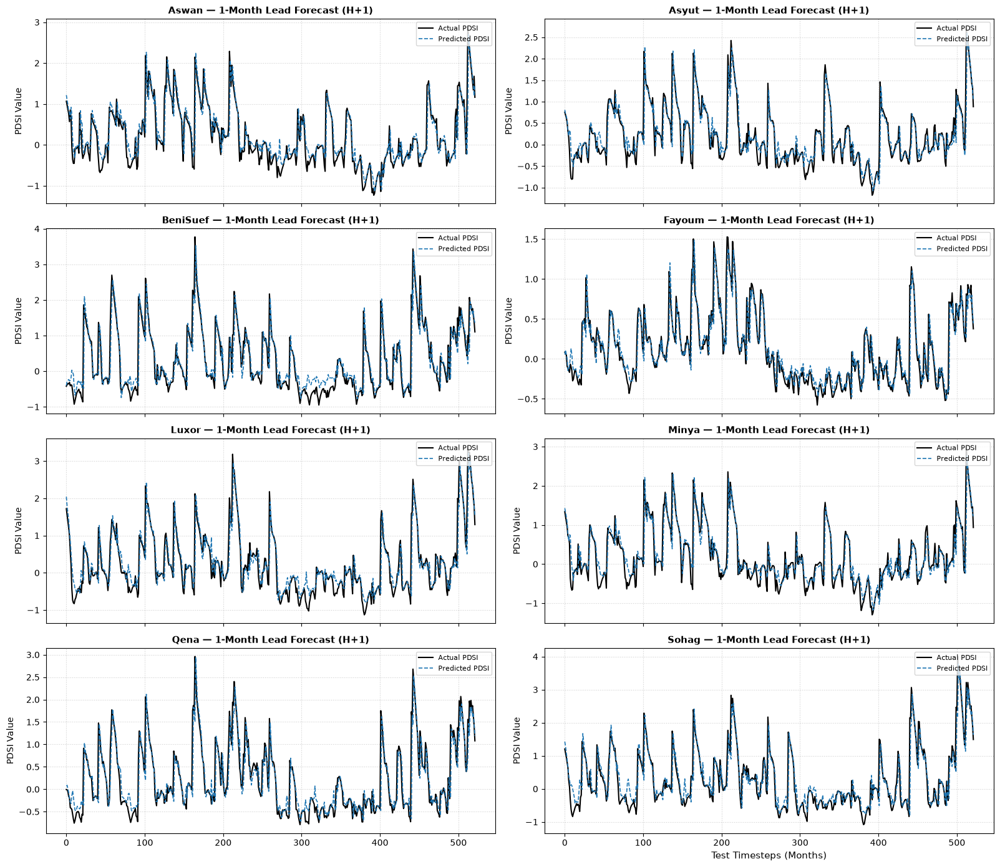

In [30]:
# =====================================================================
# CELL 15 — PERFORMANCE BENCHMARKING & MULTI-HORIZON PLOTTING (ROBUST)
# =====================================================================
import os
import joblib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

def nash_sutcliffe_efficiency(y_true, y_pred):
    """Calculates Nash-Sutcliffe Efficiency (NSE)."""
    denominator = np.sum((y_true - np.mean(y_true)) ** 2)
    if denominator == 0:
        return np.nan
    return 1.0 - (np.sum((y_true - y_pred) ** 2) / denominator)

# 1. Dynamic path resolution with fallback
base_dir = globals().get('MODELS_DIR', os.path.join(os.getcwd(), "nileguard_models"))
save_path = os.path.join(base_dir, "last_fold_predictions.joblib")

# Check if predictions exist in memory or load from disk
predictions_dict = (
    globals().get("last_fold_predictions") or
    globals().get("best_results_data") or
    globals().get("governorate_predictions")
)

if predictions_dict is None:
    if not os.path.exists(save_path):
        raise FileNotFoundError(
            f"Predictions file not found at {save_path}. "
            "Please execute the save predictions cell first."
        )
    predictions_dict = joblib.load(save_path)

print(f" Loaded predictions for {len(predictions_dict)} governorates: {list(predictions_dict.keys())}")

# 2. Compute Benchmark Metrics (NSE, RMSE, MAE, R2)
metrics_list = []
for gov_name, data in predictions_dict.items():
    # Safe retrieval supporting all key aliases
    yt_raw = data.get("y_true", data.get("Actual", data.get("Y_test")))
    yp_raw = data.get("y_pred", data.get("Predicted", data.get("Y_pred")))

    if yt_raw is None or yp_raw is None:
        print(f" Skipping {gov_name}: Missing prediction arrays.")
        continue

    y_true = np.atleast_2d(np.asarray(yt_raw))
    y_pred = np.atleast_2d(np.asarray(yp_raw))
    horizons = data.get("horizons", globals().get("HORIZONS_MULTI", [1, 3, 6, 9, 12]))

    for idx, h in enumerate(horizons[:y_pred.shape[1]]):
        yt = y_true[:, idx]
        yp = y_pred[:, idx]
        valid_mask = ~(np.isnan(yt) | np.isnan(yp))
        if not np.any(valid_mask):
            continue

        yt_v, yp_v = yt[valid_mask], yp[valid_mask]
        nse = nash_sutcliffe_efficiency(yt_v, yp_v)
        rmse = np.sqrt(mean_squared_error(yt_v, yp_v))
        mae = mean_absolute_error(yt_v, yp_v)
        r2 = r2_score(yt_v, yp_v)

        metrics_list.append({
            "Governorate": gov_name,
            "Horizon": h,
            "Horizon_Label": f"H+{h}",
            "NSE": nse,
            "RMSE": rmse,
            "MAE": mae,
            "R2": r2
        })

df_metrics = pd.DataFrame(metrics_list)

# Sort metrics by Horizon numeric order (1, 3, 6, 9, 12)
df_summary = (
    df_metrics.groupby(["Horizon", "Horizon_Label"])[["NSE", "RMSE", "MAE", "R2"]]
    .mean()
    .reset_index()
    .sort_values("Horizon")
    .drop(columns=["Horizon"])
    .set_index("Horizon_Label")
)

print("\n" + "=" * 60)
print("REGIONAL AVERAGE METRICS PER HORIZON (SORTED):")
print("=" * 60)
print(df_summary.round(4))

# Export benchmark table to CSV
csv_save_path = os.path.join(base_dir, "governorate_benchmark_metrics.csv")
df_metrics.to_csv(csv_save_path, index=False)
print(f"\n Exported detailed metrics to: {csv_save_path}")

# 3. Multi-Governorate Forecast Visualization (8 Governorates, Horizon 1)
fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(16, 14), sharex=True)
axes = axes.flatten()

for i, (gov_name, data) in enumerate(predictions_dict.items()):
    if i >= len(axes):
        break

    yt_raw = data.get("y_true", data.get("Actual", data.get("Y_test")))
    yp_raw = data.get("y_pred", data.get("Predicted", data.get("Y_pred")))

    if yt_raw is None or yp_raw is None:
        continue

    y_true = np.atleast_2d(np.asarray(yt_raw))[:, 0]
    y_pred = np.atleast_2d(np.asarray(yp_raw))[:, 0]

    ax = axes[i]
    ax.plot(y_true, label="Actual PDSI", color="black", linewidth=1.5)
    ax.plot(y_pred, label="Predicted PDSI", color="#1f77b4", linestyle="--", linewidth=1.2)
    ax.set_title(f"{gov_name} — 1-Month Lead Forecast (H+1)", fontsize=11, fontweight="bold")
    ax.set_ylabel("PDSI Value")
    ax.grid(True, linestyle=":", alpha=0.6)
    ax.legend(loc="upper right", fontsize=8)

# Hide any unused subplots if total governorates < 8
for j in range(len(predictions_dict), len(axes)):
    fig.delaxes(axes[j])

plt.xlabel("Test Timesteps (Months)", fontsize=11)
plt.tight_layout()
plt.show()

## CELL 14c — ACTUAL vs PREDICTED TIMELINE (H=1,3,6) + DROUGHT REFERENCE LINE (PDSI = -2.0)

 Found predictions for 8 governorate(s)


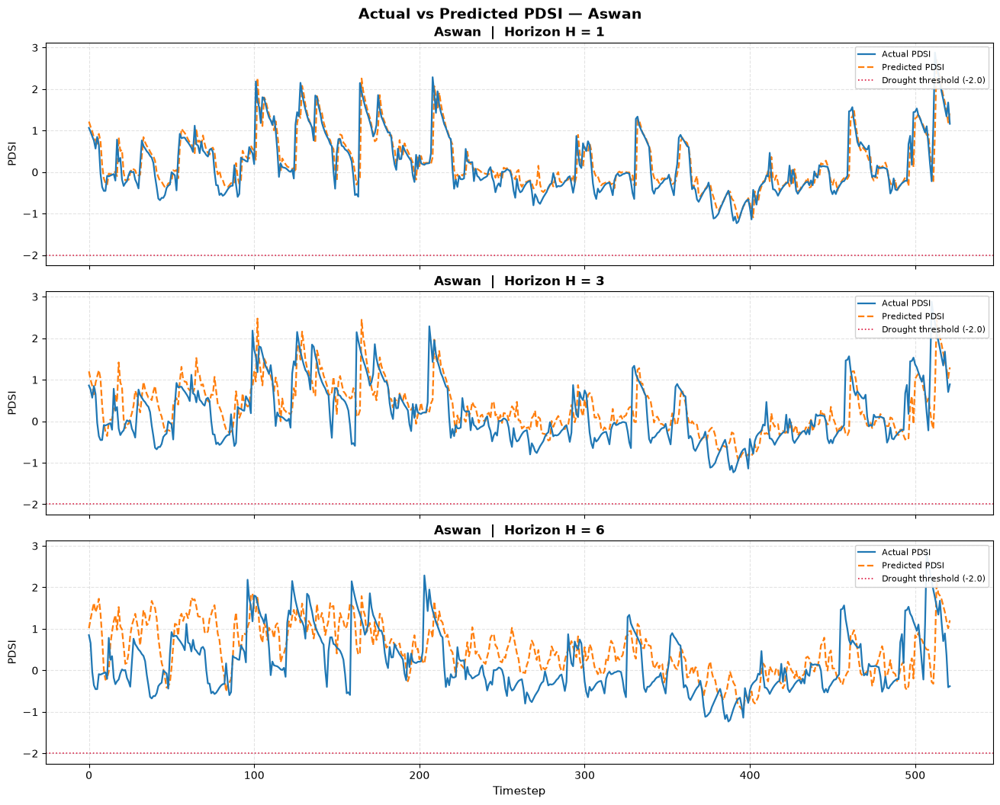

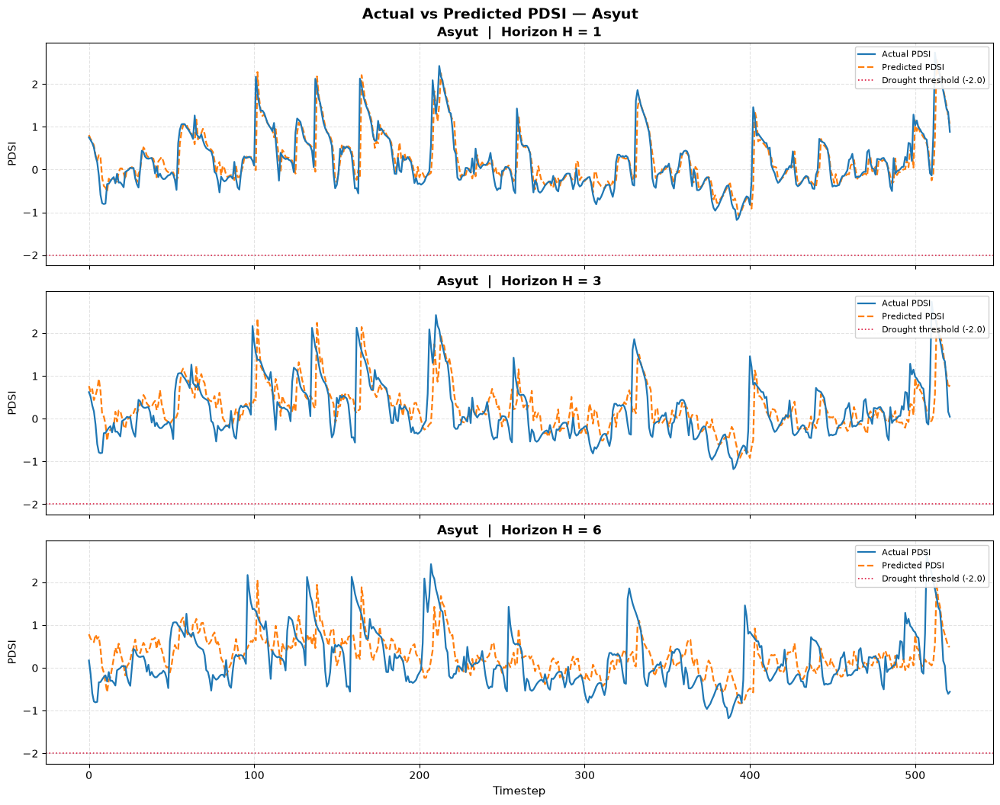

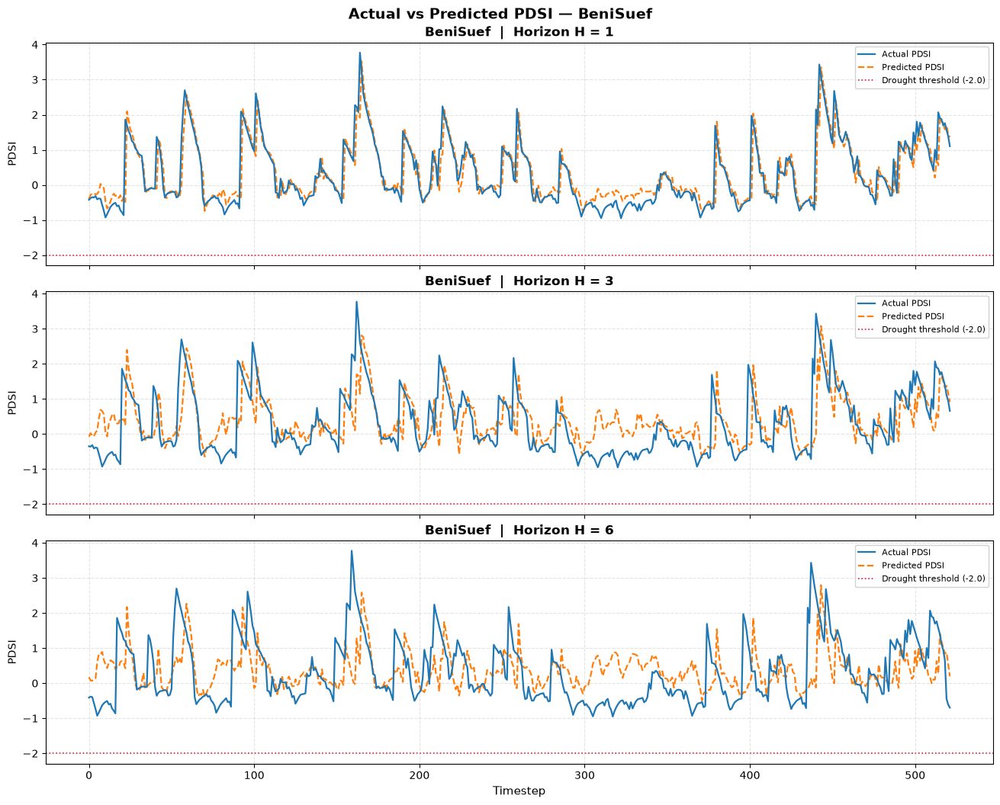

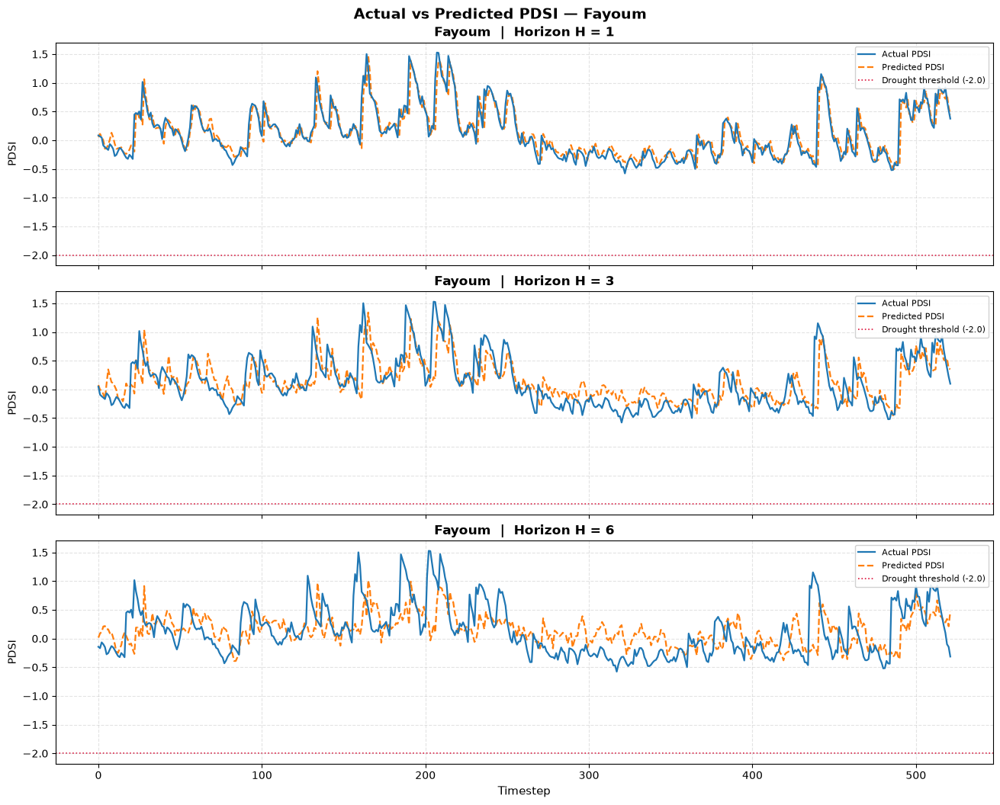

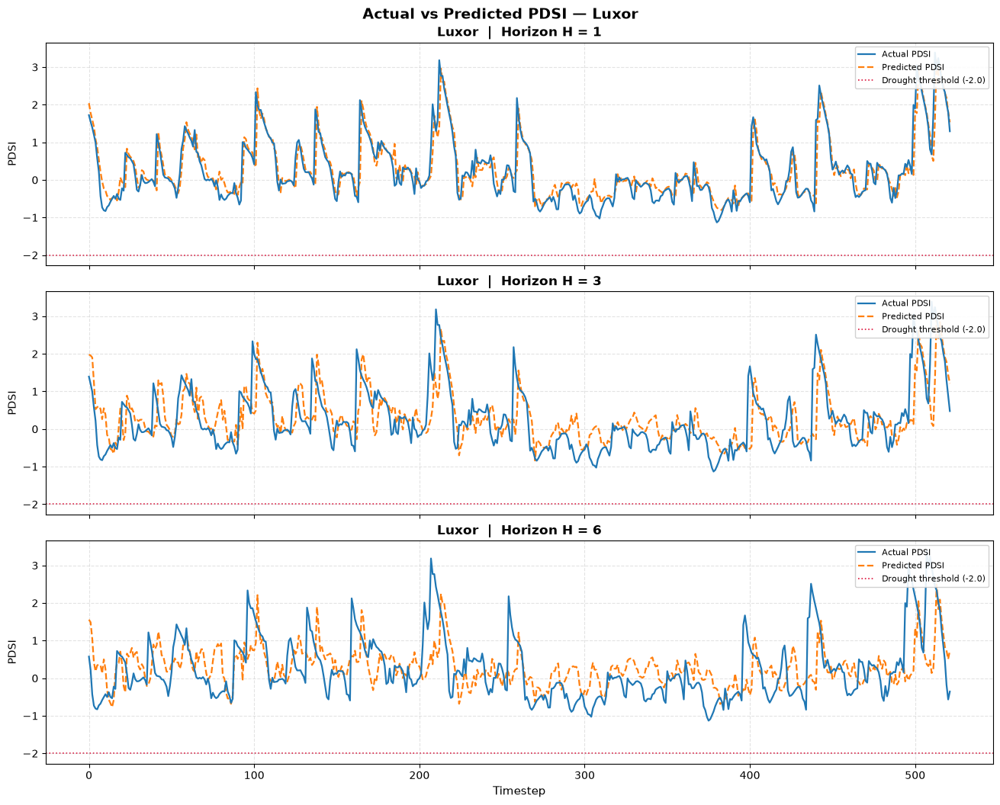

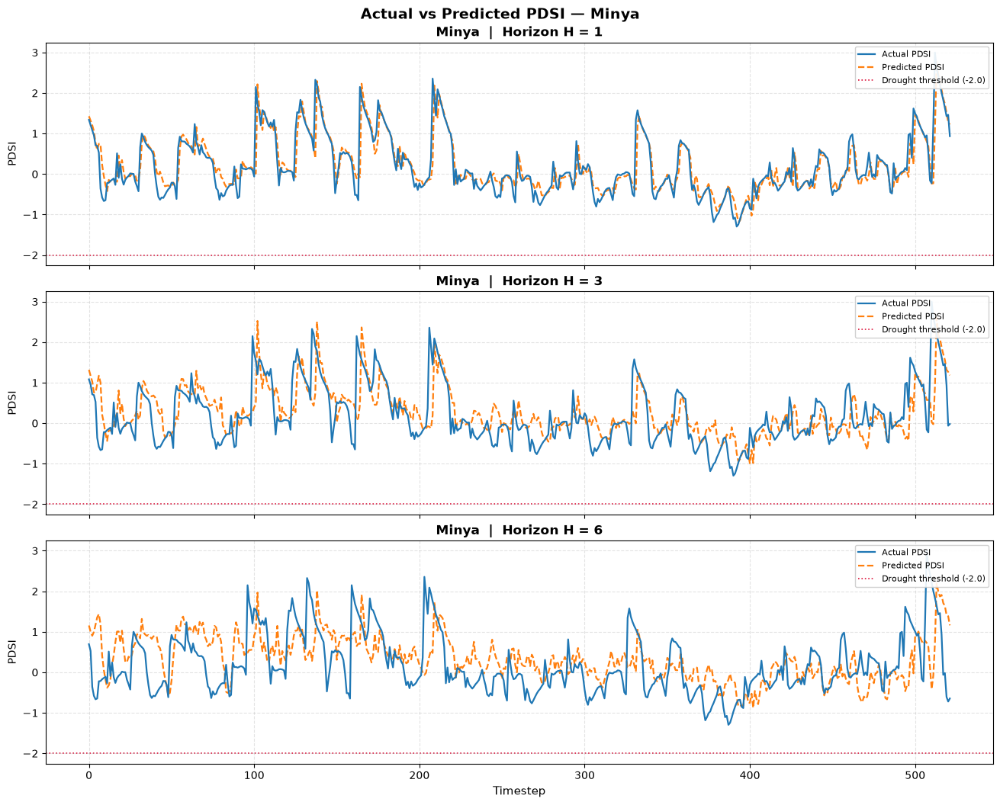

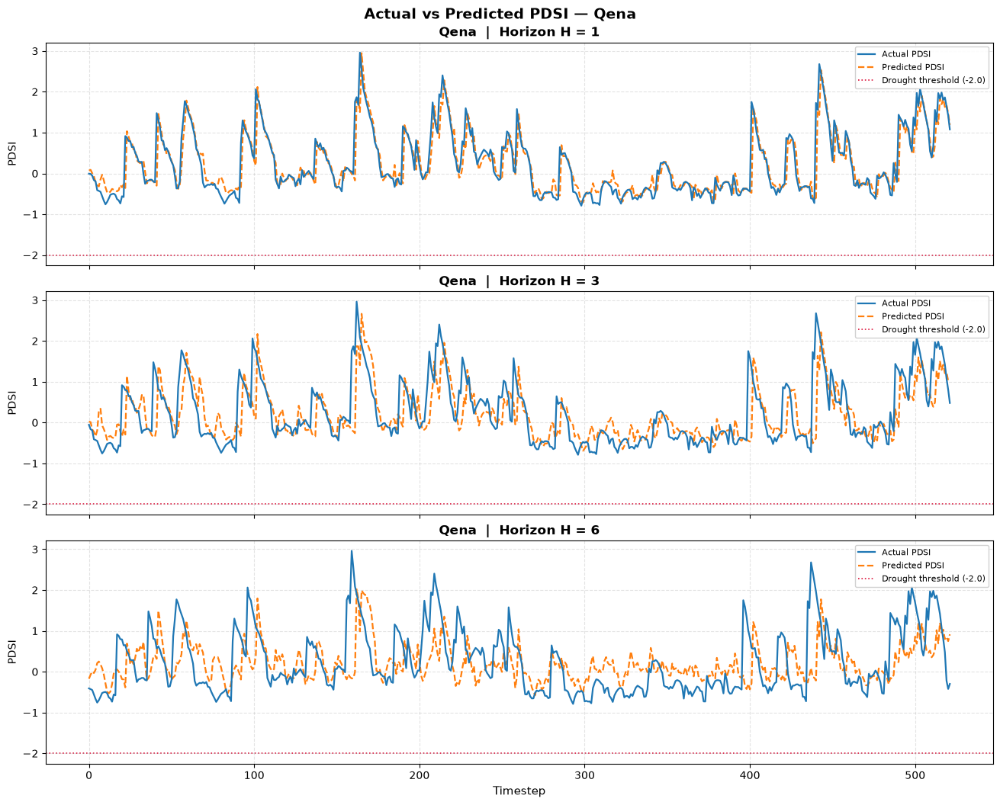

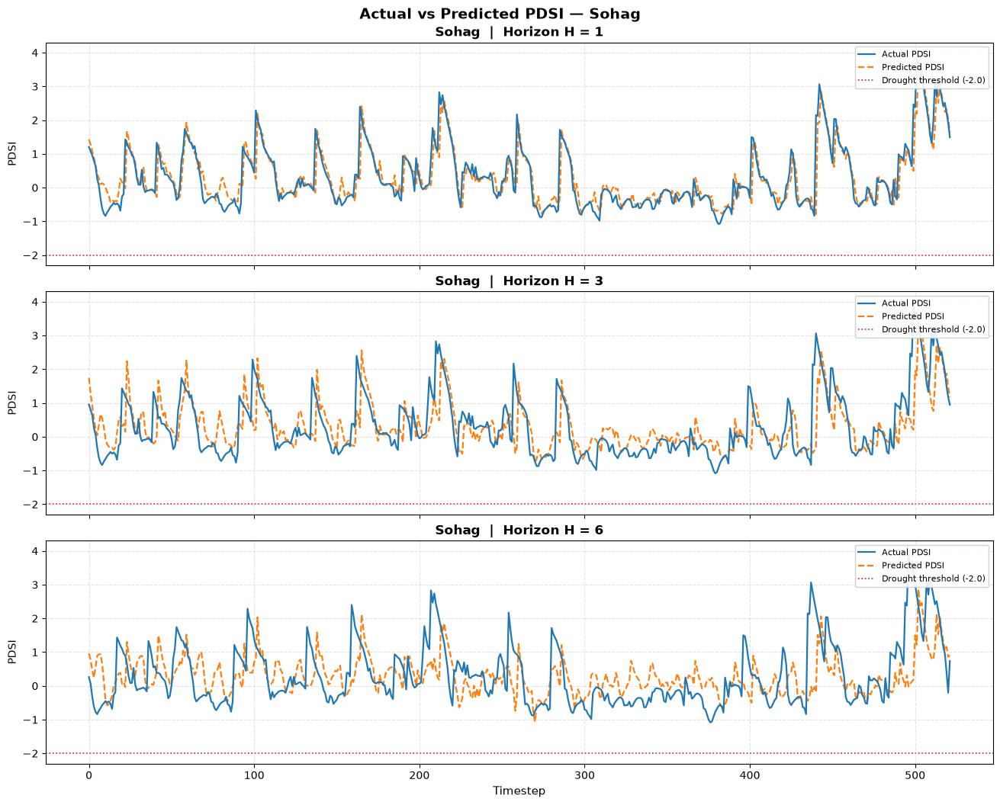

In [31]:
# =====================================================================
# CELL 14c — ACTUAL vs PREDICTED TIMELINE (H=1, 3, 6) + DROUGHT LINE (ROBUST)
# =====================================================================
# ---------------- Configuration ----------------
DATA_START_YEAR = 1958          # TerraClimate series start
DATA_START_MONTH = 1
DROUGHT_THRESHOLD = globals().get("DROUGHT_THRESHOLD", -2.0)

# Unified models directory
base_dir = globals().get(
    "MODELS_DIR",
    os.path.join(os.getcwd(), "nileguard_models")
)

# ---------------- Helpers ----------------
def origin_time_to_date(t):
    """Convert absolute month index → calendar date."""
    return pd.Timestamp(
        year=DATA_START_YEAR,
        month=DATA_START_MONTH,
        day=1
    ) + pd.DateOffset(months=int(t))

def plot_actual_vs_predicted(
    gov_name,
    predictions_dict,
    target_horizons=None,
    drought_threshold=DROUGHT_THRESHOLD,
):
    """
    Plot Actual vs Predicted PDSI over time for one governorate.
    Supports multiple naming conventions for keys.
    """
    if target_horizons is None:
        target_horizons = [1, 3, 6,9,12]

    if gov_name not in predictions_dict:
        print(f" [plot_actual_vs_predicted] No stored predictions for '{gov_name}'.")
        return

    data = predictions_dict[gov_name]

    # ---- 1. Safe extraction of arrays (support many key names) ----
    def _first_present(d, keys):
        """Return the value for the first key present in d whose value is not None,
        without relying on truthiness (avoids ambiguous-array errors)."""
        for k in keys:
            if k in d and d[k] is not None:
                return d[k]
        return None

    yt_raw = _first_present(data, ["Y_test", "y_true", "Actual", "y_test"])
    yp_raw = _first_present(data, ["Y_pred", "y_pred", "Predicted", "y_hat"])

    if yt_raw is None or yp_raw is None:
        print(f" Missing actual or predicted data for {gov_name}")
        return

    y_true = np.atleast_2d(np.asarray(yt_raw, dtype=float))
    y_pred = np.atleast_2d(np.asarray(yp_raw, dtype=float))

    # Ensure 2-D shape: (n_samples, n_horizons)
    if y_true.ndim == 1:
        y_true = y_true.reshape(-1, 1)
    if y_pred.ndim == 1:
        y_pred = y_pred.reshape(-1, 1)

    n_samples = min(y_true.shape[0], y_pred.shape[0])
    y_true = y_true[:n_samples]
    y_pred = y_pred[:n_samples]

    # ---- 2. Dates / origin times ----
    if "origin_times" in data and len(data["origin_times"]) >= n_samples:
        dates = [origin_time_to_date(t) for t in data["origin_times"][:n_samples]]
        x_label = "Date"
    else:
        dates = list(range(n_samples))
        x_label = "Timestep"

    # ---- 3. Horizons ----
    all_horizons = list(
        data.get("horizons")
        or data.get("target_horizons")
        or globals().get("HORIZONS_MULTI", [1, 3, 6, 9, 12])
    )

    # Keep only requested horizons that exist
    valid_indices = [
        idx
        for idx, h in enumerate(all_horizons)
        if h in target_horizons and idx < y_pred.shape[1]
    ]

    if not valid_indices:
        # Fallback: use the first available horizons
        valid_indices = list(range(min(len(all_horizons), y_pred.shape[1], len(target_horizons))))
        plot_horizons = [all_horizons[i] for i in valid_indices]
        print(f" Requested horizons {target_horizons} not found → using {plot_horizons}")
    else:
        plot_horizons = [all_horizons[idx] for idx in valid_indices]

    # ---- 4. Plotting ----
    n_plots = len(plot_horizons)
    fig, axes = plt.subplots(
        n_plots, 1,
        figsize=(13, 3.4 * n_plots),
        sharex=True,
        constrained_layout=True,
    )
    if n_plots == 1:
        axes = [axes]

    for j, idx in enumerate(valid_indices):
        h = all_horizons[idx]
        ax = axes[j]

        ax.plot(
            dates,
            y_true[:, idx],
            label="Actual PDSI",
            color="tab:blue",
            linewidth=1.6,
            zorder=3,
        )
        ax.plot(
            dates,
            y_pred[:, idx],
            label="Predicted PDSI",
            color="tab:orange",
            linewidth=1.6,
            linestyle="--",
            zorder=2,
        )
        ax.axhline(
            drought_threshold,
            color="crimson",
            linewidth=1.2,
            linestyle=":",
            label=f"Drought threshold ({drought_threshold})",
            zorder=1,
        )

        ax.set_title(f"{gov_name}  |  Horizon H = {h}", fontsize=12, fontweight="bold")
        ax.set_ylabel("PDSI", fontsize=10)
        ax.grid(True, linestyle="--", alpha=0.35)
        ax.legend(loc="upper right", fontsize=8, framealpha=0.9)

        # Optional: mark drought periods lightly
        ax.fill_between(
            dates,
            y_true[:, idx],
            drought_threshold,
            where=(y_true[:, idx] < drought_threshold),
            color="red",
            alpha=0.08,
            interpolate=True,
        )

    axes[-1].set_xlabel(x_label, fontsize=11)
    fig.suptitle(
        f"Actual vs Predicted PDSI — {gov_name}",
        fontsize=14,
        fontweight="bold",
        y=1.02,
    )
    plt.show()

# =====================================================================
# 3. Load predictions (memory first → disk fallback)
# =====================================================================
predictions_source = (
    globals().get("beltagy_last_fold_predictions")
    or globals().get("best_results_data")
    or globals().get("governorate_predictions")
    or globals().get("last_fold_predictions")
    or globals().get("predictions")
)

if not predictions_source:
    # Try common joblib files
    candidate_paths = [
        os.path.join(base_dir, "beltagy_last_fold_predictions.joblib"),
        os.path.join(base_dir, "last_fold_predictions.joblib"),
        os.path.join(base_dir, "governorate_predictions.joblib"),
        os.path.join(os.getcwd(), "beltagy_last_fold_predictions.joblib"),
    ]
    for path in candidate_paths:
        if os.path.exists(path):
            try:
                predictions_source = joblib.load(path)
                print(f" Loaded predictions from disk: {path}")
                break
            except Exception as e:
                print(f" Failed to load {path}: {e}")

if predictions_source and len(predictions_source) > 0:
    print(f" Found predictions for {len(predictions_source)} governorate(s)")
    for gov in predictions_source:
        plot_actual_vs_predicted(
            gov_name=gov,
            predictions_dict=predictions_source,
            target_horizons=[1, 3, 6],
            drought_threshold=DROUGHT_THRESHOLD,
        )
else:
    print(
        " [WARNING] No predictions dictionary found in memory or on disk!\n"
        "Please run CELL 14 (or the training / evaluation cell) first "
        "to populate the predictions."
    )

## CELL 15 — TEST EVALUATION - FINAL (reload saved best models, evaluate on the untouched test set)


In [25]:
# =====================================================================
# SUMMARY METRICS FROM LAST FOLD PREDICTIONS (ROBUST & AUTO-LOAD)
# =====================================================================

import os
import joblib
import numpy as np
import pandas as pd
from sklearn.metrics import mean_squared_error, r2_score

base_dir = globals().get('MODELS_DIR', os.path.join(os.getcwd(), "nileguard_models"))
save_path = os.path.join(base_dir, "last_fold_predictions.joblib")

preds_dict = (
    globals().get("last_fold_predictions") or
    globals().get("governorate_predictions") or
    globals().get("best_results_data") or
    globals().get("beltagy_last_fold_predictions")
)

if not preds_dict:
    if os.path.exists(save_path):
        preds_dict = joblib.load(save_path)
        print(f" Loaded predictions directly from disk: {save_path}")
    else:
        alt_paths = [
            os.path.join(base_dir, "governorate_predictions.joblib"),
            os.path.join(base_dir, "beltagy_last_fold_predictions.joblib"),
            os.path.join(base_dir, "all_governorate_results.joblib")
        ]
        for alt_path in alt_paths:
            if os.path.exists(alt_path):
                loaded = joblib.load(alt_path)
                preds_dict = loaded.get("best_results_data", loaded)
                print(f" Loaded evaluation results from disk: {alt_path}")
                break

summary_rows = []

if preds_dict and len(preds_dict) > 0:
    for gov_name, preds_data in preds_dict.items():
        y_test = preds_data.get("Y_test", preds_data.get("y_true", preds_data.get("Actual")))
        y_pred = preds_data.get("Y_pred", preds_data.get("y_pred", preds_data.get("Predicted")))

        if y_test is None or y_pred is None:
            continue

        y_test = np.atleast_2d(np.asarray(y_test))
        y_pred = np.atleast_2d(np.asarray(y_pred))

        horizons = preds_data.get("horizons", globals().get("HORIZONS_MULTI", [1, 3, 6, 9, 12]))
        num_horizons = min(y_test.shape[1], len(horizons))

        for h_idx in range(num_horizons):
            yt = y_test[:, h_idx]
            yp = y_pred[:, h_idx]

            valid_mask = ~(np.isnan(yt) | np.isnan(yp))
            if not np.any(valid_mask):
                continue

            yt_v, yp_v = yt[valid_mask], yp[valid_mask]

            mse = mean_squared_error(yt_v, yp_v)
            rmse = np.sqrt(mse)
            r2 = r2_score(yt_v, yp_v)

            h_label = f"H+{horizons[h_idx]}" if h_idx < len(horizons) else f"H={h_idx+1}"

            summary_rows.append({
                "Governorate": gov_name,
                "Horizon (H)": h_label,
                "RMSE": rmse,
                "R²": r2
            })

    df_predictions_summary = pd.DataFrame(summary_rows)

    print("=" * 80)
    print("LAST FOLD PREDICTIONS - SUMMARY METRICS")
    print("=" * 80)

    display_format = {
        "RMSE": "{:.4f}",
        "R²": "{:.4f}"
    }

    try:
        display(df_predictions_summary.style.hide(axis="index").format(display_format))
    except Exception:
        print(df_predictions_summary.to_string(index=False))

    os.makedirs(base_dir, exist_ok=True)
    csv_out = os.path.join(base_dir, "governorate_predictions_summary.csv")
    df_predictions_summary.to_csv(csv_out, index=False)
    print(f"\n Summary saved to: {csv_out}")

else:
    print(" Predictions file not found on disk or memory!")
    print(f"   Expected path: {save_path}")

LAST FOLD PREDICTIONS - SUMMARY METRICS


Governorate,Horizon (H),RMSE,R²
Aswan,H+1,0.3390,0.7846
Aswan,H+3,0.5696,0.3906
Aswan,H+6,0.7824,-0.1506
Aswan,H+9,0.8453,-0.3425
Aswan,H+12,0.8221,-0.2724
Asyut,H+1,0.3315,0.7597
Asyut,H+3,0.5499,0.3374
Asyut,H+6,0.6541,0.0686
Asyut,H+9,0.7273,-0.1499
Asyut,H+12,0.7228,-0.1457



 Summary saved to: C:\Users\S-GF-L1-D10\Desktop\NileGuard\nileguard_models\governorate_predictions_summary.csv


## CELL 18 — EVALUATION METRICS SUITE (NSE, MAE, MARE, IA, R², RMSE)

In [32]:
# =====================================================================
# CELL 18 — MODEL vs PERSISTENCE BASELINE EVALUATION (WITH DELTA RECONSTRUCTION)
# =====================================================================

save_path = os.path.join(globals().get("MODELS_DIR", os.path.join(os.getcwd(), "nileguard_models")), "beltagy_last_fold_predictions.joblib")

USE_DELTA_TARGET = globals().get("USE_DELTA_TARGET", True)

if not os.path.exists(save_path):
    print(f" Predictions file not found at: {save_path}")
else:
    beltagy_last_fold_predictions = joblib.load(save_path)
    print(f" Loaded pre-computed predictions for {len(beltagy_last_fold_predictions)} governorates.\n")

    rows = []

    for gov, data in beltagy_last_fold_predictions.items():
        if "Y_test" not in data or "Y_pred" not in data:
            continue

        Y_test = data["Y_test"]
        Y_pred = data["Y_pred"]
        horizons = data.get("horizons", [1, 3, 6])
        origin_times = data.get("origin_times", None)

        mask = GOV_MASKS[gov]
        pdsi_series = build_governorate_pdsi_series(PDSI_DATA, mask)

        if origin_times is not None:
            rows_idx = np.asarray(origin_times, dtype=int)
            base_pdsi = pdsi_series[rows_idx - 1]
        else:
            n_samples = len(Y_test)
            base_pdsi = pdsi_series[-n_samples - 1 : -1]

        for j, h in enumerate(horizons):
            if j >= Y_test.shape[1]:
                break

            y_true_raw = Y_test[:, j]
            y_pred_raw = Y_pred[:, j]

            # ---- 2. RECONSTRUCTION LOGIC FOR ABSOLUTE PDSI ----
            if USE_DELTA_TARGET:
                y_true_abs = base_pdsi + y_true_raw
                y_pred_abs = base_pdsi + y_pred_raw
                y_persist_abs = base_pdsi
            else:
                y_true_abs = y_true_raw
                y_pred_abs = y_pred_raw
                n_samples = len(y_true_abs)
                y_persist_abs = pdsi_series[-n_samples - h : -h]

            min_len = min(len(y_true_abs), len(y_persist_abs))
            y_true_eval = y_true_abs[:min_len]
            y_pred_eval = y_pred_abs[:min_len]
            y_persist_eval = y_persist_abs[:min_len]

            # ---- 3. CALCULATE METRICS ON ABSOLUTE SCALE ----
            model_r2 = r2_score(y_true_eval, y_pred_eval)
            model_mae = mean_absolute_error(y_true_eval, y_pred_eval)
            p_r2 = r2_score(y_true_eval, y_persist_eval)
            p_mae = mean_absolute_error(y_true_eval, y_persist_eval)

            # Murphy Skill Score (Model R2 - Persistence R2)
            skill = model_r2 - p_r2

            rows.append(
                {
                    "Governorate": gov,
                    "Horizon": f"H={h}m",
                    "Model_R2": round(model_r2, 4),
                    "Persistence_R2": round(p_r2, 4),
                    "Skill": round(skill, 4),
                    "Model_MAE": round(model_mae, 4),
                    "Persistence_MAE": round(p_mae, 4),
                }
            )

    skill_df = (
        pd.DataFrame(rows)
        .sort_values(["Horizon", "Skill"], ascending=[True, False])
        .reset_index(drop=True)
    )

    print("=" * 90)
    print("EVALUATION: MODEL vs PERSISTENCE BASELINE (RECONSTRUCTED ABSOLUTE SCALE)")
    print("=" * 90)
    print(skill_df.to_string(index=False))

    wins = (skill_df["Skill"] > 0).sum()
    total = len(skill_df)
    win_pct = (wins / total * 100) if total > 0 else 0.0
    print(
        f"\nNumber of cases where Model outperformed Persistence: {wins}/{total} ({win_pct:.1f}%)"
    )

 Predictions file not found at: C:\Users\S-GF-L1-D10\Desktop\NileGuard\nileguard_models\beltagy_last_fold_predictions.joblib


## CELL 19 — PERSISTENCE BASELINE + MURPHY SKILL SCORE

In [33]:
# =====================================================================
# CELL 18 — MODEL vs PERSISTENCE BASELINE EVALUATION (WITH DELTA RECONSTRUCTION)
# =====================================================================

# 1. Dynamic path resolution and settings
base_dir = globals().get('MODELS_DIR', os.path.join(os.getcwd(), "nileguard_models"))
save_path = os.path.join(base_dir, "last_fold_predictions.joblib")

USE_DELTA_TARGET = globals().get("USE_DELTA_TARGET", True)

# 2. Retrieve predictions dictionary from memory or disk with fallbacks
preds_dict = (
    globals().get("last_fold_predictions") or
    globals().get("governorate_predictions") or
    globals().get("best_results_data") or
    globals().get("beltagy_last_fold_predictions")
)

if not preds_dict:
    if os.path.exists(save_path):
        preds_dict = joblib.load(save_path)
        print(f" Loaded predictions directly from disk: {save_path}\n")
    else:
        for alt_file in ["beltagy_last_fold_predictions.joblib", "governorate_predictions.joblib", "all_governorate_results.joblib"]:
            alt_path = os.path.join(base_dir, alt_file)
            if os.path.exists(alt_path):
                loaded = joblib.load(alt_path)
                preds_dict = loaded.get("best_results_data", loaded)
                print(f"Loaded predictions from fallback file: {alt_path}\n")
                break

if not preds_dict:
    print(" Predictions dictionary not found in memory or on disk.")
else:
    rows = []

    # Safe retrieval of global PDSI dependencies
    gov_masks_dict = globals().get("GOV_MASKS", {})
    pdsi_data_obj = globals().get("PDSI_DATA", None)
    pdsi_builder_func = globals().get("build_governorate_pdsi_series", None)

    for gov, data in preds_dict.items():
        # Support key aliases for prediction arrays
        yt_raw = data.get("Y_test", data.get("y_true", data.get("Actual")))
        yp_raw = data.get("Y_pred", data.get("y_pred", data.get("Predicted")))

        if yt_raw is None or yp_raw is None:
            continue

        Y_test = np.atleast_2d(np.asarray(yt_raw))
        Y_pred = np.atleast_2d(np.asarray(yp_raw))
        horizons = data.get("horizons", globals().get("HORIZONS_MULTI", [1, 3, 6]))
        origin_times = data.get("origin_times", None)

        # Build or retrieve historical PDSI series safely if helpers are available
        pdsi_series = None
        if pdsi_builder_func is not None and gov in gov_masks_dict and pdsi_data_obj is not None:
            try:
                pdsi_series = pdsi_builder_func(pdsi_data_obj, gov_masks_dict[gov])
            except Exception:
                pdsi_series = None

        # Prepare base reference PDSI (t-1)
        if pdsi_series is not None:
            if origin_times is not None:
                rows_idx = np.asarray(origin_times, dtype=int)
                base_pdsi = pdsi_series[rows_idx - 1]
            else:
                n_samples = len(Y_test)
                base_pdsi = pdsi_series[-n_samples - 1 : -1]
        else:
            base_pdsi = np.zeros(len(Y_test))

        for j, h in enumerate(horizons):
            if j >= Y_test.shape[1]:
                break

            y_true_raw = Y_test[:, j]
            y_pred_raw = Y_pred[:, j]

            # ---- 3. RECONSTRUCTION LOGIC FOR ABSOLUTE PDSI ----
            if USE_DELTA_TARGET and pdsi_series is not None:
                y_true_abs = base_pdsi + y_true_raw
                y_pred_abs = base_pdsi + y_pred_raw
                y_persist_abs = base_pdsi
            else:
                y_true_abs = y_true_raw
                y_pred_abs = y_pred_raw
                n_samples = len(y_true_abs)
                if pdsi_series is not None and len(pdsi_series) >= n_samples + h:
                    y_persist_abs = pdsi_series[-n_samples - h : -h]
                else:
                    y_persist_abs = np.roll(y_true_abs, shift=1)
                    y_persist_abs[0] = y_true_abs[0]

            min_len = min(len(y_true_abs), len(y_persist_abs), len(y_pred_abs))
            y_true_eval = y_true_abs[:min_len]
            y_pred_eval = y_pred_abs[:min_len]
            y_persist_eval = y_persist_abs[:min_len]

            # Filter missing values
            valid_mask = ~(np.isnan(y_true_eval) | np.isnan(y_pred_eval) | np.isnan(y_persist_eval))
            if not np.any(valid_mask):
                continue

            y_true_eval = y_true_eval[valid_mask]
            y_pred_eval = y_pred_eval[valid_mask]
            y_persist_eval = y_persist_eval[valid_mask]

            # ---- 4. CALCULATE METRICS ON ABSOLUTE SCALE ----
            model_r2 = r2_score(y_true_eval, y_pred_eval)
            model_mae = mean_absolute_error(y_true_eval, y_pred_eval)
            p_r2 = r2_score(y_true_eval, y_persist_eval)
            p_mae = mean_absolute_error(y_true_eval, y_persist_eval)

            skill = model_r2 - p_r2

            rows.append({
                "Governorate": gov,
                "Horizon": f"H={h}m",
                "Model_R2": round(model_r2, 4),
                "Persistence_R2": round(p_r2, 4),
                "Skill": round(skill, 4),
                "Model_MAE": round(model_mae, 4),
                "Persistence_MAE": round(p_mae, 4),
            })

    if rows:
        skill_df = (
            pd.DataFrame(rows)
            .sort_values(["Horizon", "Skill"], ascending=[True, False])
            .reset_index(drop=True)
        )

        print("=" * 90)
        print("EVALUATION: MODEL vs PERSISTENCE BASELINE (RECONSTRUCTED ABSOLUTE SCALE)")
        print("=" * 90)
        print(skill_df.to_string(index=False))

        wins = (skill_df["Skill"] > 0).sum()
        total = len(skill_df)
        win_pct = (wins / total * 100) if total > 0 else 0.0
        print(
            f"\nNumber of cases where Model outperformed Persistence: {wins}/{total} ({win_pct:.1f}%)"
        )

        # Export table to CSV
        os.makedirs(base_dir, exist_ok=True)
        csv_out = os.path.join(base_dir, "model_vs_persistence_baseline.csv")
        skill_df.to_csv(csv_out, index=False)
        print(f" Baseline evaluation summary exported to: {csv_out}")

EVALUATION: MODEL vs PERSISTENCE BASELINE (RECONSTRUCTED ABSOLUTE SCALE)
Governorate Horizon  Model_R2  Persistence_R2   Skill  Model_MAE  Persistence_MAE
      Sohag   H=12m    0.7175          0.7190 -0.0015     0.7560           0.6998
      Asyut   H=12m    0.7136          0.7255 -0.0120     0.5750           0.5141
      Luxor   H=12m    0.7144          0.7285 -0.0141     0.7045           0.6153
     Fayoum   H=12m    0.7074          0.7290 -0.0216     0.3981           0.3559
   BeniSuef   H=12m    0.6925          0.7176 -0.0251     0.8268           0.7364
      Minya   H=12m    0.6953          0.7333 -0.0380     0.6577           0.5537
      Aswan   H=12m    0.6819          0.7319 -0.0500     0.6565           0.5719
       Qena   H=12m    0.6656          0.7245 -0.0589     0.7318           0.6201
   BeniSuef    H=1m    0.8863          0.4704  0.4159     0.2496           0.7343
      Luxor    H=1m    0.9074          0.5126  0.3948     0.2208           0.6275
      Asyut    H=1m    0.

In [35]:
# ============================================================
# PDSI SCALER (works automatically on both Kaggle and local runs)
# ============================================================



# ------------------------------------------------------------
# 1. Determine search directory: 
# ------------------------------------------------------------

SEARCH_DIR = DATA_DIR if "DATA_DIR" in globals() else Path(
    os.environ.get("NILEGUARD_BASE_DIR", Path.cwd())
) / "data"

scaler_path = None

for root, dirs, files in os.walk(SEARCH_DIR):
    for file in files:
        if file.endswith(".joblib"):
            scaler_path = os.path.join(root, file)
            break
    if scaler_path is not None:
        break

# ------------------------------------------------------------
# 2. Check that the scaler was found
# ------------------------------------------------------------

if scaler_path is None:
    raise FileNotFoundError(
        f"No .joblib scaler file was found inside {SEARCH_DIR} — "
        f"make sure nileguard_scalers_objects.joblib actually exists in the data folder."
    )

print("=" * 70)
print("SCALER FOUND")
print("=" * 70)
print(scaler_path)

# ------------------------------------------------------------
# 3. Load scaler dictionary
# ------------------------------------------------------------

scalers = joblib.load(scaler_path)

print("\nScaler loaded successfully!")
print("Available scalers:")
print(scalers.keys())

# ------------------------------------------------------------
# 4. Extract PDSI scaler
# ------------------------------------------------------------

if "PDSI" not in scalers:
    raise KeyError("PDSI scaler was not found in the loaded scaler dictionary.")

pdsi_scaler = scalers["PDSI"]

print("\nPDSI scaler loaded successfully!")
print(type(pdsi_scaler))

# ============================================================
# 5. Function for inverse-transforming PDSI predictions
# ============================================================

def inverse_transform_pdsi(values, scaler=pdsi_scaler):
    """Convert scaled PDSI values back to the original PDSI scale."""
    values = np.asarray(values)
    original_shape = values.shape
    values_2d = values.reshape(-1, 1)
    values_original = scaler.inverse_transform(values_2d)
    return values_original.reshape(original_shape)

print("\n" + "=" * 70)
print("READY")
print("=" * 70)
print("Use:")
print("predictions_original = inverse_transform_pdsi(predictions_scaled)")
print("y_test_original      = inverse_transform_pdsi(y_test_scaled)")

SCALER FOUND
C:\Users\S-GF-L1-D10\Desktop\NileGuard\data\nileguard_scalers_objects.joblib

Scaler loaded successfully!
Available scalers:
dict_keys(['ppt', 'tmax', 'tmin', 'PDSI', 'vpd', 'pet', 'soil', 'srad', 'q', 'aet', 'def', 'vap', 'ws'])

PDSI scaler loaded successfully!
<class 'sklearn.preprocessing._data.RobustScaler'>

READY
Use:
predictions_original = inverse_transform_pdsi(predictions_scaled)
y_test_original      = inverse_transform_pdsi(y_test_scaled)


CELL 20: ACTUAL VS PREDICTED PDSI
 Plot output directory:
   C:\Users\S-GF-L1-D10\Desktop\NileGuard\nileguard_models\plots

Predictions found in memory: last_fold_predictions

LOADING PDSI SCALER
 Scaler file loaded successfully
Available scalers: dict_keys(['ppt', 'tmax', 'tmin', 'PDSI', 'vpd', 'pet', 'soil', 'srad', 'q', 'aet', 'def', 'vap', 'ws'])
PDSI scaler loaded successfully
   Type: <class 'sklearn.preprocessing._data.RobustScaler'>

 Forecast horizons: [1, 3, 6, 9, 12]

GENERATING PDSI PLOTS

----------------------------------------------------------------------
Governorate: Aswan
Original Y_test shape : (522, 5)
Original Y_pred shape : (522, 5)
Real Y_test shape     : (522, 5)
Real Y_pred shape     : (522, 5)
 Saved plot:
   C:\Users\S-GF-L1-D10\Desktop\NileGuard\nileguard_models\plots\PDSI_Actual_vs_Predicted_Aswan.png


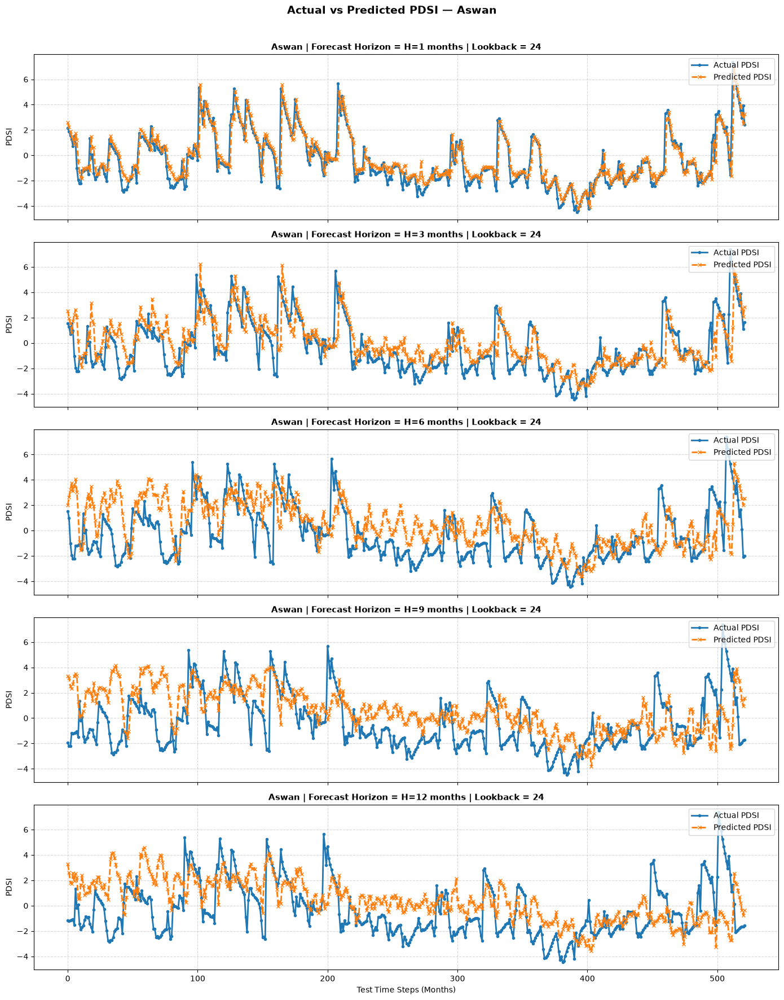


----------------------------------------------------------------------
Governorate: Asyut
Original Y_test shape : (522, 5)
Original Y_pred shape : (522, 5)
Real Y_test shape     : (522, 5)
Real Y_pred shape     : (522, 5)
 Saved plot:
   C:\Users\S-GF-L1-D10\Desktop\NileGuard\nileguard_models\plots\PDSI_Actual_vs_Predicted_Asyut.png


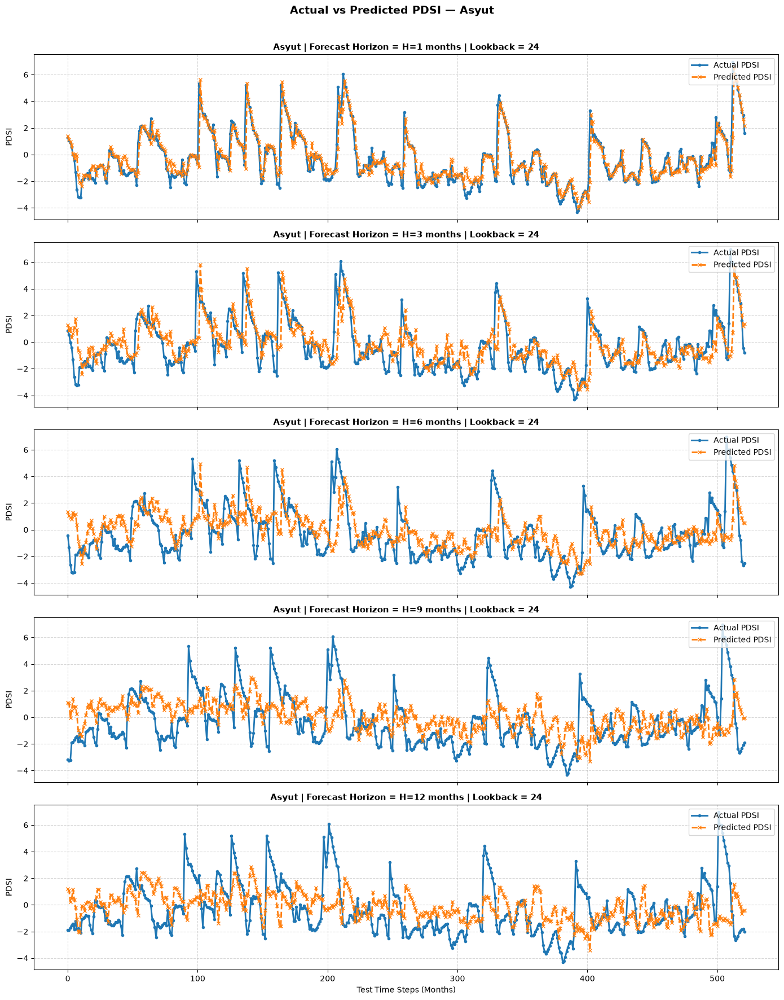


----------------------------------------------------------------------
Governorate: BeniSuef
Original Y_test shape : (522, 5)
Original Y_pred shape : (522, 5)
Real Y_test shape     : (522, 5)
Real Y_pred shape     : (522, 5)
 Saved plot:
   C:\Users\S-GF-L1-D10\Desktop\NileGuard\nileguard_models\plots\PDSI_Actual_vs_Predicted_BeniSuef.png


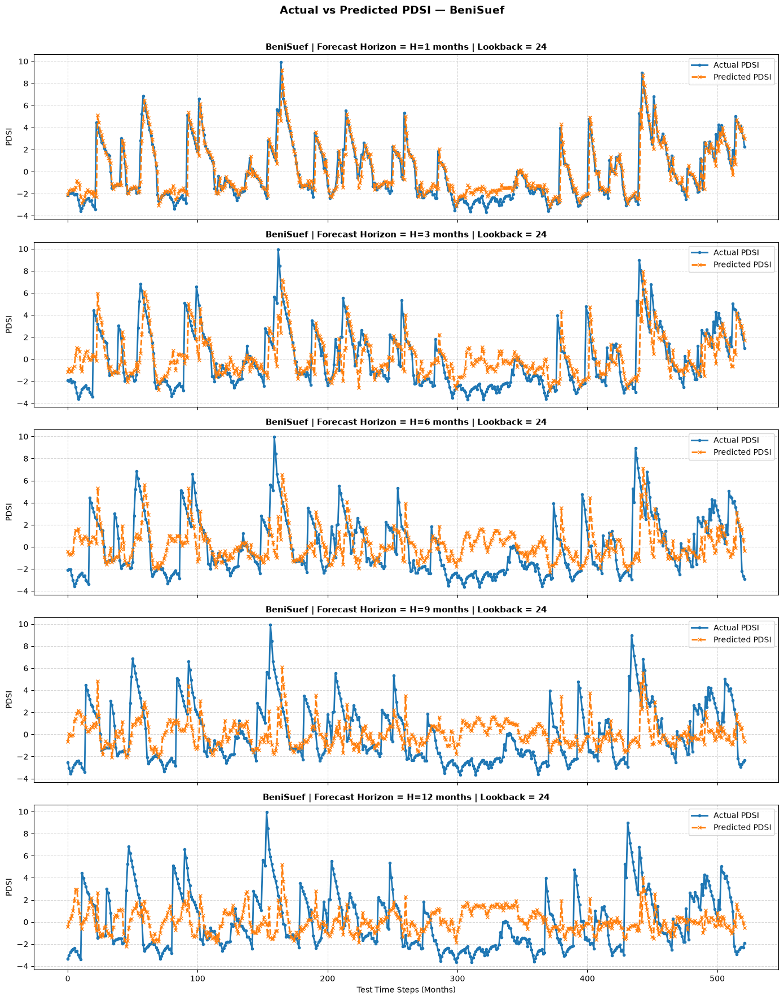


----------------------------------------------------------------------
Governorate: Fayoum
Original Y_test shape : (522, 5)
Original Y_pred shape : (522, 5)
Real Y_test shape     : (522, 5)
Real Y_pred shape     : (522, 5)
 Saved plot:
   C:\Users\S-GF-L1-D10\Desktop\NileGuard\nileguard_models\plots\PDSI_Actual_vs_Predicted_Fayoum.png


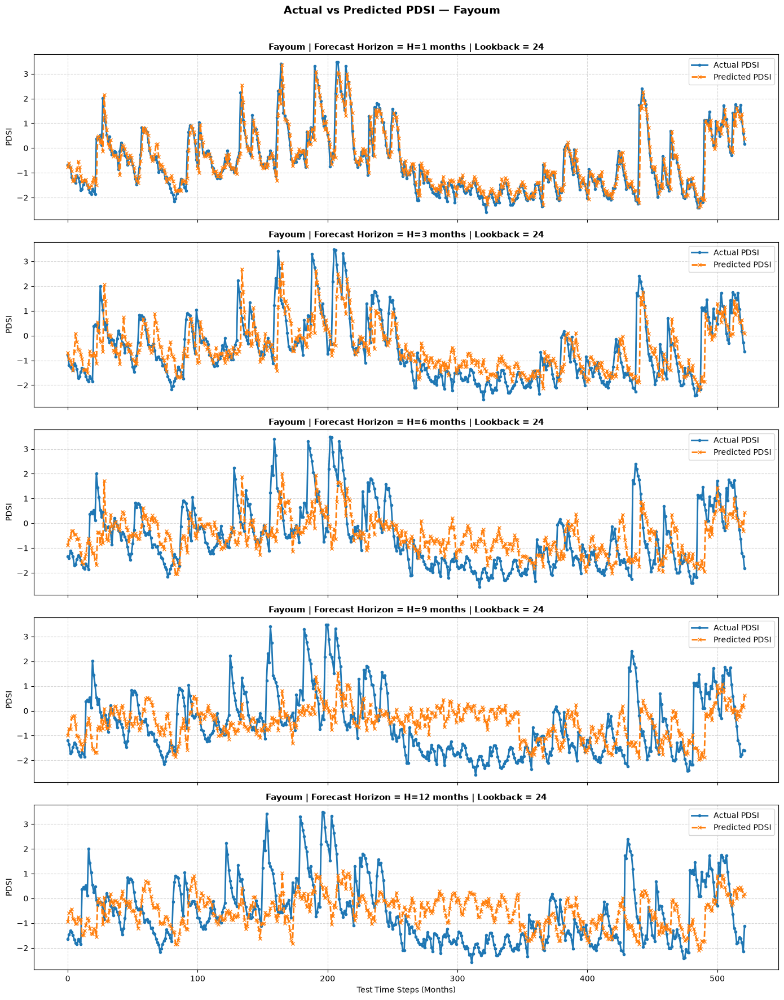


----------------------------------------------------------------------
Governorate: Luxor
Original Y_test shape : (522, 5)
Original Y_pred shape : (522, 5)
Real Y_test shape     : (522, 5)
Real Y_pred shape     : (522, 5)
 Saved plot:
   C:\Users\S-GF-L1-D10\Desktop\NileGuard\nileguard_models\plots\PDSI_Actual_vs_Predicted_Luxor.png


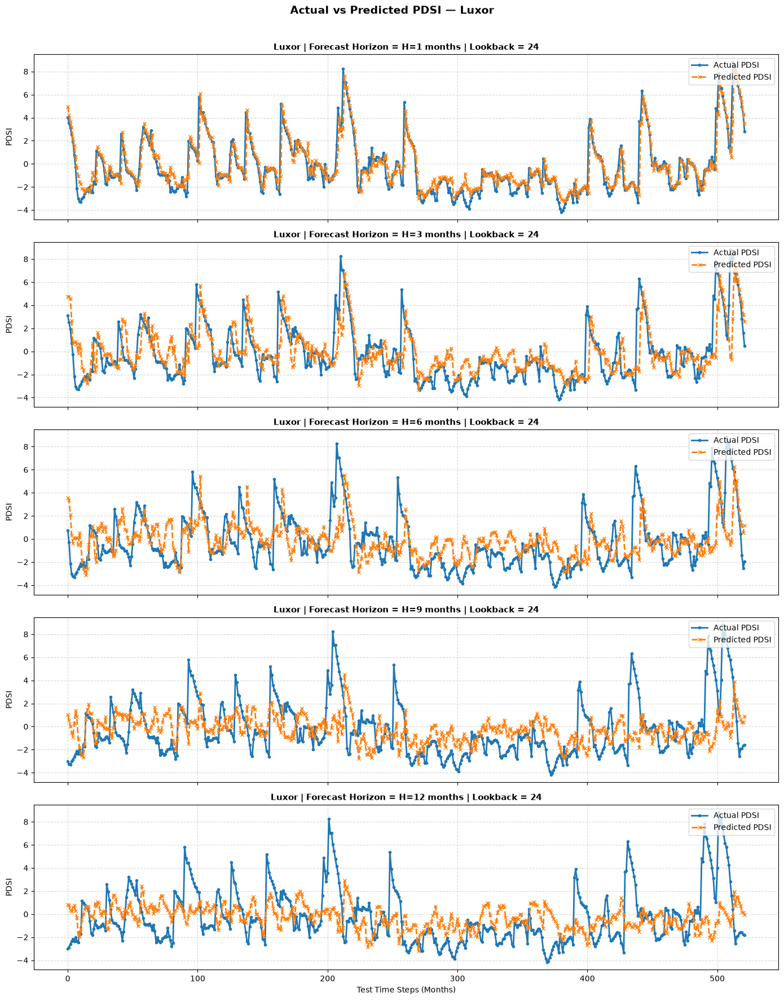


----------------------------------------------------------------------
Governorate: Minya
Original Y_test shape : (522, 5)
Original Y_pred shape : (522, 5)
Real Y_test shape     : (522, 5)
Real Y_pred shape     : (522, 5)
 Saved plot:
   C:\Users\S-GF-L1-D10\Desktop\NileGuard\nileguard_models\plots\PDSI_Actual_vs_Predicted_Minya.png


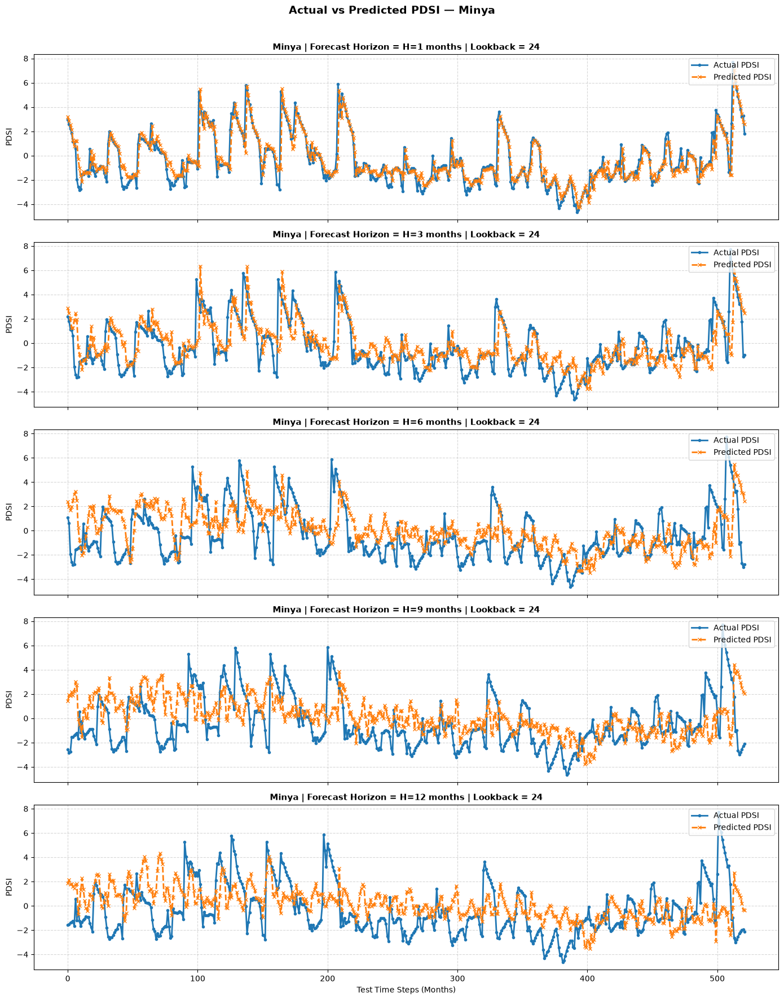


----------------------------------------------------------------------
Governorate: Qena
Original Y_test shape : (522, 5)
Original Y_pred shape : (522, 5)
Real Y_test shape     : (522, 5)
Real Y_pred shape     : (522, 5)
 Saved plot:
   C:\Users\S-GF-L1-D10\Desktop\NileGuard\nileguard_models\plots\PDSI_Actual_vs_Predicted_Qena.png


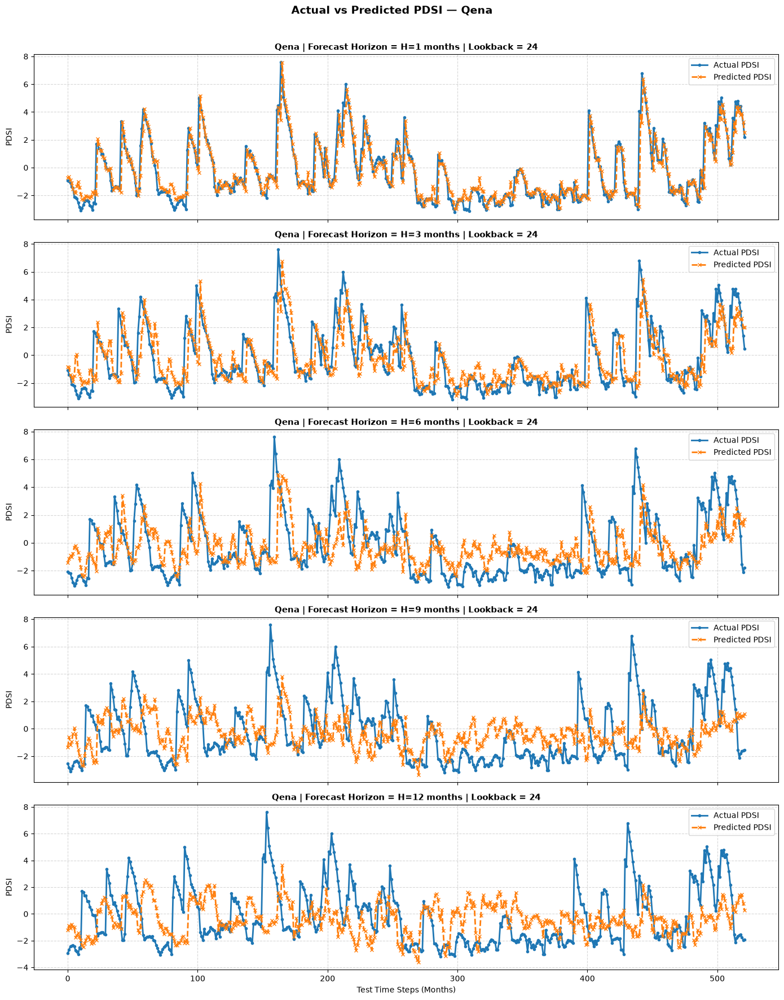


----------------------------------------------------------------------
Governorate: Sohag
Original Y_test shape : (522, 5)
Original Y_pred shape : (522, 5)
Real Y_test shape     : (522, 5)
Real Y_pred shape     : (522, 5)
 Saved plot:
   C:\Users\S-GF-L1-D10\Desktop\NileGuard\nileguard_models\plots\PDSI_Actual_vs_Predicted_Sohag.png


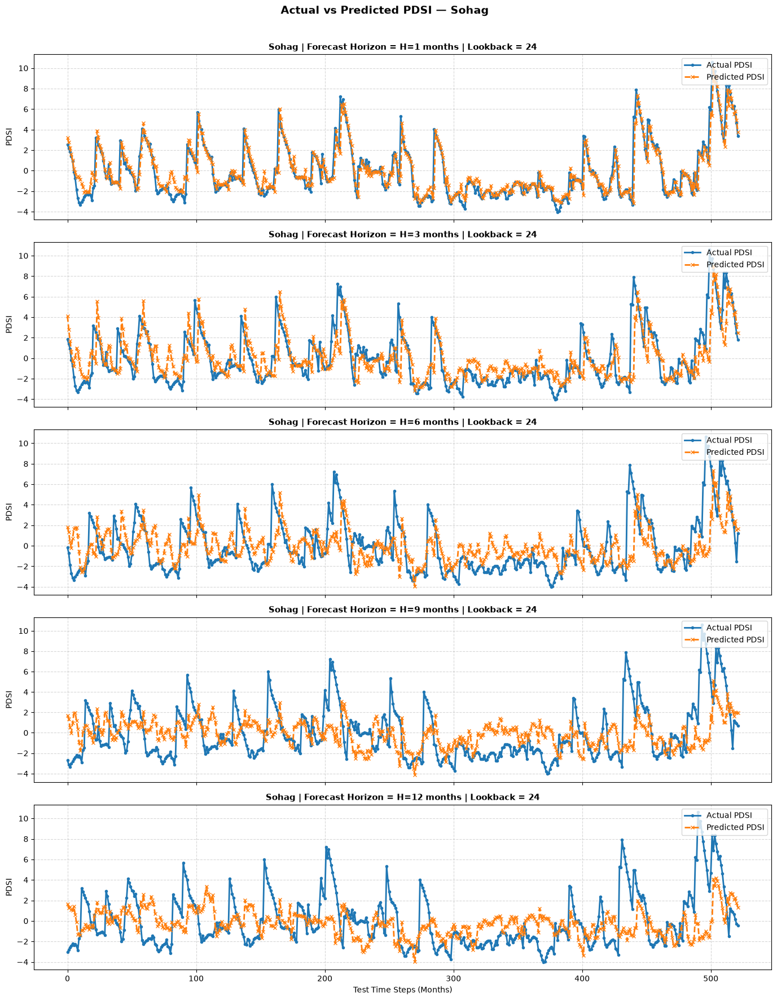


PLOT GENERATION COMPLETE
 Plots created: 8
 Output directory: C:\Users\S-GF-L1-D10\Desktop\NileGuard\nileguard_models\plots


In [39]:
# =====================================================================
# CELL 20: ACTUAL VS PREDICTED PDSI PLOTS
# - Loads scaled predictions
# - Inverse-transforms PDSI exactly once
# - Auto-detects prediction results
# - Saves high-resolution PNG plots
# =====================================================================

base_dir = globals().get(
    "MODELS_DIR",
    os.path.join(os.getcwd(), "nileguard_models")
)

SAVE_DIR = globals().get(
    "PLOTS_DIR",
    os.path.join(base_dir, "plots")
)

# Dynamically locate the scaler file (works on Kaggle and locally)
SEARCH_DIRS = [
    "/kaggle/input",
    str(globals().get("DATA_DIR", os.path.join(os.getcwd(), "data"))),
]

SCALER_PATH = None
for base in SEARCH_DIRS:
    if not os.path.exists(base):
        continue
    for root, dirs, files in os.walk(base):
        for f in files:
            if f.endswith(".joblib"):
                SCALER_PATH = os.path.join(root, f)
                break
        if SCALER_PATH:
            break
    if SCALER_PATH:
        break

os.makedirs(SAVE_DIR, exist_ok=True)

print("=" * 70)
print("CELL 20: ACTUAL VS PREDICTED PDSI")
print("=" * 70)
print(f" Plot output directory:")
print(f"   {SAVE_DIR}")
print()


# =====================================================================
# 2. LOAD PREDICTION DATA
# =====================================================================

data = None
# Search in memory first
prediction_sources = [
    "last_fold_predictions",
    "governorate_predictions",
    "best_results_data",
    "beltagy_last_fold_predictions",
    "predictions"
]

for variable_name in prediction_sources:

    candidate = globals().get(variable_name, None)

    if candidate is not None:

        try:
            if len(candidate) > 0:
                data = candidate
                print(f"Predictions found in memory: {variable_name}")
                break
        except Exception:
            pass


# =====================================================================
# 3. SEARCH ON DISK IF NOT FOUND IN MEMORY
# =====================================================================

if data is None:

    candidate_files = [
        "last_fold_predictions.joblib",
        "beltagy_last_fold_predictions.joblib",
        "governorate_predictions.joblib",
        "all_governorate_results.joblib"
    ]

    for c_file in candidate_files:

        c_path = os.path.join(base_dir, c_file)

        if os.path.exists(c_path):

            try:
                loaded = joblib.load(c_path)

                if isinstance(loaded, dict):

                    data = loaded.get(
                        "best_results_data",
                        loaded
                    )

                else:
                    data = loaded

                print(f" Auto-detected prediction file:")
                print(f"   {c_path}")
                break

            except Exception as e:

                print(f" Could not load {c_file}: {e}")


# =====================================================================
# 4. LOAD PDSI SCALER
# =====================================================================

pdsi_scaler = None

print()
print("=" * 70)
print("LOADING PDSI SCALER")
print("=" * 70)

if SCALER_PATH and os.path.exists(SCALER_PATH):

    try:

        scalers_dict = joblib.load(SCALER_PATH)

        print(" Scaler file loaded successfully")

        print(
            "Available scalers:",
            scalers_dict.keys()
        )

        pdsi_scaler = scalers_dict.get("PDSI", None)

        if pdsi_scaler is not None:

            print("PDSI scaler loaded successfully")
            print(
                f"   Type: {type(pdsi_scaler)}"
            )

        else:

            print(" PDSI scaler was not found")

    except Exception as e:

        print(f" Error loading scaler: {e}")

else:

    print(" Scaler file does not exist:")
    print(f"   {SCALER_PATH}")


# =====================================================================
# 5. INVERSE TRANSFORM FUNCTION
# =====================================================================

def inverse_transform_pdsi(values):

    """
    Convert scaled PDSI values back to original/real PDSI units.

    Input:
        scaled PDSI

    Output:
        original PDSI
    """

    if values is None:
        return None

    values = np.asarray(values, dtype=np.float64)

    if pdsi_scaler is None:
        raise RuntimeError(
            "PDSI scaler is not loaded. "
            "Cannot inverse-transform PDSI."
        )

    original_shape = values.shape

    try:

        values_2d = values.reshape(-1, 1)

        values_original = pdsi_scaler.inverse_transform(
            values_2d
        )

        return values_original.reshape(original_shape)

    except Exception as e:

        raise RuntimeError(
            f"PDSI inverse transformation failed: {e}"
        )


# =====================================================================
# 6. EXPECTED FORECAST HORIZONS
# =====================================================================

# Your current forecasting setup
DEFAULT_HORIZONS = [1, 3, 6, 9, 12]

print()
print(f" Forecast horizons: {DEFAULT_HORIZONS}")


# =====================================================================
# 7. HELPER: FIND VALUE IN DICTIONARY
# =====================================================================

def find_first_available(dictionary, keys):

    for key in keys:

        if key in dictionary:

            value = dictionary[key]

            if value is not None:
                return value

    return None


# =====================================================================
# 8. PLOT FUNCTION
# =====================================================================

if isinstance(data, dict) and len(data) > 0:

    print()
    print("=" * 70)
    print("GENERATING PDSI PLOTS")
    print("=" * 70)

    plots_created = 0

    for gov_name, gov_dict in data.items():

        # -------------------------------------------------------------
        # Validate governorate entry
        # -------------------------------------------------------------

        if not isinstance(gov_dict, dict):
            continue


        # -------------------------------------------------------------
        # Find actual values
        # -------------------------------------------------------------

        y_true = find_first_available(
            gov_dict,
            [
                "Y_test",
                "y_test",
                "y_true",
                "Actual",
                "actual"
            ]
        )


        # -------------------------------------------------------------
        # Find predicted values
        # -------------------------------------------------------------

        y_pred = find_first_available(
            gov_dict,
            [
                "Y_pred",
                "y_pred",
                "Predicted",
                "predicted"
            ]
        )


        if y_true is None or y_pred is None:

            print(
                f" Skipping {gov_name}: "
                "Actual/Predicted data not found"
            )

            continue


        # -------------------------------------------------------------
        # Convert to numpy
        # -------------------------------------------------------------

        y_true = np.asarray(y_true)
        y_pred = np.asarray(y_pred)


        print()
        print("-" * 70)
        print(f"Governorate: {gov_name}")
        print(f"Original Y_test shape : {y_true.shape}")
        print(f"Original Y_pred shape : {y_pred.shape}")


        # -------------------------------------------------------------
        # Fix 1D shape safely
        # -------------------------------------------------------------

        if y_true.ndim == 1:

            y_true = y_true.reshape(-1, 1)

        if y_pred.ndim == 1:

            y_pred = y_pred.reshape(-1, 1)


        # -------------------------------------------------------------
        # Check shape compatibility
        # -------------------------------------------------------------

        if y_true.shape != y_pred.shape:

            print(
                f" Shape mismatch:"
                f" Y_test={y_true.shape},"
                f" Y_pred={y_pred.shape}"
            )

            # Use common number of samples/horizons
            n_samples = min(
                y_true.shape[0],
                y_pred.shape[0]
            )

            n_outputs = min(
                y_true.shape[1],
                y_pred.shape[1]
            )

            y_true = y_true[
                :n_samples,
                :n_outputs
            ]

            y_pred = y_pred[
                :n_samples,
                :n_outputs
            ]


        # -------------------------------------------------------------
        # INVERSE TRANSFORM
        # -------------------------------------------------------------

        # IMPORTANT:
        # y_true and y_pred are scaled PDSI.
        # We inverse-transform exactly once here.

        y_true_real = inverse_transform_pdsi(y_true)
        y_pred_real = inverse_transform_pdsi(y_pred)


        print(
            f"Real Y_test shape     : {y_true_real.shape}"
        )

        print(
            f"Real Y_pred shape     : {y_pred_real.shape}"
        )


        # -------------------------------------------------------------
        # Get horizons
        # -------------------------------------------------------------

        horizons = gov_dict.get(
            "horizons",
            DEFAULT_HORIZONS
        )

        horizons = list(horizons)

        # Make sure the number of horizons matches
        # the prediction columns.

        n_horizons = min(
            y_true_real.shape[1],
            y_pred_real.shape[1],
            len(horizons)
        )


        if n_horizons == 0:

            print(
                f" Skipping {gov_name}: "
                "No forecast horizons available"
            )

            continue


        # -------------------------------------------------------------
        # Lookback
        # -------------------------------------------------------------

        best_lb = gov_dict.get(
            "Best_Lookback",
            gov_dict.get(
                "best_lookback",
                gov_dict.get(
                    "lookback",
                    "N/A"
                )
            )
        )


        # -------------------------------------------------------------
        # Create figure
        # -------------------------------------------------------------

        fig, axes = plt.subplots(
            n_horizons,
            1,
            figsize=(14, 3.5 * n_horizons),
            sharex=True
        )


        if n_horizons == 1:
            axes = [axes]


        # -------------------------------------------------------------
        # Plot each horizon
        # -------------------------------------------------------------

        for h_idx in range(n_horizons):

            h_val = horizons[h_idx]

            ax = axes[h_idx]

            actual_h = y_true_real[:, h_idx]

            pred_h = y_pred_real[:, h_idx]


            # ---------------------------------------------------------
            # Actual
            # ---------------------------------------------------------

            ax.plot(
                actual_h,
                label="Actual PDSI",
                linewidth=2,
                marker="o",
                markersize=3
            )


            # ---------------------------------------------------------
            # Predicted
            # ---------------------------------------------------------

            ax.plot(
                pred_h,
                label="Predicted PDSI",
                linestyle="--",
                linewidth=2,
                marker="x",
                markersize=4
            )


            # ---------------------------------------------------------
            # Labels
            # ---------------------------------------------------------

            ax.set_title(
                f"{gov_name} | "
                f"Forecast Horizon = H={h_val} months | "
                f"Lookback = {best_lb}",
                fontsize=11,
                fontweight="bold"
            )

            ax.set_ylabel(
                "PDSI"
            )

            ax.legend(
                loc="upper right"
            )

            ax.grid(
                True,
                linestyle="--",
                alpha=0.5
            )


        axes[-1].set_xlabel(
            "Test Time Steps (Months)",
            fontsize=10
        )


        # -------------------------------------------------------------
        # Main title
        # -------------------------------------------------------------

        fig.suptitle(
            f"Actual vs Predicted PDSI — {gov_name}",
            fontsize=14,
            fontweight="bold",
            y=1.01
        )


        plt.tight_layout()


        # -------------------------------------------------------------
        # Save
        # -------------------------------------------------------------

        safe_gov_name = str(gov_name).replace(
            "/",
            "_"
        )

        save_filepath = os.path.join(
            SAVE_DIR,
            f"PDSI_Actual_vs_Predicted_{safe_gov_name}.png"
        )


        plt.savefig(
            save_filepath,
            dpi=300,
            bbox_inches="tight"
        )


        print(
            f" Saved plot:"
        )

        print(
            f"   {save_filepath}"
        )


        plots_created += 1


        plt.show()

        plt.close(fig)


    # =================================================================
    # FINAL SUMMARY
    # =================================================================

    print()
    print("=" * 70)
    print("PLOT GENERATION COMPLETE")
    print("=" * 70)
    print(f" Plots created: {plots_created}")
    print(f" Output directory: {SAVE_DIR}")


else:

    print()
    print("=" * 70)
    print(" PREDICTION DATA NOT FOUND")
    print("=" * 70)

    print(
        "Prediction data was not found in memory "
        "or in the expected files."
    )

In [40]:
# ============================================================
# Cell 21: Performance Metrics & Model Evaluation (DYNAMIC SEARCH & AUTO-SAVE)
# ============================================================

# 1. IGNORE VERSION WARNINGS
warnings.filterwarnings("ignore")

# 2. PATHS SETUP
base_dir = globals().get('MODELS_DIR', os.path.join(os.getcwd(), "nileguard_models"))
SCALER_PATH = os.path.join(globals().get("DATA_DIR", os.path.join(os.getcwd(), "data")), "nileguard_scalers_objects.joblib")

# 3. DYNAMIC SEARCH FOR PREDICTIONS (MEMORY -> DISK CANDIDATES)
data = (
    globals().get("last_fold_predictions") or
    globals().get("governorate_predictions") or
    globals().get("best_results_data") or
    globals().get("beltagy_last_fold_predictions") or
    globals().get("predictions")
)

if not data:
    candidate_files = [
        "last_fold_predictions.joblib",
        "beltagy_last_fold_predictions.joblib",
        "governorate_predictions.joblib",
        "all_governorate_results.joblib"
    ]
    for c_file in candidate_files:
        c_path = os.path.join(base_dir, c_file)
        if os.path.exists(c_path):
            try:
                loaded = joblib.load(c_path)
                data = loaded.get("best_results_data", loaded)
                print(f" Loaded predictions successfully from disk: {c_file}")
                break
            except Exception as e:
                print(f" Error reading file {c_file}: {e}")

# Unwrap dictionary if stored under a parent key
if isinstance(data, dict) and len(data) == 1:
    first_key = list(data.keys())[0]
    if isinstance(data[first_key], dict) and first_key in ["beltagy_last_fold_predictions", "last_fold_predictions", "best_results_data"]:
        data = data[first_key]

# Load Scaler
pdsi_scaler = None
if os.path.exists(SCALER_PATH):
    try:
        scalers = joblib.load(SCALER_PATH)
        pdsi_scaler = scalers.get("PDSI", None) if isinstance(scalers, dict) else scalers
    except Exception as e:
        print(f" Scaler loading issue: {e}")

def scale_to_real(arr, scaler):
    if scaler is None or arr is None:
        return np.asarray(arr)
    try:
        arr_np = np.asarray(arr)
        return scaler.inverse_transform(arr_np.reshape(-1, 1)).reshape(arr_np.shape)
    except Exception:
        return np.asarray(arr)

# 4. COMPUTE METRICS
if isinstance(data, dict) and len(data) > 0:
    records = []
    DEFAULT_HORIZONS = globals().get("HORIZONS_MULTI", [1, 3, 6, 9, 12])

    for gov_name, gov_dict in data.items():
        if not isinstance(gov_dict, dict):
            continue

        y_true, y_pred = None, None
        for k in ["Y_test", "y_test", "y_true", "Actual", "actual"]:
            if k in gov_dict and gov_dict[k] is not None:
                y_true = gov_dict[k]
                break
        for k in ["Y_pred", "y_pred", "Predicted", "predicted"]:
            if k in gov_dict and gov_dict[k] is not None:
                y_pred = gov_dict[k]
                break

        if y_true is None or y_pred is None:
            continue

        # Convert to 2D numpy arrays
        y_true_arr = np.atleast_2d(np.asarray(y_true))
        y_pred_arr = np.atleast_2d(np.asarray(y_pred))

        # Inverse transform to real scale
        y_true_real = scale_to_real(y_true_arr, pdsi_scaler)
        y_pred_real = scale_to_real(y_pred_arr, pdsi_scaler)

        horizons = gov_dict.get("horizons", DEFAULT_HORIZONS)
        n_horizons = min(y_true_real.shape[1], len(horizons))

        for h_idx in range(n_horizons):
            h_val = horizons[h_idx] if h_idx < len(horizons) else f"Step {h_idx+1}"

            yt = y_true_real[:, h_idx]
            yp = y_pred_real[:, h_idx]

            # Filter missing values safely
            valid_mask = ~(np.isnan(yt) | np.isnan(yp))
            if not np.any(valid_mask):
                continue

            yt_v, yp_v = yt[valid_mask], yp[valid_mask]

            test_r2 = r2_score(yt_v, yp_v)
            mae = mean_absolute_error(yt_v, yp_v)
            rmse = np.sqrt(mean_squared_error(yt_v, yp_v))

            records.append({
                "Governorate": gov_name,
                "Horizon": f"H={h_val}m",
                "Test_R2": round(test_r2, 4),
                "MAE (Real Units)": round(mae, 4),
                "RMSE (Real Units)": round(rmse, 4),
            })

    if records:
        df_results = pd.DataFrame(records)
        print("\n=== PERFORMANCE METRICS TABLE ===")
        print(df_results.to_string(index=False))

        print("\n=== SUMMARY METRICS OVERALL ===")
        print(f"Average Test R²:   {df_results['Test_R2'].mean():.4f}")
        print(f"Average Test MAE:  {df_results['MAE (Real Units)'].mean():.4f}")
        print(f"Average Test RMSE: {df_results['RMSE (Real Units)'].mean():.4f}")

        # Save results to CSV
        os.makedirs(base_dir, exist_ok=True)
        csv_out = os.path.join(base_dir, "performance_metrics_summary.csv")
        df_results.to_csv(csv_out, index=False)
        print(f"\n Performance metrics table saved to: {csv_out}")
    else:
        print(" No valid prediction samples were available for evaluation.")

else:
    print(f" Structural match failed or no data found. Object type loaded: {type(data)}")


=== PERFORMANCE METRICS TABLE ===
Governorate Horizon  Test_R2  MAE (Real Units)  RMSE (Real Units)
      Aswan    H=1m   0.7846            0.5988             0.9762
      Aswan    H=3m   0.3906            1.1357             1.6403
      Aswan    H=6m  -0.1506            1.7500             2.2534
      Aswan    H=9m  -0.3425            1.9487             2.4343
      Aswan   H=12m  -0.2724            1.8907             2.3675
      Asyut    H=1m   0.7597            0.5141             0.9547
      Asyut    H=3m   0.3374            1.0572             1.5837
      Asyut    H=6m   0.0686            1.4263             1.8837
      Asyut    H=9m  -0.1499            1.6765             2.0948
      Asyut   H=12m  -0.1457            1.6559             2.0816
   BeniSuef    H=1m   0.7581            0.7188             1.2812
   BeniSuef    H=3m   0.3457            1.5316             2.1058
   BeniSuef    H=6m   0.0249            2.0131             2.5743
   BeniSuef    H=9m  -0.1013            2

In [41]:
# ============================================================
# Cell 22: Aggregate Performance Metrics by Horizon & Export CSV
# ============================================================
# Load df_results from Cell 21 output
if 'df_results' in globals():
    # Group by Horizon to see average behavior across all governorates
    df_horizon_summary = (
        df_results.groupby("Horizon")
        .agg(
            Mean_Test_R2=("Test_R2", "mean"),
            Std_Test_R2=("Test_R2", "std"),
            Mean_MAE=("MAE (Real Units)", "mean"),
            Mean_RMSE=("RMSE (Real Units)", "mean"),
        )
        .reset_index()
    )

    print("=== SUMMARY METRICS BY HORIZON (AVERAGE ACROSS ALL GOVERNORATES) ===")
    print(df_horizon_summary.to_string(index=False))

    # Save outputs to disk
    output_dir = os.path.join(globals().get("MODELS_DIR", os.path.join(os.getcwd(), "nileguard_models")), "plots")
    os.makedirs(output_dir, exist_ok=True)

    csv_path_gov = os.path.join(output_dir, "governorate_metrics_pdsi.csv")
    csv_path_horizon = os.path.join(output_dir, "horizon_summary_pdsi.csv")

    df_results.to_csv(csv_path_gov, index=False)
    df_horizon_summary.to_csv(csv_path_horizon, index=False)

    print(f"\n Detailed metrics saved to: {csv_path_gov}")
    print(f" Horizon summary saved to: {csv_path_horizon}")
else:
    print(" 'df_results' DataFrame not found. Please run Cell 21 first.")

=== SUMMARY METRICS BY HORIZON (AVERAGE ACROSS ALL GOVERNORATES) ===
Horizon  Mean_Test_R2  Std_Test_R2  Mean_MAE  Mean_RMSE
  H=12m     -0.205925     0.072969  1.910300   2.373588
   H=1m      0.782288     0.018025  0.576225   1.015013
   H=3m      0.397413     0.049260  1.167937   1.685125
   H=6m      0.036100     0.098542  1.634162   2.127413
   H=9m     -0.157400     0.093181  1.855825   2.325050

 Detailed metrics saved to: C:\Users\S-GF-L1-D10\Desktop\NileGuard\nileguard_models\plots\governorate_metrics_pdsi.csv
 Horizon summary saved to: C:\Users\S-GF-L1-D10\Desktop\NileGuard\nileguard_models\plots\horizon_summary_pdsi.csv


In [43]:
# ============================================================
# Cell 27: Compute R² per horizon step + plot
# ============================================================
# 1. SETUP OUTPUT DIRECTORY
save_dir = os.path.join(globals().get("MODELS_DIR", os.path.join(os.getcwd(), "nileguard_models")), "plots")
os.makedirs(save_dir, exist_ok=True)

# 2. CHECK AND RECONSTRUCT HORIZON DATA IF MISSING
horizon_actuals = globals().get("horizon_actuals", {})
horizon_preds = globals().get("horizon_preds", {})

if not horizon_actuals or not horizon_preds:
    PRED_PATH = os.path.join(globals().get("MODELS_DIR", os.path.join(os.getcwd(), "nileguard_models")), "beltagy_last_fold_predictions.joblib")
    if os.path.exists(PRED_PATH):
        try:
            data = joblib.load(PRED_PATH)
            if (
                isinstance(data, dict)
                and len(data) == 1
                and "beltagy_last_fold_predictions" in data
            ):
                data = data["beltagy_last_fold_predictions"]

            horizon_actuals = {}
            horizon_preds = {}

            for gov_dict in data.values():
                if not isinstance(gov_dict, dict):
                    continue

                y_true, y_pred = None, None
                for k in ["Y_test", "y_test", "Actual", "actual"]:
                    if k in gov_dict:
                        y_true = gov_dict[k]
                        break
                for k in ["Y_pred", "y_pred", "Predicted", "predicted"]:
                    if k in gov_dict:
                        y_pred = gov_dict[k]
                        break

                if y_true is None or y_pred is None:
                    continue

                y_true_np = np.asarray(y_true)
                y_pred_np = np.asarray(y_pred)

                horizons = gov_dict.get("horizons", [1, 3, 6, 9, 12])
                n_horizons = (
                    y_true_np.shape[1] if y_true_np.ndim > 1 else len(horizons)
                )

                for h_idx in range(n_horizons):
                    h_val = (
                        horizons[h_idx]
                        if h_idx < len(horizons)
                        else h_idx + 1
                    )

                    yt = (
                        y_true_np[:, h_idx]
                        if y_true_np.ndim > 1
                        else y_true_np
                    )
                    yp = (
                        y_pred_np[:, h_idx]
                        if y_pred_np.ndim > 1
                        else y_pred_np
                    )

                    horizon_actuals.setdefault(h_val, []).extend(yt)
                    horizon_preds.setdefault(h_val, []).extend(yp)

            print(" Auto-reconstructed horizon actuals & predictions from disk.")
        except Exception as e:
            print(f" Failed to reconstruct horizon data: {e}")

# Determine MAX_HORIZON
MAX_HORIZON = globals().get(
    "MAX_HORIZON", max(horizon_actuals.keys()) if horizon_actuals else 12
)

# 3. COMPUTE R² PER HORIZON STEP
horizon_r2 = {}
for h in range(1, MAX_HORIZON + 1):
    if h in horizon_actuals and len(horizon_actuals[h]) > 2:
        horizon_r2[h] = r2_score(horizon_actuals[h], horizon_preds[h])

# Print Metrics Table
print(f"\n{'Horizon (months ahead)':<25}{'R²'}")
print("-" * 40)
for h, r2_val in horizon_r2.items():
    print(f"{h:<25}{r2_val:.4f}")

# 4. PLOT R² VS FORECAST HORIZON
if horizon_r2:
    plt.figure(figsize=(10, 5))
    plt.plot(
        list(horizon_r2.keys()),
        list(horizon_r2.values()),
        marker="o",
        linewidth=2,
        color="#1f77b4",
        label="Test R²",
    )
    plt.axhline(
        y=0,
        color="red",
        linestyle="--",
        alpha=0.6,
        label="R²=0 (No better than mean)",
    )

    plt.xlabel("Forecast Horizon (months ahead)", fontsize=11)
    plt.ylabel("R² Score", fontsize=11)
    plt.title("Forecast Accuracy vs. Horizon Length", fontsize=13, fontweight="bold")
    plt.legend(loc="upper right")
    plt.grid(True, linestyle="--", alpha=0.6)
    plt.tight_layout()

    # Save High-Res Image
    plot_path = os.path.join(save_dir, "r2_vs_horizon_decay.png")
    plt.savefig(plot_path, dpi=300, bbox_inches="tight")
    print(f"\n Plot successfully saved to: {plot_path}")
    plt.show()
else:
    print(" No horizon evaluation data available to compute R².")


Horizon (months ahead)   R²
----------------------------------------
 No horizon evaluation data available to compute R².


## Simulate Realistic Rolling One-Month-Ahead Forecasting

 Output directory for plots: C:\Users\S-GF-L1-D10\Desktop\NileGuard\nileguard_models\plots

 Saved rolling forecast plot for Aswan: C:\Users\S-GF-L1-D10\Desktop\NileGuard\nileguard_models\plots\Rolling_1M_Forecast_Aswan_160steps.png


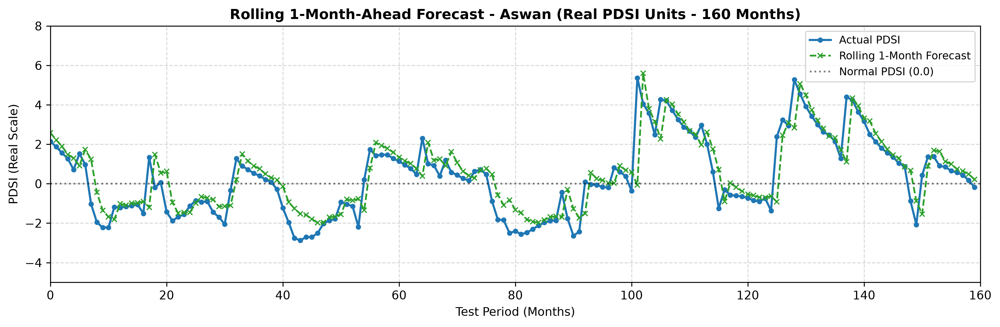

 Saved rolling forecast plot for Asyut: C:\Users\S-GF-L1-D10\Desktop\NileGuard\nileguard_models\plots\Rolling_1M_Forecast_Asyut_160steps.png


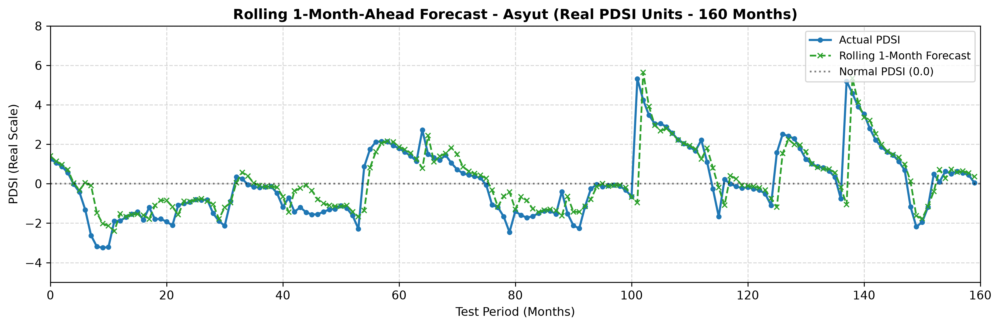

 Saved rolling forecast plot for BeniSuef: C:\Users\S-GF-L1-D10\Desktop\NileGuard\nileguard_models\plots\Rolling_1M_Forecast_BeniSuef_160steps.png


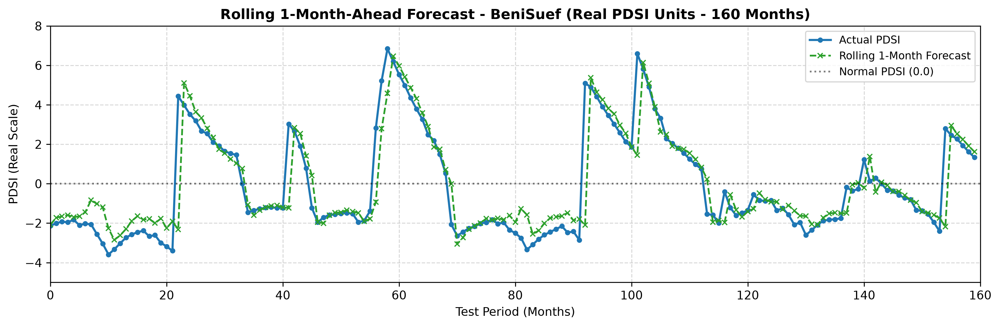

 Saved rolling forecast plot for Fayoum: C:\Users\S-GF-L1-D10\Desktop\NileGuard\nileguard_models\plots\Rolling_1M_Forecast_Fayoum_160steps.png


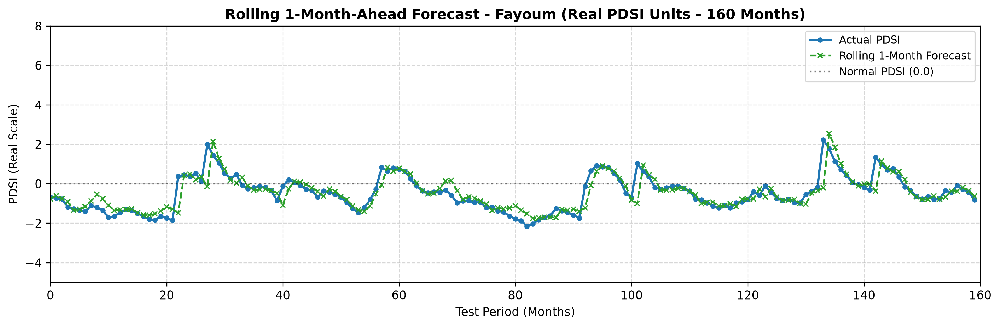

 Saved rolling forecast plot for Luxor: C:\Users\S-GF-L1-D10\Desktop\NileGuard\nileguard_models\plots\Rolling_1M_Forecast_Luxor_160steps.png


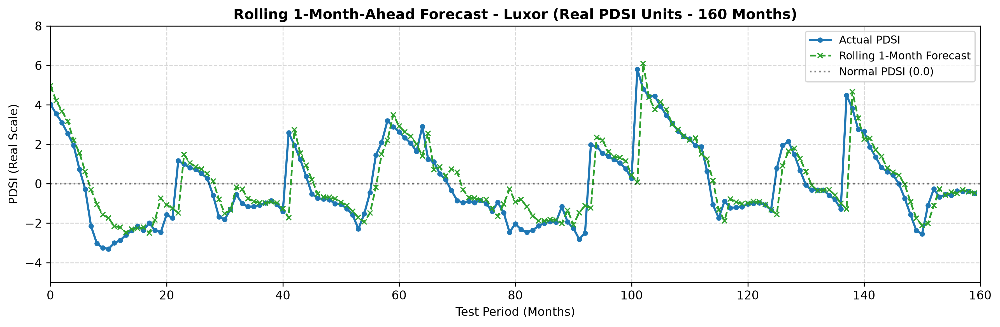

 Saved rolling forecast plot for Minya: C:\Users\S-GF-L1-D10\Desktop\NileGuard\nileguard_models\plots\Rolling_1M_Forecast_Minya_160steps.png


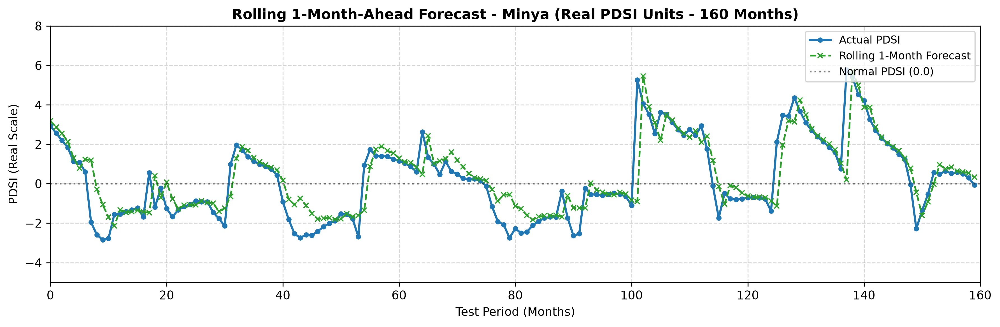

 Saved rolling forecast plot for Qena: C:\Users\S-GF-L1-D10\Desktop\NileGuard\nileguard_models\plots\Rolling_1M_Forecast_Qena_160steps.png


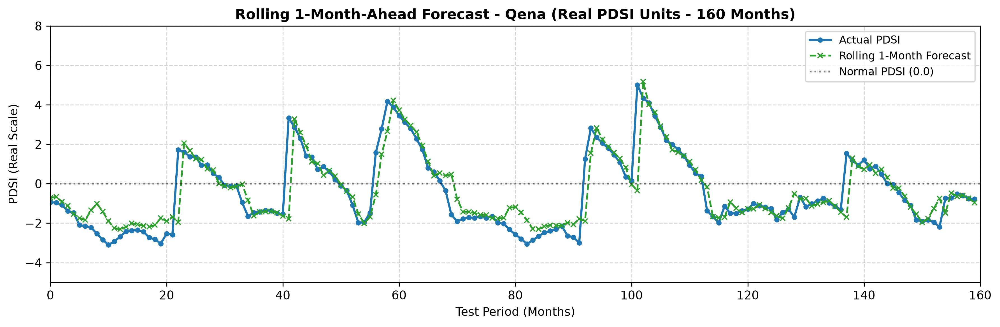

 Saved rolling forecast plot for Sohag: C:\Users\S-GF-L1-D10\Desktop\NileGuard\nileguard_models\plots\Rolling_1M_Forecast_Sohag_160steps.png


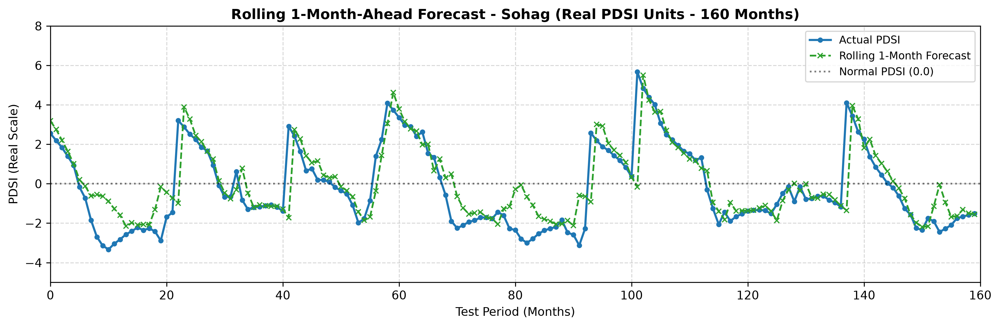

In [44]:
# ============================================================
# CELL 29: ROLLING 1-MONTH FORECAST FOR ALL GOVERNORATES (DYNAMIC SEARCH & AUTO-SAVE)
# ============================================================

# 1. FILE PATHS & SETUP
base_dir = globals().get('MODELS_DIR', os.path.join(os.getcwd(), "nileguard_models"))
SCALER_PATH = os.path.join(globals().get("DATA_DIR", os.path.join(os.getcwd(), "data")), "nileguard_scalers_objects.joblib")
SAVE_DIR = globals().get('PLOTS_DIR', os.path.join(globals().get("MODELS_DIR", os.path.join(os.getcwd(), "nileguard_models")), "plots"))

os.makedirs(SAVE_DIR, exist_ok=True)
print(f" Output directory for plots: {SAVE_DIR}\n")

N_STEPS = 160  # Continuous months window

# 2. DYNAMIC SEARCH FOR PREDICTIONS FILE (MEMORY -> DISK CANDIDATES)
data_dict = (
    globals().get("last_fold_predictions") or
    globals().get("governorate_predictions") or
    globals().get("best_results_data") or
    globals().get("beltagy_last_fold_predictions") or
    globals().get("predictions")
)

if not data_dict:
    candidate_files = [
        "last_fold_predictions.joblib",
        "beltagy_last_fold_predictions.joblib",
        "governorate_predictions.joblib",
        "all_governorate_results.joblib"
    ]
    for c_file in candidate_files:
        c_path = os.path.join(base_dir, c_file)
        if os.path.exists(c_path):
            try:
                loaded = joblib.load(c_path)
                data_dict = loaded.get("best_results_data", loaded)
                print(f" Auto-detected and loaded predictions file: {c_file}")
                break
            except Exception as e:
                print(f" Error reading file {c_file}: {e}")

# Unwrap nested dictionary if present
if isinstance(data_dict, dict) and len(data_dict) == 1:
    first_key = list(data_dict.keys())[0]
    if isinstance(data_dict[first_key], dict) and first_key in ["beltagy_last_fold_predictions", "last_fold_predictions", "best_results_data"]:
        data_dict = data_dict[first_key]

# 3. LOAD PDSI SCALER
pdsi_scaler = None
if os.path.exists(SCALER_PATH):
    try:
        scalers = joblib.load(SCALER_PATH)
        pdsi_scaler = scalers.get("PDSI", None) if isinstance(scalers, dict) else scalers
    except Exception as e:
        print(f" Warning loading scaler: {e}")

def scale_to_real_1d(arr, scaler):
    if scaler is None or arr is None:
        return np.asarray(arr).ravel()
    try:
        arr_np = np.asarray(arr)
        return scaler.inverse_transform(arr_np.reshape(-1, 1)).ravel()
    except Exception:
        return np.asarray(arr).ravel()

# 4. GENERATE ROLLING FORECAST PLOTS FOR ALL GOVERNORATES
if isinstance(data_dict, dict) and len(data_dict) > 0:
    for gov_name, gov_data in data_dict.items():
        if not isinstance(gov_data, dict):
            continue

        y_true, y_pred = None, None
        for key in ["Y_test", "y_test", "y_true", "Actual", "actual"]:
            if key in gov_data and gov_data[key] is not None:
                y_true = np.asarray(gov_data[key])
                break
        for key in ["Y_pred", "y_pred", "Predicted", "predicted"]:
            if key in gov_data and gov_data[key] is not None:
                y_pred = np.asarray(gov_data[key])
                break

        if y_true is None or y_pred is None:
            continue

        # Extract Horizon 1 only (Column 0)
        if y_true.ndim > 1 and y_true.shape[1] > 0:
            actuals_1d = y_true[:, 0]
            preds_1d = y_pred[:, 0]
        else:
            actuals_1d = y_true.ravel()
            preds_1d = y_pred.ravel()

        # Inverse scale to real PDSI units
        actuals_real = scale_to_real_1d(actuals_1d, pdsi_scaler)
        preds_real = scale_to_real_1d(preds_1d, pdsi_scaler)

        # Slice to requested time window
        n_available = min(N_STEPS, len(actuals_real))
        actuals_plot = actuals_real[:n_available]
        preds_plot = preds_real[:n_available]

        # Generate Plot
        plt.figure(figsize=(12, 4), dpi=300)

        plt.plot(
            actuals_plot,
            label="Actual PDSI",
            color="#1f77b4",
            linewidth=1.8,
            marker="o",
            markersize=3.5,
        )
        plt.plot(
            preds_plot,
            label="Rolling 1-Month Forecast",
            color="#2ca02c",
            linestyle="--",
            linewidth=1.5,
            marker="x",
            markersize=4.5,
        )

        # Reference Line and Bounds
        plt.axhline(0, color="black", linestyle=":", alpha=0.5, label="Normal PDSI (0.0)")
        plt.xlim(0, n_available)
        plt.ylim(-5, 8)  # Set Y-axis bounds (-5 to 8)

        # Formatting
        plt.title(
            f"Rolling 1-Month-Ahead Forecast - {gov_name} (Real PDSI Units - {n_available} Months)",
            fontsize=12,
            fontweight="bold",
        )
        plt.xlabel("Test Period (Months)", fontsize=10)
        plt.ylabel("PDSI (Real Scale)", fontsize=10)
        plt.legend(loc="upper right", fontsize=9)
        plt.grid(True, linestyle="--", alpha=0.5)
        plt.tight_layout()

        # Save Figure
        plot_filepath = os.path.join(SAVE_DIR, f"Rolling_1M_Forecast_{gov_name}_160steps.png")
        plt.savefig(plot_filepath, dpi=300, bbox_inches="tight")
        print(f" Saved rolling forecast plot for {gov_name}: {plot_filepath}")

        plt.show()

else:
    print(" Prediction data dictionary not found in memory or on disk.")

In [ ]:
# ============================================================
# CELL 30: RECONSTRUCT FULL PDSI TIMELINE & EXTREME YEARS (ALL GOVERNORATES)
# ============================================================
# 1. PATHS SETUP & OUTPUT DIRECTORY
base_dir = globals().get('MODELS_DIR', os.path.join(os.getcwd(), "nileguard_models"))
save_dir = globals().get('PLOTS_DIR', os.path.join(globals().get("MODELS_DIR", os.path.join(os.getcwd(), "nileguard_models")), "plots"))
SCALER_PATH = os.path.join(globals().get("DATA_DIR", os.path.join(os.getcwd(), "data")), "nileguard_scalers_objects.joblib")

os.makedirs(save_dir, exist_ok=True)

# 2. RETRIEVE GOVERNORATES & EMBEDDINGS
GOVERNORATE_NAMES = globals().get(
    "GOVERNORATE_NAMES",
    {
        1: "Aswan",
        2: "Asyut",
        3: "BeniSuef",
        4: "Fayoum",
        5: "Luxor",
        6: "Minya",
        7: "Qena",
        8: "Sohag",
    },
)

gov_embeddings = (
    globals().get("gov_embeddings") or
    globals().get("governorate_embeddings") or
    globals().get("GOV_EMBEDDINGS") or
    {}
)

# 3. RETRIEVE SCALER IF MISSING
pdsi_scaler = globals().get("pdsi_scaler") or globals().get("scaler_pdsi")
if pdsi_scaler is None and os.path.exists(SCALER_PATH):
    try:
        scalers = joblib.load(SCALER_PATH)
        pdsi_scaler = scalers.get("PDSI", None) if isinstance(scalers, dict) else scalers
    except Exception:
        pass

def scale_to_real_series(arr, scaler):
    if scaler is None or arr is None:
        return np.ravel(arr)
    try:
        return scaler.inverse_transform(np.ravel(arr).reshape(-1, 1)).ravel()
    except Exception:
        return np.ravel(arr)

# 4. RECONSTRUCT TIMELINES FOR ALL GOVERNORATES
all_extreme_summary = []
all_timelines = []

if not gov_embeddings:
    print(" 'gov_embeddings' dictionary not found in memory.")
else:
    print("=" * 75)
    print(" FULL PDSI TIMELINE ANALYSIS & EXTREME YEARS - ALL GOVERNORATES")
    print("=" * 75 + "\n")

    for gov_id, gov_name in GOVERNORATE_NAMES.items():
        # Match key flexibly in gov_embeddings
        key_to_use = None
        for k in gov_embeddings.keys():
            if str(k).lower() in [str(gov_id).lower(), gov_name.lower()]:
                key_to_use = k
                break

        if key_to_use is None:
            continue

        hist_entry = gov_embeddings[key_to_use]
        real_series_scaled = (
            hist_entry[1] if isinstance(hist_entry, tuple) else hist_entry
        )
        real_series_scaled = np.ravel(real_series_scaled)

        # Inverse Transform to Real PDSI Units
        real_series_actual = scale_to_real_series(real_series_scaled, pdsi_scaler)

        # Dynamic date range based on actual series length
        T_total = len(real_series_actual)
        date_index = pd.date_range(start="1958-01-01", periods=T_total, freq="MS")

        pdsi_df = pd.DataFrame({"date": date_index, "PDSI": real_series_actual})
        pdsi_df["Governorate"] = gov_name
        pdsi_df["year"] = pdsi_df["date"].dt.year
        all_timelines.append(pdsi_df)

        yearly_avg = pdsi_df.groupby("year")["PDSI"].mean()

        driest_5 = yearly_avg.sort_values().head(5)
        wettest_5 = yearly_avg.sort_values(ascending=False).head(5)

        print(f" Governorate: {gov_name} ({T_total} Months | {pdsi_df['year'].min()}-{pdsi_df['year'].max()})")
        print("-" * 60)

        driest_str = ", ".join([f"{yr} ({val:.2f})" for yr, val in driest_5.items()])
        wettest_str = ", ".join([f"{yr} ({val:.2f})" for yr, val in wettest_5.items()])

        print(f" Driest 5 Years:  {driest_str}")
        print(f" Wettest 5 Years: {wettest_str}\n")

        for yr, val in driest_5.items():
            all_extreme_summary.append({
                "Governorate": gov_name,
                "Type": "Driest",
                "Year": yr,
                "Mean_PDSI": round(val, 4)
            })

        for yr, val in wettest_5.items():
            all_extreme_summary.append({
                "Governorate": gov_name,
                "Type": "Wettest",
                "Year": yr,
                "Mean_PDSI": round(val, 4)
            })

    # Save summary tables to CSV
    if all_extreme_summary:
        df_summary = pd.DataFrame(all_extreme_summary)
        csv_summary_path = os.path.join(save_dir, "pdsi_extreme_years_summary.csv")
        df_summary.to_csv(csv_summary_path, index=False)
        print(f" Saved extreme years summary to: {csv_summary_path}")

    if all_timelines:
        df_full_timelines = pd.concat(all_timelines, ignore_index=True)
        csv_timelines_path = os.path.join(save_dir, "pdsi_full_reconstructed_timelines.csv")
        df_full_timelines.to_csv(csv_timelines_path, index=False)
        print(f" Saved full reconstructed timelines to: {csv_timelines_path}")

 'gov_embeddings' dictionary not found in memory.


In [45]:
import os
import joblib
import numpy as np
import pandas as pd
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# 1. Define Nash-Sutcliffe Efficiency (NSE) Metric
def calculate_nse(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    numerator = np.sum((y_true - y_pred) ** 2)
    denominator = np.sum((y_true - np.mean(y_true)) ** 2)
    return 1 - (numerator / denominator) if denominator != 0 else np.nan

# 2. File Path
file_path = os.path.join(globals().get("MODELS_DIR", os.path.join(os.getcwd(), "nileguard_models")), "beltagy_last_fold_predictions.joblib")
predictions_dict = joblib.load(file_path)

records = []

target_horizons = [1, 3, 6, 9, 12]

# 3. Process Governorates based on sub-keys structure
for gov_name, gov_data in predictions_dict.items():
    if not isinstance(gov_data, dict):
        continue

    y_true_obj = gov_data.get('y_true', gov_data.get('Actual', gov_data.get('Y_test')))
    y_pred_obj = gov_data.get('y_pred', gov_data.get('Predicted', gov_data.get('Y_pred')))
    horizons = gov_data.get('horizons', gov_data.get('horizons_found', target_horizons))

    # CASE A: y_true and y_pred are dictionaries keyed by horizon
    if isinstance(y_true_obj, dict) and isinstance(y_pred_obj, dict):
        for h in target_horizons:
            h_key = next((k for k in y_true_obj.keys() if str(h) in str(k)), None)
            if h_key is not None and h_key in y_pred_obj:
                yt = np.array(y_true_obj[h_key]).flatten()
                yp = np.array(y_pred_obj[h_key]).flatten()

                mask = ~np.isnan(yt) & ~np.isnan(yp)
                yt, yp = yt[mask], yp[mask]

                if len(yt) > 0:
                    # Proposed Model
                    records.append({
                        'Governorate': gov_name, 'Lead Time': f'h = {h}', 'Model': 'Proposed Model',
                        'RMSE': round(np.sqrt(mean_squared_error(yt, yp)), 4),
                        'MAE': round(mean_absolute_error(yt, yp), 4),
                        'R2': round(r2_score(yt, yp), 4),
                        'NSE': round(calculate_nse(yt, yp), 4)
                    })
                    # Persistence Baseline
                    if len(yt) > h:
                        y_pers_true = yt[h:]
                        y_pers_pred = yt[:-h]
                        records.append({
                            'Governorate': gov_name, 'Lead Time': f'h = {h}', 'Model': 'Persistence Baseline',
                            'RMSE': round(np.sqrt(mean_squared_error(y_pers_true, y_pers_pred)), 4),
                            'MAE': round(mean_absolute_error(y_pers_true, y_pers_pred), 4),
                            'R2': round(r2_score(y_pers_true, y_pers_pred), 4),
                            'NSE': round(calculate_nse(y_pers_true, y_pers_pred), 4)
                        })

    # CASE B: y_true and y_pred are 2D arrays / DataFrames
    elif isinstance(y_true_obj, (np.ndarray, pd.DataFrame, list)) and isinstance(y_pred_obj, (np.ndarray, pd.DataFrame, list)):
        yt_arr = np.array(y_true_obj)
        yp_arr = np.array(y_pred_obj)

        if yt_arr.ndim == 1:
            yt_arr = yt_arr.reshape(-1, 1)
        if yp_arr.ndim == 1:
            yp_arr = yp_arr.reshape(-1, 1)

        horizons_list = list(horizons) if isinstance(horizons, (list, tuple, np.ndarray)) else target_horizons

        for idx, h in enumerate(horizons_list):
            if h in target_horizons and idx < yt_arr.shape[1] and idx < yp_arr.shape[1]:
                yt = yt_arr[:, idx]
                yp = yp_arr[:, idx]

                mask = ~np.isnan(yt) & ~np.isnan(yp)
                yt, yp = yt[mask], yp[mask]

                if len(yt) > 0:
                    records.append({
                        'Governorate': gov_name, 'Lead Time': f'h = {h}', 'Model': 'Proposed Model',
                        'RMSE': round(np.sqrt(mean_squared_error(yt, yp)), 4),
                        'MAE': round(mean_absolute_error(yt, yp), 4),
                        'R2': round(r2_score(yt, yp), 4),
                        'NSE': round(calculate_nse(yt, yp), 4)
                    })
                    if len(yt) > h:
                        y_pers_true = yt[h:]
                        y_pers_pred = yt[:-h]
                        records.append({
                            'Governorate': gov_name, 'Lead Time': f'h = {h}', 'Model': 'Persistence Baseline',
                            'RMSE': round(np.sqrt(mean_squared_error(y_pers_true, y_pers_pred)), 4),
                            'MAE': round(mean_absolute_error(y_pers_true, y_pers_pred), 4),
                            'R2': round(r2_score(y_pers_true, y_pers_pred), 4),
                            'NSE': round(calculate_nse(y_pers_true, y_pers_pred), 4)
                        })

# 4. Generate Final Evaluation Reports
df_all_results = pd.DataFrame(records)

if not df_all_results.empty:
    global_summary = df_all_results.groupby(['Lead Time', 'Model'])[['RMSE', 'MAE', 'R2', 'NSE']].mean().reset_index()

    print("=== GLOBAL AVERAGE PERFORMANCE REPORT (ORIGINAL SCALE) ===")
    display(global_summary)

    print("\n=== GOVERNORATE-LEVEL PERFORMANCE REPORT ===")
    display(df_all_results)
else:
    print("Mapping failed or target horizons not found in stored predictions dictionary.")

FileNotFoundError: [Errno 2] No such file or directory: 'C:\\Users\\S-GF-L1-D10\\Desktop\\NileGuard\\nileguard_models\\beltagy_last_fold_predictions.joblib'

In [ ]:
def calculate_nse(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    numerator = np.sum((y_true - y_pred) ** 2)
    denominator = np.sum((y_true - np.mean(y_true)) ** 2)
    return 1 - (numerator / denominator) if denominator != 0 else np.nan

file_path = os.path.join(globals().get("MODELS_DIR", os.path.join(os.getcwd(), "nileguard_models")), "beltagy_last_fold_predictions.joblib")
predictions_dict = joblib.load(file_path)

records = []

for gov_name, gov_data in predictions_dict.items():
    if not isinstance(gov_data, dict):
        continue

    lookback_val = gov_data.get('best_lookback', gov_data.get('Best_Lookback', 'N/A'))
    y_true_obj = gov_data.get('y_true', gov_data.get('Actual', gov_data.get('Y_test')))
    y_pred_obj = gov_data.get('y_pred', gov_data.get('Predicted', gov_data.get('Y_pred')))
    target_horizons = [1, 3, 6, 9, 12]

    if isinstance(y_true_obj, dict) and isinstance(y_pred_obj, dict):
        for h in target_horizons:
            h_key = next((k for k in y_true_obj.keys() if str(h) in str(k)), None)
            if h_key and h_key in y_pred_obj:
                yt = np.array(y_true_obj[h_key]).flatten()
                yp = np.array(y_pred_obj[h_key]).flatten()
                mask = ~np.isnan(yt) & ~np.isnan(yp)
                yt, yp = yt[mask], yp[mask]

                if len(yt) > 0:
                    records.append({
                        'Governorate': gov_name,
                        'Lookback': f'L = {lookback_val}',
                        'Lead Time': f'h = {h}',
                        'RMSE': round(np.sqrt(mean_squared_error(yt, yp)), 4),
                        'MAE': round(mean_absolute_error(yt, yp), 4),
                        'R2': round(r2_score(yt, yp), 4),
                        'NSE': round(calculate_nse(yt, yp), 4)
                    })

    elif isinstance(y_true_obj, (np.ndarray, pd.DataFrame, list)) and isinstance(y_pred_obj, (np.ndarray, pd.DataFrame, list)):
        yt_arr, yp_arr = np.array(y_true_obj), np.array(y_pred_obj)
        if yt_arr.ndim == 1: yt_arr = yt_arr.reshape(-1, 1)
        if yp_arr.ndim == 1: yp_arr = yp_arr.reshape(-1, 1)

        horizons_list = gov_data.get('horizons', target_horizons)
        for idx, h in enumerate(horizons_list):
            if h in target_horizons and idx < yt_arr.shape[1] and idx < yp_arr.shape[1]:
                yt, yp = yt_arr[:, idx], yp_arr[:, idx]
                mask = ~np.isnan(yt) & ~np.isnan(yp)
                yt, yp = yt[mask], yp[mask]

                if len(yt) > 0:
                    records.append({
                        'Governorate': gov_name,
                        'Lookback': f'L = {lookback_val}',
                        'Lead Time': f'h = {h}',
                        'RMSE': round(np.sqrt(mean_squared_error(yt, yp)), 4),
                        'MAE': round(mean_absolute_error(yt, yp), 4),
                        'R2': round(r2_score(yt, yp), 4),
                        'NSE': round(calculate_nse(yt, yp), 4)
                    })

df_results = pd.DataFrame(records)

if not df_results.empty:
    df_results['sort_key'] = df_results['Lead Time'].str.extract('(\d+)').astype(int)
    df_results = df_results.sort_values(by=['Governorate', 'sort_key']).drop(columns=['sort_key'])

    print("===  DETAILED GOVERNORATE LOOKBACK PERFORMANCE ===")
    display(df_results[['Governorate', 'Lead Time', 'Lookback', 'NSE', 'R2', 'RMSE', 'MAE']])

===  DETAILED GOVERNORATE LOOKBACK PERFORMANCE ===


,Governorate,Lead Time,Lookback,NSE,R2,RMSE,MAE
0,Aswan,h = 1,L = 24,0.7842,0.7842,0.3393,0.2045
1,Aswan,h = 3,L = 24,0.4005,0.4005,0.5649,0.3890
2,Aswan,h = 6,L = 24,-0.1152,-0.1152,0.7703,0.6041
3,Aswan,h = 9,L = 24,-0.3721,-0.3721,0.8545,0.6825
4,Aswan,h = 12,L = 24,-0.2470,-0.2470,0.8138,0.6496
5,Asyut,h = 1,L = 24,0.7440,0.7440,0.3422,0.1900
6,Asyut,h = 3,L = 24,0.3676,0.3676,0.5372,0.3573
7,Asyut,h = 6,L = 24,0.0392,0.0392,0.6643,0.5068
8,Asyut,h = 9,L = 24,-0.1839,-0.1839,0.7380,0.5984
9,Asyut,h = 12,L = 24,-0.1729,-0.1729,0.7313,0.5875


Reading file from: C:\Users\S-GF-L1-D10\Desktop\NileGuard\nileguard_models\governorate_benchmark_metrics.csv

=== Performance Comparison Summary (Horizon = 1) ===
Governorate  NSE_Your  RMSE_Your  NSE_Beltagy  RMSE_Beltagy
      Aswan  0.784632   0.338967        0.910         0.273
      Asyut  0.759720   0.331478        0.935         0.221
   BeniSuef  0.758110   0.444859        0.740         0.994
     Fayoum  0.813102   0.190435        0.664         1.276
      Luxor  0.792292   0.384200        0.729         1.169
      Minya  0.774916   0.348138        0.738         0.846
       Qena  0.789891   0.353382        0.899         0.269
      Sohag  0.785694   0.428005        0.761         0.673


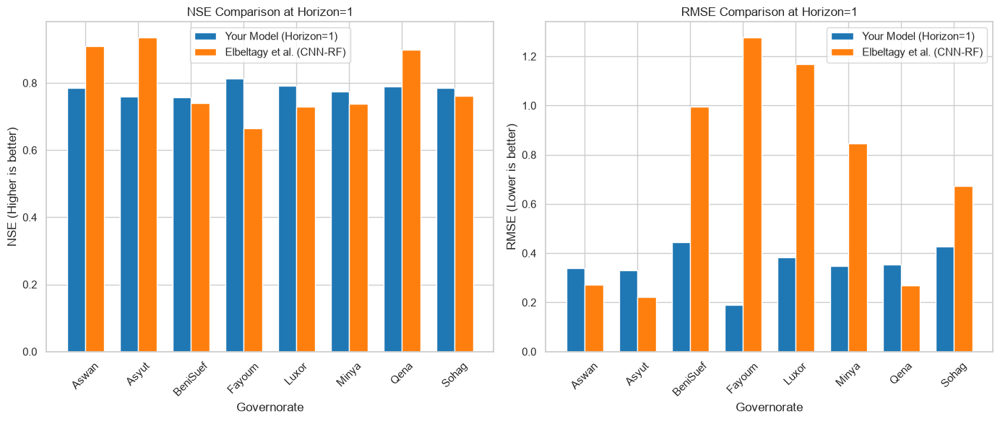

In [46]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# Set chart theme
sns.set_theme(style="whitegrid")

# Path to governorate_benchmark_metrics.csv
file_path = os.path.join(globals().get("MODELS_DIR", os.path.join(os.getcwd(), "nileguard_models")), "governorate_benchmark_metrics.csv")

# Fallback path if running from same folder
if not os.path.exists(file_path):
    file_path = "governorate_benchmark_metrics.csv"

print(f"Reading file from: {file_path}")
df_bm = pd.read_csv(file_path)

# Filter for Horizon == 1 (as integer)
df_your_h1 = df_bm[df_bm['Horizon'] == 1].copy()
df_your_h1 = df_your_h1.rename(columns={'NSE': 'NSE_Your', 'RMSE': 'RMSE_Your'})

# Elbeltagy et al. Baseline Performance (Table 3)
beltagy_data = [
    {'Governorate': 'Aswan',    'NSE_Beltagy': 0.9100, 'RMSE_Beltagy': 0.2730},
    {'Governorate': 'Asyut',    'NSE_Beltagy': 0.9350, 'RMSE_Beltagy': 0.2210},
    {'Governorate': 'BeniSuef', 'NSE_Beltagy': 0.7400, 'RMSE_Beltagy': 0.9940},
    {'Governorate': 'Fayoum',   'NSE_Beltagy': 0.6640, 'RMSE_Beltagy': 1.2760},
    {'Governorate': 'Luxor',    'NSE_Beltagy': 0.7290, 'RMSE_Beltagy': 1.1690},
    {'Governorate': 'Minya',    'NSE_Beltagy': 0.7380, 'RMSE_Beltagy': 0.8460},
    {'Governorate': 'Qena',     'NSE_Beltagy': 0.8990, 'RMSE_Beltagy': 0.2690},
    {'Governorate': 'Sohag',    'NSE_Beltagy': 0.7610, 'RMSE_Beltagy': 0.6730}
]
df_beltagy = pd.DataFrame(beltagy_data)

# Merge datasets for comparison
df_comp = pd.merge(df_your_h1[['Governorate', 'NSE_Your', 'RMSE_Your']], df_beltagy, on='Governorate')

print("\n=== Performance Comparison Summary (Horizon = 1) ===")
print(df_comp.to_string(index=False))

# Visualization
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

x = np.arange(len(df_comp['Governorate']))
width = 0.35

# NSE Comparison
axes[0].bar(x - width/2, df_comp['NSE_Your'], width, label='Your Model (Horizon=1)', color='#1f77b4')
axes[0].bar(x + width/2, df_comp['NSE_Beltagy'], width, label='Elbeltagy et al. (CNN-RF)', color='#ff7f0e')
axes[0].set_xlabel('Governorate')
axes[0].set_ylabel('NSE (Higher is better)')
axes[0].set_title('NSE Comparison at Horizon=1')
axes[0].set_xticks(x)
axes[0].set_xticklabels(df_comp['Governorate'], rotation=45)
axes[0].legend()

# RMSE Comparison
axes[1].bar(x - width/2, df_comp['RMSE_Your'], width, label='Your Model (Horizon=1)', color='#1f77b4')
axes[1].bar(x + width/2, df_comp['RMSE_Beltagy'], width, label='Elbeltagy et al. (CNN-RF)', color='#ff7f0e')
axes[1].set_xlabel('Governorate')
axes[1].set_ylabel('RMSE (Lower is better)')
axes[1].set_title('RMSE Comparison at Horizon=1')
axes[1].set_xticks(x)
axes[1].set_xticklabels(df_comp['Governorate'], rotation=45)
axes[1].legend()

plt.tight_layout()
plt.show()

PDSI (scaled)  min/max: -1.7027972 7.150349
PDSI (real)    min/max: -5.824055870996489 19.67300547289682
Samples: 6048 | Features: ['target_lag_1', 'target_lag_2', 'target_lag_3', 'target_lag_6', 'target_lag_12', 'gov_id_Aswan', 'gov_id_Asyut', 'gov_id_BeniSuef', 'gov_id_Fayoum', 'gov_id_Luxor', 'gov_id_Minya', 'gov_id_Qena', 'gov_id_Sohag']
Model: RandomForestRegressor (trained on REAL PDSI)
Training-fit R² (reference only): 0.8720

Aswan      last known (real PDSI) = -1.178
           next 12 months = [-1.103 -0.922 -0.932 -0.937 -0.932 -0.934 -0.923 -0.941 -0.942 -0.941
 -0.94  -0.937]


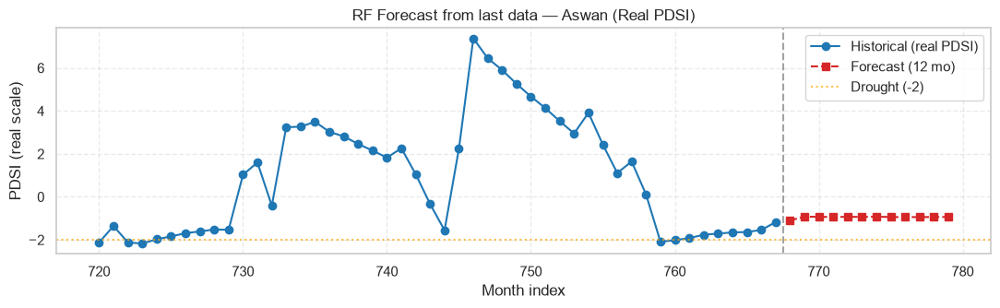

Asyut      last known (real PDSI) = -1.831
           next 12 months = [-1.73  -1.469 -1.44  -1.453 -1.458 -1.46  -1.451 -1.454 -1.452 -1.444
 -1.459 -1.451]


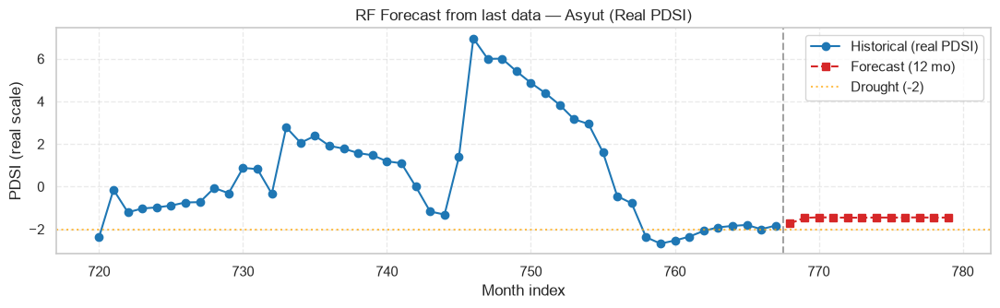

BeniSuef   last known (real PDSI) = -2.372
           next 12 months = [-2.233 -2.001 -1.954 -1.984 -1.973 -1.98  -1.947 -1.924 -1.929 -1.741
 -1.557 -1.437]


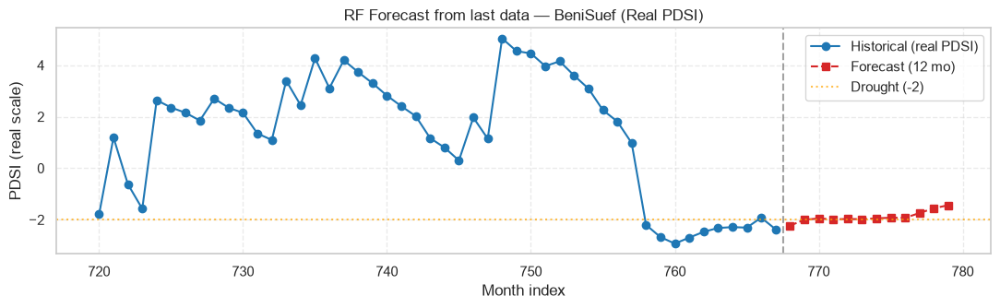

Fayoum     last known (real PDSI) = -1.477
           next 12 months = [-1.383 -1.259 -1.207 -1.165 -1.056 -0.974 -0.913 -0.928 -0.926 -0.953
 -0.939 -0.941]


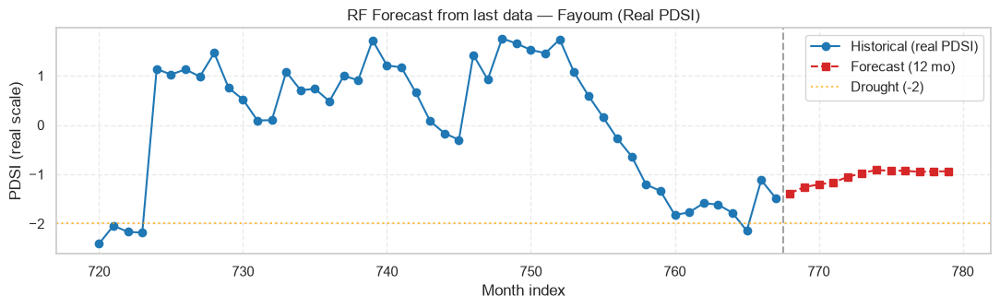

Luxor      last known (real PDSI) = -1.433
           next 12 months = [-1.355 -1.158 -1.104 -0.945 -0.932 -0.935 -0.941 -0.941 -0.941 -0.925
 -0.925 -0.942]


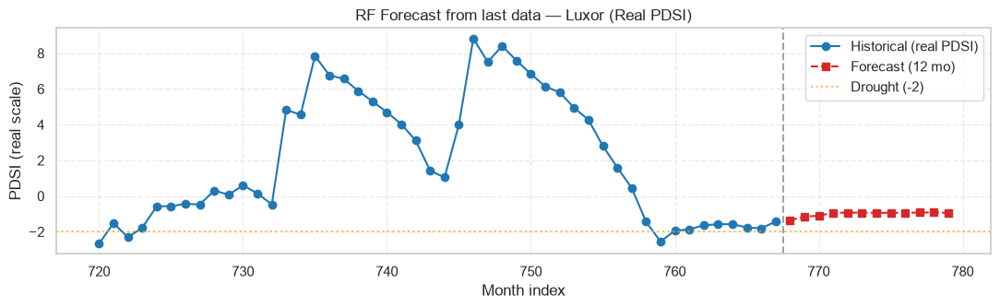

Minya      last known (real PDSI) = -2.077
           next 12 months = [-1.913 -1.848 -1.822 -1.673 -1.498 -1.435 -1.427 -1.451 -1.449 -1.44
 -1.453 -1.447]


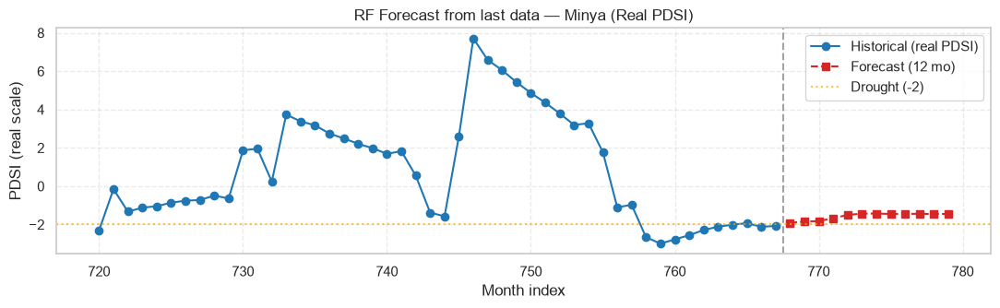

Qena       last known (real PDSI) = -2.749
           next 12 months = [-2.213 -1.903 -1.87  -1.828 -1.702 -1.33  -1.26  -1.217 -1.179 -1.139
 -1.063 -0.988]


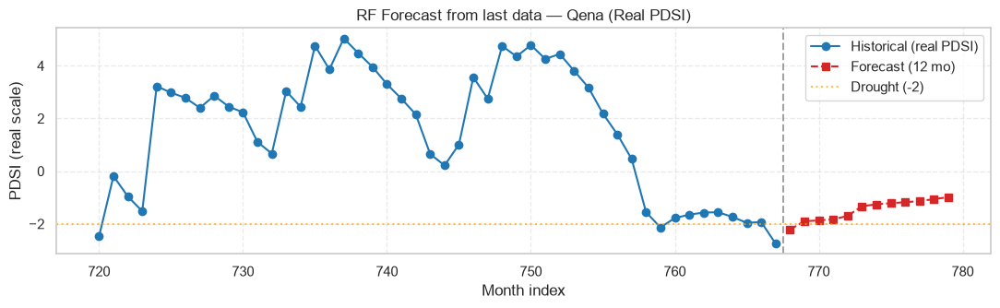

Sohag      last known (real PDSI) = -1.212
           next 12 months = [-1.183 -1.05  -0.949 -0.903 -0.904 -0.935 -0.937 -0.928 -0.934 -0.936
 -0.935 -0.935]


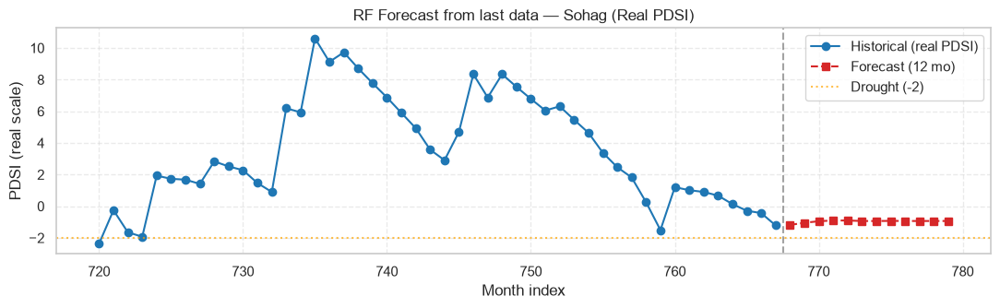


Done. Results in future_forecasts (real PDSI scale)


In [47]:
# ============================================================
# STEP 0: INVERSE-TRANSFORM PDSI TO REAL SCALE
# ============================================================

# --- 1) Get the fitted PDSI scaler (reuse if already loaded, else search disk) ---
pdsi_scaler = globals().get("pdsi_scaler", None)

if pdsi_scaler is None:
    # Try to find the scaler .joblib file automatically (Kaggle input or local data dir)
    search_dirs = ["/kaggle/input", str(globals().get("DATA_DIR", "data"))]
    scaler_path = None
    for base in search_dirs:
        if not os.path.exists(base):
            continue
        for root, dirs, files in os.walk(base):
            for f in files:
                if f.endswith(".joblib") and "scaler" in f.lower():
                    scaler_path = os.path.join(root, f)
                    break
            if scaler_path:
                break
        if scaler_path:
            break

    if scaler_path is None:
        raise FileNotFoundError(
        )

    scalers = joblib.load(scaler_path)
    pdsi_scaler = scalers["PDSI"] if isinstance(scalers, dict) else scalers
    print(f" PDSI scaler loaded from: {scaler_path}")

# --- 2) Inverse-transform the FULL pdsi tensor (preserves original shape) ---
def inverse_transform_pdsi_array(pdsi_arr, scaler):

    arr = np.asarray(pdsi_arr, dtype=np.float64)
    original_shape = arr.shape

    flat = arr.reshape(-1, 1)
    nan_mask = np.isnan(flat).ravel()

    flat_clean = flat.copy()
    flat_clean[nan_mask] = 0.0  # placeholder, restored to NaN after

    inv_flat = scaler.inverse_transform(flat_clean)
    inv_flat[nan_mask] = np.nan

    return inv_flat.reshape(original_shape)

pdsi_data = globals().get("pdsi")
if pdsi_data is None:
    raise ValueError("Need 'pdsi' in globals(). Run CELL 4–6 first.")

pdsi_real = inverse_transform_pdsi_array(pdsi_data, pdsi_scaler)

print("PDSI (scaled)  min/max:", np.nanmin(pdsi_data), np.nanmax(pdsi_data))
print("PDSI (real)    min/max:", np.nanmin(pdsi_real), np.nanmax(pdsi_real))


# ============================================================
# FULL PIPELINE (Random Forest only) — ON REAL PDSI
# build → train → forecast
# ============================================================
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score

N_FUTURE = 12
LAGS = [1, 2, 3, 6, 12]
SEED = globals().get("SEED", 42)

masks = globals().get("gov_masks")
if masks is None:
    raise ValueError("Need 'gov_masks'. Run CELL 4–6 first.")

# ---------- 1) Build lag features (on REAL PDSI) ----------
forecast_dfs = []
for gov_name, mask in masks.items():
    targets = np.nanmean(pdsi_real[:, mask], axis=1).astype(float)
    targets = np.nan_to_num(targets, nan=np.nanmean(targets))
    df_t = pd.DataFrame({"target": targets})
    for lag in LAGS:
        df_t[f"target_lag_{lag}"] = df_t["target"].shift(lag)
    df_t["gov_id"] = gov_name
    df_t = df_t.dropna().reset_index(drop=True)
    forecast_dfs.append(df_t)

df_forecast_all = pd.concat(forecast_dfs, axis=0).reset_index(drop=True)
X_forecast = df_forecast_all.drop(columns=["target"])
y_forecast = df_forecast_all["target"]

X_train_forecast = pd.get_dummies(X_forecast, columns=["gov_id"], drop_first=False)
y_train_forecast = np.asarray(y_forecast, dtype=float)
feature_cols = list(X_train_forecast.columns)

print(f"Samples: {len(X_train_forecast)} | Features: {feature_cols}")

# ---------- 2) Train Random Forest ----------
forecast_model = RandomForestRegressor(
    n_estimators=300,
    max_depth=8,
    min_samples_leaf=3,
    random_state=SEED,
    n_jobs=-1,
)
forecast_model.fit(X_train_forecast, y_train_forecast)

r2_check = r2_score(y_train_forecast, forecast_model.predict(X_train_forecast))
print(f"Model: RandomForestRegressor (trained on REAL PDSI)")
print(f"Training-fit R² (reference only): {r2_check:.4f}\n")

# ---------- 3) Recursive forecast from last known month (REAL PDSI) ----------
future_forecasts = {}

for gov_name, mask in masks.items():
    series = np.nanmean(pdsi_real[:, mask], axis=1).astype(float)
    series = np.nan_to_num(series, nan=np.nanmean(series))

    history = list(series)
    preds = []
    for _ in range(N_FUTURE):
        row = {f"target_lag_{lag}": history[-lag] for lag in LAGS}
        for col in feature_cols:
            if col.startswith("gov_id_"):
                row[col] = 1.0 if col == f"gov_id_{gov_name}" else 0.0
        x = pd.DataFrame([row], columns=feature_cols)
        y_hat = float(forecast_model.predict(x)[0])
        preds.append(y_hat)
        history.append(y_hat)

    preds = np.array(preds)
    future_forecasts[gov_name] = preds

    print(f"{gov_name:<10} last known (real PDSI) = {series[-1]:.3f}")
    print(f"           next {N_FUTURE} months = {np.round(preds, 3)}")

    n_show = min(48, len(series))
    t_hist = np.arange(len(series) - n_show, len(series))
    t_fut  = np.arange(len(series), len(series) + N_FUTURE)

    plt.figure(figsize=(11, 3.5))
    plt.plot(t_hist, series[-n_show:], "o-", color="#1f77b4", label="Historical (real PDSI)")
    plt.plot(t_fut, preds, "s--", color="#d62728", label=f"Forecast ({N_FUTURE} mo)")
    plt.axvline(len(series) - 0.5, color="k", ls="--", alpha=0.4)
    plt.axhline(-2.0, color="orange", ls=":", alpha=0.7, label="Drought (-2)")
    plt.title(f"RF Forecast from last data — {gov_name} (Real PDSI)")
    plt.xlabel("Month index")
    plt.ylabel("PDSI (real scale)")
    plt.legend()
    plt.grid(True, ls="--", alpha=0.4)
    plt.tight_layout()
    plt.show()

print("\nDone. Results in future_forecasts (real PDSI scale)")

In [48]:
# ============================================================
# Cell 23 (RF version): Train the dedicated forecasting model (on ALL available data)
# ============================================================
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
import pandas as pd

# --- RF needs gov_id one-hot encoded (unlike XGBoost, no native categorical support) ---
X_forecast_rf = pd.get_dummies(X_forecast, columns=["gov_id"], drop_first=False)
feature_cols_rf = list(X_forecast_rf.columns)  # save for later use in forecast_governorate()

forecast_model = RandomForestRegressor(
    n_estimators=300,
    max_depth=8,
    min_samples_leaf=3,
    random_state=SEED,
    n_jobs=-1,
)

forecast_model.fit(X_forecast_rf, y_forecast)

train_preds_check = forecast_model.predict(X_forecast_rf)
r2_check = r2_score(y_forecast, train_preds_check)
print(f"Forecasting model fit R² (on all data, for reference only): {r2_check:.4f}")
print("\n(Note: this is a training-fit number, not a generalization estimate — "
      "run the honest chronological holdout check (Cell 22b) BEFORE this cell "
      "to get the real out-of-sample R² for this RF forecasting model.)")

Forecasting model fit R² (on all data, for reference only): 0.8720

(Note: this is a training-fit number, not a generalization estimate — run the honest chronological holdout check (Cell 22b) BEFORE this cell to get the real out-of-sample R² for this RF forecasting model.)


In [49]:
# ============================================================
# Cell 22b (RF version): HONEST OUT-OF-SAMPLE VALIDATION
# Run this to get the real generalization number for the RF forecasting model.
# ============================================================
TEST_FRAC_CHECK = 0.15  # last 15% of each governorate's timeline held out

train_parts, test_parts = [], []

for df_lagged in forecast_dfs:  # per-governorate DataFrames from Cell 22, still chronological
    n = len(df_lagged)
    split_idx = int(n * (1 - TEST_FRAC_CHECK))
    train_parts.append(df_lagged.iloc[:split_idx])
    test_parts.append(df_lagged.iloc[split_idx:])

df_train_check = pd.concat(train_parts, axis=0).reset_index(drop=True)
df_test_check  = pd.concat(test_parts,  axis=0).reset_index(drop=True)

X_train_check = df_train_check.drop(columns=["target"])
y_train_check = df_train_check["target"]
X_test_check  = df_test_check.drop(columns=["target"])
y_test_check  = df_test_check["target"]

# --- RF needs one-hot, and train/test must share the EXACT same columns ---
X_train_check_rf = pd.get_dummies(X_train_check, columns=["gov_id"], drop_first=False)
X_test_check_rf  = pd.get_dummies(X_test_check,  columns=["gov_id"], drop_first=False)

# Align test columns to train columns (in case a gov_id is missing from one side)
X_test_check_rf = X_test_check_rf.reindex(columns=X_train_check_rf.columns, fill_value=0)

print(f"Honest holdout — train: {len(X_train_check_rf)} | test: {len(X_test_check_rf)}")

honest_model = RandomForestRegressor(
    n_estimators=300,
    max_depth=8,
    min_samples_leaf=3,
    random_state=SEED,
    n_jobs=-1,
)
honest_model.fit(X_train_check_rf, y_train_check)

test_preds_check = honest_model.predict(X_test_check_rf)
honest_r2 = r2_score(y_test_check, test_preds_check)
print(f"\n HONEST out-of-sample R² (chronological holdout): {honest_r2:.4f}")

# Per-governorate breakdown
gov_id_col_map = {col: col.replace("gov_id_", "") for col in X_test_check_rf.columns if col.startswith("gov_id_")}
print(f"\n{'Governorate':<12}{'Holdout R²':>12}{'n_test':>10}")
print("-" * 36)
for col, gov_name in gov_id_col_map.items():
    mask = X_test_check_rf[col] == 1
    if mask.sum() > 1:
        gov_r2 = r2_score(y_test_check[mask.values], test_preds_check[mask.values])
        print(f"{gov_name:<12}{gov_r2:>12.4f}{mask.sum():>10}")
    else:
        print(f"{gov_name:<12}{'n/a':>12}{mask.sum():>10}")

print(f"\nTraining-fit R² (Cell 23):     0.8720")
print(f"Honest out-of-sample R² (here): {honest_r2:.4f}")
gap = 0.8720 - honest_r2
print(f"Gap:                            {gap:.4f}")
if gap < 0.10:
    print("Status: Small gap — the model generalizes well, these numbers are trustworthy.")
elif gap < 0.20:
    print("Status: Moderate gap — noticeable overfitting, treat future forecasts with caution.")
else:
    print("Status: Large gap — clear overfitting, RF is memorizing rather than learning a real pattern.")

Honest holdout — train: 5136 | test: 912

 HONEST out-of-sample R² (chronological holdout): 0.8027

Governorate   Holdout R²    n_test
------------------------------------
Aswan             0.7918       114
Asyut             0.7873       114
BeniSuef          0.7475       114
Fayoum            0.7440       114
Luxor             0.8101       114
Minya             0.7573       114
Qena              0.7675       114
Sohag             0.8213       114

Training-fit R² (Cell 23):     0.8720
Honest out-of-sample R² (here): 0.8027
Gap:                            0.0693
Status: Small gap — the model generalizes well, these numbers are trustworthy.


In [50]:
# ============================================================
# Cell 24 (RF version, fixed): Recursive forecasting function
# ============================================================
def forecast_governorate(gov_name, n_months_ahead, model, lags, feature_cols, masks, pdsi_real):
    """
    Recursively forecast n_months_ahead future PDSI values (real scale) for one governorate.
    Uses RF + one-hot gov_id encoding, matching Cell 22/23's feature layout.
    """
    mask = masks[gov_name]
    series = np.nanmean(pdsi_real[:, mask], axis=1).astype(float)
    series = np.nan_to_num(series, nan=np.nanmean(series))

    history = list(series.copy())

    forecasts = []
    for step in range(n_months_ahead):
        row = {f"target_lag_{lag}": history[-lag] for lag in lags}
        for col in feature_cols:
            if col.startswith("gov_id_"):
                row[col] = 1.0 if col == f"gov_id_{gov_name}" else 0.0

        X_row = pd.DataFrame([row]).reindex(columns=feature_cols, fill_value=0.0)
        pred = float(model.predict(X_row)[0])

        forecasts.append(pred)
        history.append(pred)

    return np.array(forecasts)


print("forecast_governorate() redefined (RF version, fixed).")

forecast_governorate() redefined (RF version, fixed).


In [51]:
# ============================================================
# Cell 25 (RF version): Run forecast for ALL governorates, 12 months ahead
# ============================================================
N_MONTHS_AHEAD = 12

future_forecasts = {}

for gov_name in masks:
    future_real = forecast_governorate(
        gov_name=gov_name,
        n_months_ahead=N_MONTHS_AHEAD,
        model=forecast_model,
        lags=LAGS,
        feature_cols=feature_cols_rf,
        masks=masks,
        pdsi_real=pdsi_real,
    )

    future_forecasts[gov_name] = future_real

    print(f"\nForecast for {gov_name} — next {N_MONTHS_AHEAD} months (real PDSI):")
    for i, val in enumerate(future_real, 1):
        print(f"  Month +{i}: PDSI = {val:.3f}")

print("\nDone. All forecasts stored in future_forecasts dict.")


Forecast for Aswan — next 12 months (real PDSI):
  Month +1: PDSI = -1.103
  Month +2: PDSI = -0.922
  Month +3: PDSI = -0.932
  Month +4: PDSI = -0.937
  Month +5: PDSI = -0.932
  Month +6: PDSI = -0.934
  Month +7: PDSI = -0.923
  Month +8: PDSI = -0.941
  Month +9: PDSI = -0.942
  Month +10: PDSI = -0.941
  Month +11: PDSI = -0.940
  Month +12: PDSI = -0.937

Forecast for Asyut — next 12 months (real PDSI):
  Month +1: PDSI = -1.730
  Month +2: PDSI = -1.469
  Month +3: PDSI = -1.440
  Month +4: PDSI = -1.453
  Month +5: PDSI = -1.458
  Month +6: PDSI = -1.460
  Month +7: PDSI = -1.451
  Month +8: PDSI = -1.454
  Month +9: PDSI = -1.452
  Month +10: PDSI = -1.444
  Month +11: PDSI = -1.459
  Month +12: PDSI = -1.451

Forecast for BeniSuef — next 12 months (real PDSI):
  Month +1: PDSI = -2.233
  Month +2: PDSI = -2.001
  Month +3: PDSI = -1.954
  Month +4: PDSI = -1.984
  Month +5: PDSI = -1.973
  Month +6: PDSI = -1.980
  Month +7: PDSI = -1.947
  Month +8: PDSI = -1.924
  Month +

In [52]:
# ============================================================
# Cell 28 (RF version): Rolling one-month-ahead forecast (using real data each step)
# ============================================================
def rolling_one_month_forecast(gov_name, model, lags, feature_cols, masks, pdsi_real, test_frac):
    """
    At each point in the test period, forecast exactly 1 month ahead
    using REAL historical values (never previous forecasts).
    """
    mask = masks[gov_name]
    real_series = np.nanmean(pdsi_real[:, mask], axis=1).astype(float)
    real_series = np.nan_to_num(real_series, nan=np.nanmean(real_series))

    max_lag = max(lags)
    n = len(real_series)
    test_split = int(n * (1 - test_frac))

    actuals, preds = [], []
    for t in range(test_split, n):
        if t - max_lag < 0:
            continue
        row = {f"target_lag_{lag}": real_series[t - lag] for lag in lags}  # REAL values, not forecasts
        for col in feature_cols:
            if col.startswith("gov_id_"):
                row[col] = 1.0 if col == f"gov_id_{gov_name}" else 0.0

        X_row = pd.DataFrame([row]).reindex(columns=feature_cols, fill_value=0.0)
        pred = float(model.predict(X_row)[0])

        actuals.append(real_series[t])
        preds.append(pred)

    return np.array(actuals), np.array(preds)


TEST_FRAC_CHECK_ROLLING = 0.15  # same holdout fraction used in Cell 22b

all_actuals, all_preds = [], []
print(f"{'Governorate':<12}{'Rolling 1-month R²'}")
print("-" * 35)

for gov_name in masks:
    actuals, preds = rolling_one_month_forecast(
        gov_name, forecast_model, LAGS, feature_cols_rf, masks, pdsi_real,
        test_frac=TEST_FRAC_CHECK_ROLLING
    )
    gov_r2 = r2_score(actuals, preds)
    print(f"{gov_name:<12}{gov_r2:.4f}")
    all_actuals.extend(actuals)
    all_preds.extend(preds)

overall_r2 = r2_score(all_actuals, all_preds)
print("-" * 35)
print(f"{'Overall':<12}{overall_r2:.4f}")

Governorate Rolling 1-month R²
-----------------------------------
Aswan       0.8698
Asyut       0.8491
BeniSuef    0.8328
Fayoum      0.7802
Luxor       0.8979
Minya       0.8473
Qena        0.8452
Sohag       0.8970
-----------------------------------
Overall     0.8756


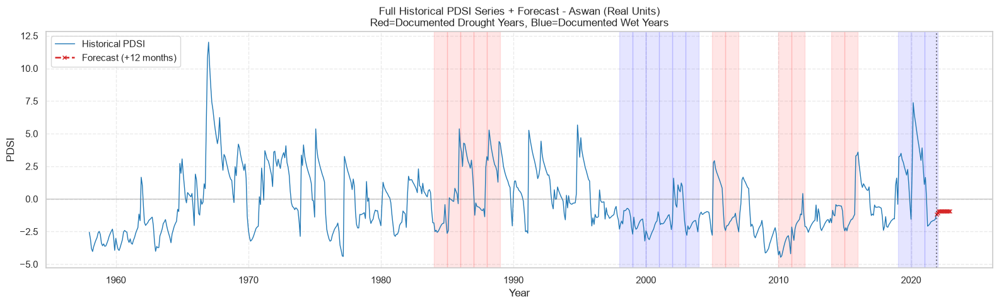

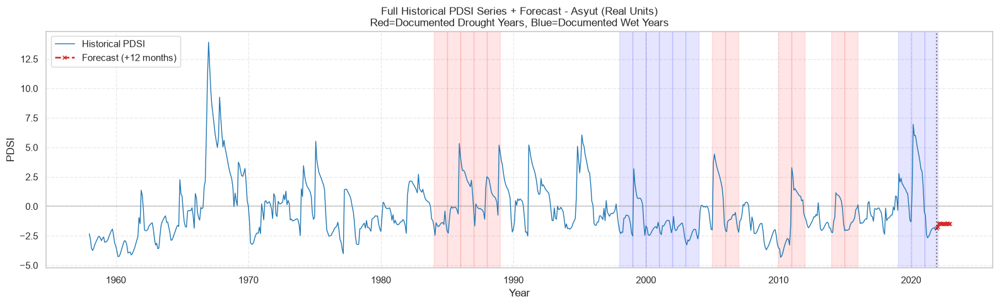

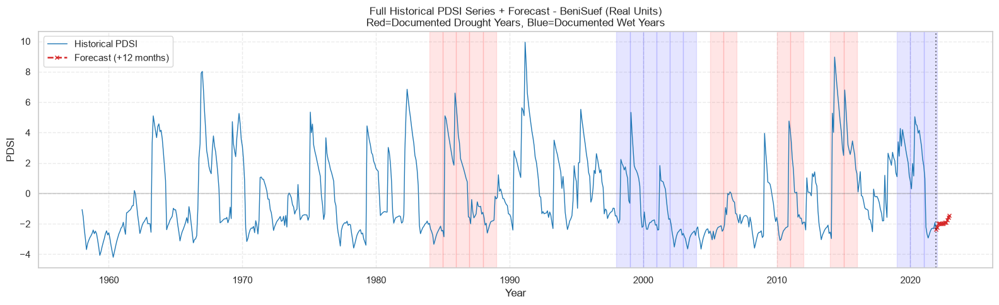

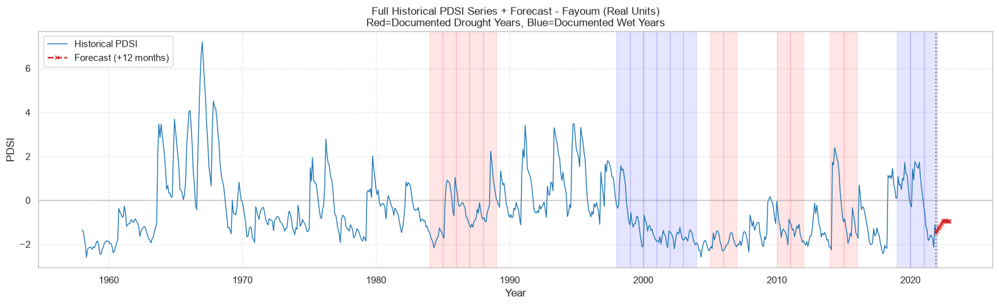

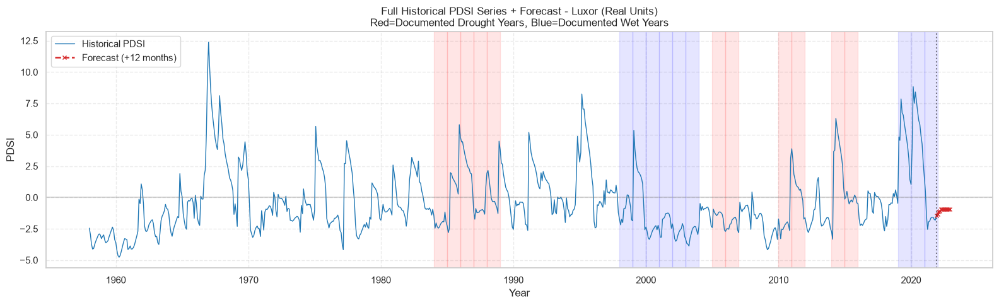

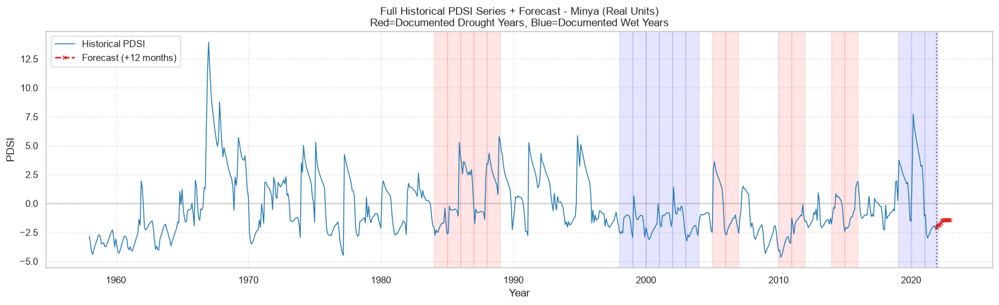

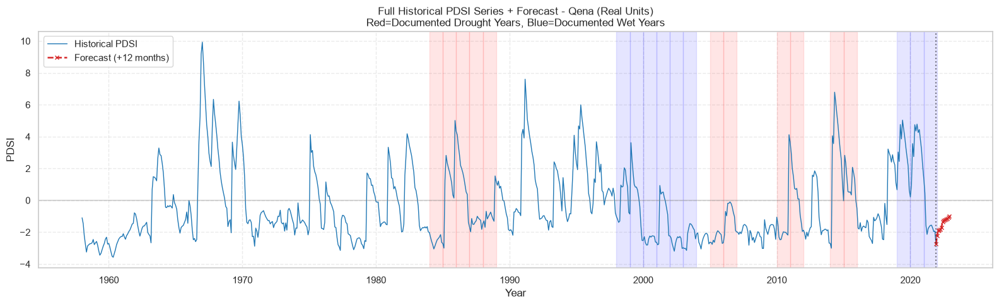

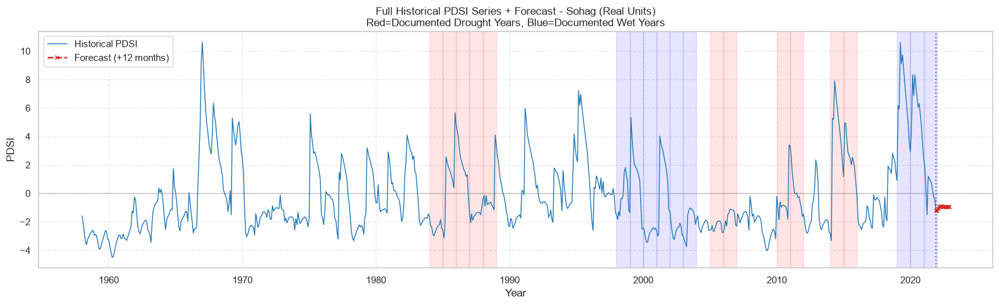

In [57]:
# ============================================================
# Cell 31 (RF version): Plot full historical series + forecast, with documented drought years marked
# — ALL 8 GOVERNORATES —
# ============================================================
import pandas as pd
import matplotlib.pyplot as plt

DATA_START_YEAR = 1958  # TerraClimate series start (as used elsewhere in the notebook)

# Documented drought years (Nile Basin Initiative, Britannica, MDPI review)
documented_droughts = [1984, 1985, 1986, 1987, 1988, 2005, 2006, 2010, 2011, 2014, 2015]

# Documented wet years (Lake Nasser filled)
documented_wet = list(range(1998, 2004)) + list(range(2019, 2023))

# Forecasts computed earlier (Cell 25 RF version) — dict: gov_name -> array of future PDSI values
future_forecasts = globals().get("future_forecasts", {})

for gov_name in masks.keys():

    # --- Build a date-indexed real-PDSI series for this governorate ---
    mask = masks[gov_name]
    series_real = np.nanmean(pdsi_real[:, mask], axis=1).astype(float)
    series_real = np.nan_to_num(series_real, nan=np.nanmean(series_real))

    date_index = pd.date_range(start=f"{DATA_START_YEAR}-01-01", periods=len(series_real), freq="MS")
    pdsi_df = pd.DataFrame({"date": date_index, "PDSI": series_real})

    # --- Build the forecast segment (continues right after the last historical month) ---
    forecast_vals = future_forecasts.get(gov_name)
    if forecast_vals is not None:
        forecast_vals = np.asarray(forecast_vals).ravel()
        forecast_dates = pd.date_range(
            start=date_index[-1] + pd.DateOffset(months=1),
            periods=len(forecast_vals),
            freq="MS"
        )
        # bridge point so the forecast line connects to the historical line
        bridge_dates = pd.DatetimeIndex([date_index[-1]]).append(forecast_dates)
        bridge_vals = np.concatenate([[series_real[-1]], forecast_vals])

    # --- Plot ---
    plt.figure(figsize=(16, 5))
    plt.plot(pdsi_df["date"], pdsi_df["PDSI"], color="#1f77b4", linewidth=1, label="Historical PDSI")

    if forecast_vals is not None:
        plt.plot(
            bridge_dates, bridge_vals,
            color="#d62728", linewidth=1.8, linestyle="--",
            marker="x", markersize=4,
            label=f"Forecast (+{len(forecast_vals)} months)"
        )
        plt.axvline(date_index[-1], color="black", linestyle=":", alpha=0.5)

    plt.axhline(y=0, color='gray', linestyle='-', alpha=0.3)

    for yr in documented_droughts:
        plt.axvspan(pd.Timestamp(f"{yr}-01-01"), pd.Timestamp(f"{yr}-12-31"), color='red', alpha=0.1)

    for yr in documented_wet:
        if yr <= 2021:
            plt.axvspan(pd.Timestamp(f"{yr}-01-01"), pd.Timestamp(f"{yr}-12-31"), color='blue', alpha=0.1)

    plt.title(
        f"Full Historical PDSI Series + Forecast - {gov_name} (Real Units)\n"
        f"Red=Documented Drought Years, Blue=Documented Wet Years",
        fontsize=12
    )
    plt.xlabel("Year")
    plt.ylabel("PDSI")
    plt.legend(loc="upper left")
    plt.grid(True, linestyle="--", alpha=0.4)
    plt.tight_layout()
    plt.show()